This notebook serves as a comprehensive description of relative humidity prediction conducted by a neural network over a specific area of interest. The prediction model combines localized sensor data with global climate information obtained from the ERA5 database and ARPA stations.

The primary objective is to train the neural network to predict relative humidity at specific locations within the study area. These locations are equipped with Bluetooth sensors that record the local relative humidity. The neural network utilizes climate data as inputs, which are derived from the ERA5 database and ARPA stations. These data are computed based on the sensor locations and include the following variables:

- Shortwave radiation
- Longwave radiation
- Wind speed
- Reference temperature
- Reference relative humidity (uniform across sensor locations)
- Precipitation (uniform across sensor locations)
- Pressure (uniform across sensor locations)
- Cloud cover (uniform across sensor locations)
- Specific humidity (uniform across sensor locations)

The data mentioned above are computed for the sensor locations using a physical model that incorporates global climate data and terrain features to downscale the climate variables within the study area.

The notebook is organized into three main sections:

1. The first section provides a detailed example of how the input data are handled, how the model is constructed, and how to evaluate the model's characteristics.

2. The second section loads the data related to the terrain properties of the study area.

3. The final section establishes the models for all relevant time periods using data acquired from both the ERA5 dataset and the integration of ERA5 database with data collected by the ARPA station.

4. The fourth section shows the evolution of the MAE differences between the ERA5 database and the ARPA station

5. The last section shows how to predict the relative humidity over the whole study area for a period of interest

The following python packages are imported:

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import sys
import os
import copy
import pickle
import random

import matplotlib as mpl
mpl.rcParams["font.family"] = "Times New Roman"

from scipy.stats import linregress

import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, Input, Flatten

from sklearn.linear_model import LinearRegression

# Check for TensorFlow GPU access
print(f"TensorFlow has access to the following devices:\n{tf.config.list_physical_devices()}")
# Check TensorFlow version
print(f"TensorFlow version: {tf.__version__}")
print(f"Keras version: {tf.keras.__version__}")
gpu = len(tf.config.list_physical_devices('GPU')) > 0
print('GPU is available:',gpu)

DATETIME = datetime.now().strftime("%d-%m-%Y_%H-%M-%S") 

USER_PATH = '/Users/marcozanchi/Work/Grade/'
DATA_PATH = USER_PATH + 'microclima/data/'
RESULTS_PATH = USER_PATH + 'microclima/notebooks/results/'
LIB_PATH = USER_PATH + 'microclima/lib/'

ModuleNotFoundError: No module named 'tensorflow'

In [ ]:
sys.path.append(LIB_PATH + 'machine_learning')
from machine_learning_ffnn import MachineLearningFFNN

# Example

In this section, an example is presented to showcase the steps involved in preparing the data for the neural network, training it, and analyzing its results. These steps will later be encapsulated within a class for application in the subsequent sections. The example utilizes data collected from sensors and the ERA5 database, covering the period from November 12, 2022, to January 15, 2023.

## Load and split data

The data is extracted from the output dataframes of the 'notebook_physical_model' and stored in a pandas dataframe. This dataframe includes the climate data and sensor recordings for each hour, day, month, and year within the specified period of interest. The sensor data is randomly divided into three sets (according to the sensor nickname): the training set, validation set, and test set.

The training set consists of data from 14 sensors and is used to train the neural network. The validation set, also comprising data from 1 sensor, is employed to validate the training process. The final weights of the neural network are determined by minimizing the loss function over the validation set. The test set, again containing data from 5 sensors, is utilized to assess the accuracy of the neural network.

To ensure reproducibility of the random division, a seed parameter has been defined.

In [3]:
sys.path.append(LIB_PATH + 'machine_learning')
from elaborate_data_utility import load_split_data

In [4]:
df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_01_15/df_microclimate_era5_NovJan_out_13-06-2023_16-59-32.p'
df_train, df_test, df_validation = load_split_data(df_filename, seed = 18, test_train_proportion = 0.4, val_test_proportion = 0.4)


## Prepare input and output

Two arrays have been created from each dataset. The first array contains the input climate data, while the second array contains the target variable, which represents the relative humidity measured by the sensors.

To normalize the input variables, the average and standard deviation have been computed for each input variable for the training set. These statistical measures have been used to transform the input variables, ensuring they are adjusted to a standardized scale, as following:

\begin{equation}
 Input_{normalized} = \frac{Input - m}{std}
\end{equation}

In [8]:
sys.path.append(LIB_PATH + 'machine_learning')
from elaborate_data_utility import get_data_from_df

In [9]:
input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']

X_train, y_train = get_data_from_df(df_train, input_variables = input_variables, target_variable = 'H_target')
X_validation, y_validation = get_data_from_df(df_validation, input_variables = input_variables, target_variable = 'H_target')
X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'H_target')

In [10]:
#normalization
_m = np.mean(X_train, axis=0)
_s = np.std(X_train, axis=0)

X_train = ((X_train - _m) / _s)
X_validation = ((X_validation - _m) / _s)
X_test =  ((X_test - _m) / _s)

train_data_rescale_params = {
    "mean": _m,
    "std": _s
}

## Create the model

The feed forward neural network is implemented using the powerful Keras and TensorFlow libraries, renowned for their extensive capabilities in deep learning. In the present research, a feed forward neural network with four hidden layers is employed. These layers consist of 1024, 512, 256, and 128 neurons, respectively. By incorporating multiple hidden layers, the network can effectively capture intricate patterns and relationships within the input data, enabling more complex computations and higher-level feature extraction. 

To introduce non-linearity and enhance the network's expressive power, a sigmoidal activation function is chosen for the hidden layers. The sigmoid function effectively maps the neuron outputs into a range between 0 and 1, allowing for the representation of non-linear relationships and ensuring efficient gradient propagation during the training process. The sigmoid function is defined as:
\begin{equation}
 \sigma(x) = \frac{1}{1+e^{-x}}
\end{equation}

When evaluating the neural network's performance, the primary loss function used is the Log-Cosh loss, which is particularly suitable for regression problems. It provides a smooth and robust measure of the discrepancy between predicted and target values, accommodating the potential presence of outliers or extreme values in the dataset. It is defined as:
\begin{equation}
 L(y, y^p) = \sum_{i=1}^N log(cosh(y_i^p-y_i))
\end{equation}

Furthermore, the mean squared error (MSE) and mean absolute error (MAE) are also calculated as additional evaluation metrics. While they do not directly influence the selection of the best weights during validation, they provide valuable insights into the overall performance and precision of the neural network. MSE measures the average squared difference between predicted and actual values, emphasizing larger errors, while MAE computes the average absolute difference, providing a more intuitive understanding of the average prediction error. They have been defined as following:
\begin{equation}
 MSE(y, y^p) = \frac{\sum_{i=1}^N (y_i^p-y_i)^2}{N}
\end{equation}
\begin{equation}
 MAE(y, y^p) = \frac{\sum_{i=1}^N |y_i^p-y_i|}{N}
\end{equation}

The Adam optimizer, an advanced gradient descent optimization algorithm, is utilized to minimize the loss function. Adam stands for "Adaptive Moment Estimation" and is widely recognized for its effectiveness in optimizing neural networks.
With Adam, the optimization process is performed by adjusting the network's weights iteratively, leveraging both the first and second moments of the gradients to adaptively update the learning rate for each weight parameter.

In [11]:
sys.path.append(LIB_PATH + 'machine_learning')
from model_utility import create_model

In [12]:
MAX_N_NEURONS = 512
MIN_N_NEURONS = 128
N_LAYERS = 3
SEED = 18

LEARNING_RATE=0.001

ACTIVATION = 'sigmoid'
LOSS = 'log_cosh'
METRICS = ['mean_squared_error','mean_absolute_error']

In [13]:
model = create_model(max_n_neurons = MAX_N_NEURONS, min_n_neurons = MIN_N_NEURONS, n_layers = N_LAYERS, 
                     learning_rate = LEARNING_RATE, activation = ACTIVATION,
                     loss = LOSS, metrics = METRICS, input_shape = X_train[0].shape)
model.summary()

Metal device set to: Apple M1
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 9)]               0         
                                                                 
 dense (Dense)               (None, 512)               5120      
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 dense_3 (Dense)             (None, 1)                 129       
                                                                 
Total params: 169,473
Trainable params: 169,473
Non-trainable params: 0
_________________________________________________________________


2023-06-20 10:34:40.220348: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-06-20 10:34:40.220511: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


## Training

The feed forward neural network undergoes training, where the model's weights are iteratively adjusted to minimize the loss function. At the conclusion of the training phase, the set of weights that yields the lowest validation loss is selected and utilized for subsequent predictions and evaluations.

In [14]:
sys.path.append(LIB_PATH + 'machine_learning')
from model_utility import train_model

sys.path.append(LIB_PATH + 'plotting_methods')
from machine_learning_plots import plot_history

In [15]:
EPOCHS = 20
PATIENCE = 5

In [16]:
model, history_df = train_model(model = model, X_train = X_train, y_train = y_train,
                                X_validation = X_validation, y_validation = y_validation,
                                epochs = EPOCHS, patience = PATIENCE,
                                metric_to_monitor = 'val_loss',restore_best_weights = True,
                                verbose = 1)

Epoch 1/20


2023-06-20 10:34:43.452651: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-06-20 10:34:43.586823: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


585/585 [==============================] - ETA: 0s - loss: 55.4692 - mean_squared_error: 3424.8914 - mean_absolute_error: 56.1620

2023-06-20 10:34:47.010749: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


585/585 [==============================] - 4s 7ms/step - loss: 55.4692 - mean_squared_error: 3424.8914 - mean_absolute_error: 56.1620 - val_loss: 33.6983 - val_mean_squared_error: 1274.7964 - val_mean_absolute_error: 34.3901
Epoch 2/20
585/585 [==============================] - 4s 6ms/step - loss: 15.2521 - mean_squared_error: 370.8201 - mean_absolute_error: 15.9314 - val_loss: 6.7896 - val_mean_squared_error: 101.1149 - val_mean_absolute_error: 7.4551
Epoch 3/20
585/585 [==============================] - 4s 6ms/step - loss: 6.2852 - mean_squared_error: 103.6431 - mean_absolute_error: 6.9387 - val_loss: 6.4458 - val_mean_squared_error: 105.0375 - val_mean_absolute_error: 7.0997
Epoch 4/20
585/585 [==============================] - 4s 6ms/step - loss: 6.2725 - mean_squared_error: 105.0356 - mean_absolute_error: 6.9241 - val_loss: 6.4559 - val_mean_squared_error: 104.6854 - val_mean_absolute_error: 7.1106
Epoch 5/20
585/585 [==============================] - 4s 6ms/step - loss: 6.2724 - 

The trend of the loss function for both the training and validation sets is depicted below:

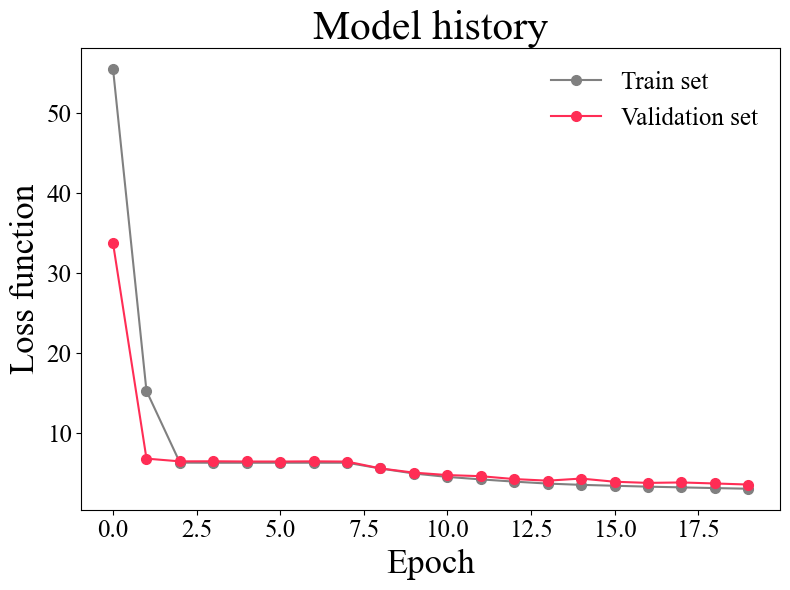

In [17]:
fig, ax = plot_history(history_df, title = 'Model history',
                                   color_train = "0.5",
                                   color_val =  "#ff2d55", 
                                   )

## Model evaluation

The model's accuracy is assessed by evaluating its performance on the test set, using metrics such as mean absolute error and the determination coefficient $R^2$ parameter. To ensure the neural network does not merely replicate the reference relative humidity input, a benchmark error is calculated by treating the reference relative humidity as the "predicted value".

In [18]:
sys.path.append(LIB_PATH + 'plotting_methods')
from machine_learning_plots import plot_results_test_R2, plot_distribution_test_mae

In [19]:
y_test_pred = model.predict(X_test, verbose=0)
y_test_pred = y_test_pred.reshape(len(y_test))
y_bench = df_test.H_ref.values
print('Benchmark vs prediction mae:',np.mean(np.abs(y_test-y_bench)),' ', np.mean(np.abs(y_test-y_test_pred)))
print('Benchmark vs prediction r2:', linregress(y_test, y_bench).rvalue ** 2,' ', linregress(y_test, y_test_pred).rvalue ** 2)

2023-06-20 10:36:07.937563: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 8.636015054579799   3.9660684402874864
Benchmark vs prediction r2: 0.18314172817928184   0.6915444107336589


The figure presented below showcases a scatterplot that illustrates the differences between the true relative humidity values and the corresponding predicted values for each point in the test set. The scatterplots are further divided to distinguish between the daylight (red) and nighttime (lightblue) periods.

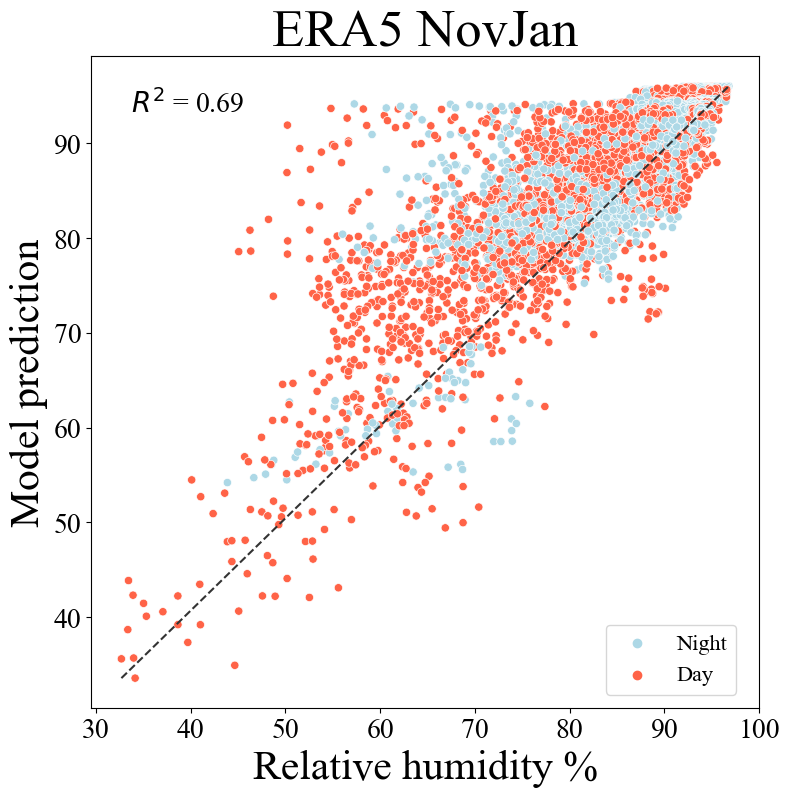

In [20]:
fig,ax = plot_results_test_R2(y_test, y_test_pred, df_test.Hour.values, title='ERA5 NovJan', xlabel = 'Relative humidity %')

The figure below illustrates the distribution of mean absolute errors within the test set, categorized by the daylight (red) and nighttime (lightblue) periods. The histograms have been normalized to ensure that the area under each histogram is equal to 1. The $R^2$ value computed across the entire test set is represent in the upper left corner.

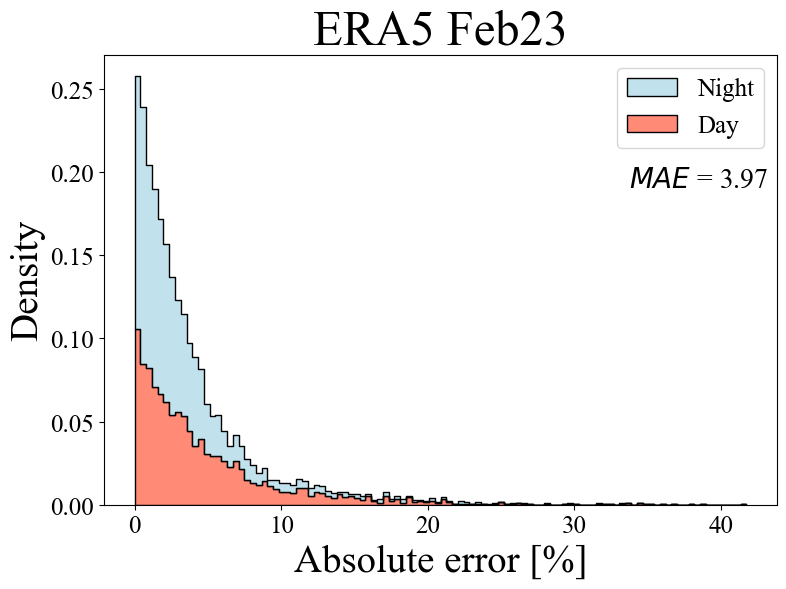

In [21]:
fig,ax = plot_distribution_test_mae(y_test, y_test_pred, df_test.Hour.values,
                               title='ERA5 Feb23', xlabel = "Absolute error [%]",
                               thr=-1,stat='density')


## Model interpretation

In order to address the inherent black-box nature of neural networks, a method is proposed to interpret the significance of input variables on the output. This approach involves systematically replacing each input variable, one at a time, with random values within its minimum and maximum range while keeping the remaining inputs unchanged. 

The neural network is then evaluated using this randomized test set, and both the $R^2$  (coefficient of determination) and MAE (mean absolute error) are computed. These values are then compared to the corresponding values obtained from the original non-randomized test set (as obtained in the previous section).

To account for statistical variations, this randomization process is repeated multiple times. The mean and standard deviation of the differences in $R^2$  and MAE between the randomized and original scenarios are computed to obtain the final values. If a variable exhibits substantial deviations in both $R^2$  and MAE from the original values, it indicates that it plays a crucial role in the prediction process.

In summary, by analyzing the variations in $R^2$  and MAE resulting from input randomization, the importance of each variable in the neural network's prediction can be determined.

The plot below showcases the average variations in $R^2$ and MAE for each input variable, accompanied by error bars representing the standard deviation. These variations are computed by comparing the original values with the values obtained from the randomized inputs.

In [22]:
sys.path.append(LIB_PATH + 'plotting_methods')
from machine_learning_plots import plot_inputs_importance

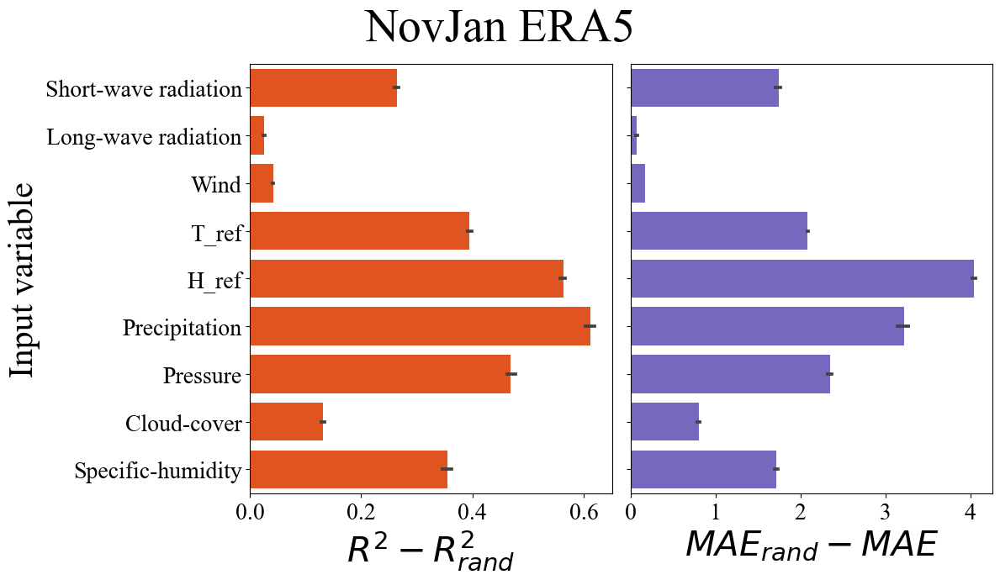

In [23]:
fig, ax = plot_inputs_importance(model, df_test, X_test, y_test, input_variables,
                       n_simul = 3, model_name = 'NovJan ERA5')

## Cross period prediction

The following plots depict the performance of the neural network, which was trained on a specific period, when tested on data collected from another period. This evaluation aims to test the network's ability to reproduce predictions under different climate conditions. The plots include the $R^2$ scores and mean absolute errors for the cross-period predictions.

In [24]:
sys.path.append(LIB_PATH + 'plotting_methods')
from machine_learning_plots import plot_cross_period_prediction

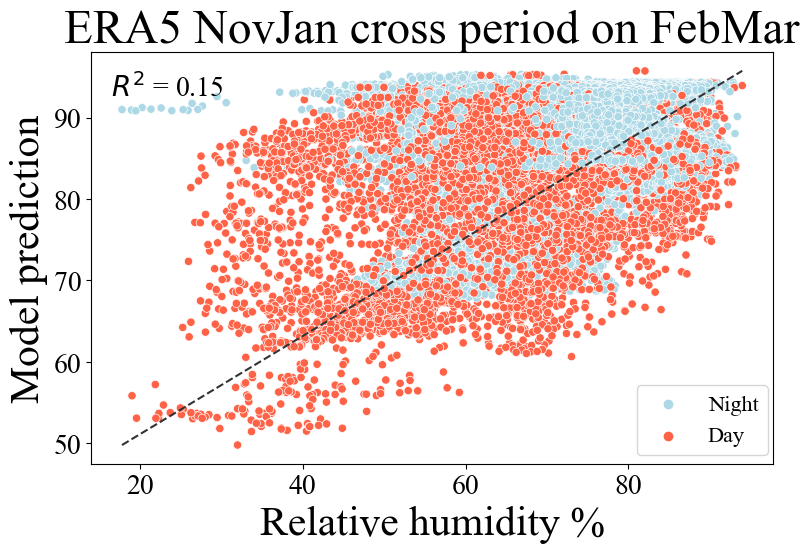

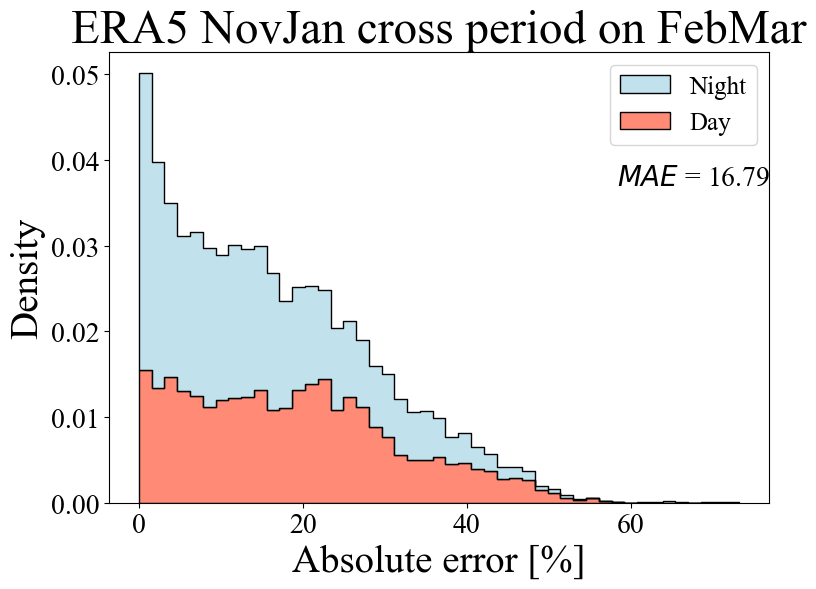

In [25]:
df_filename_cross_period = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_02_01__2023_03_06/df_microclimate_era5_FebMar_out_13-06-2023_16-59-32.p'
input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
target_variable = 'H_target'
period_name_model = 'ERA5 NovJan'
cross_period_name = 'FebMar'


fig_r2, ax_r2, fig_mae, ax_mae = plot_cross_period_prediction(df_filename_cross_period = df_filename_cross_period, model = model, 
                             train_data_rescale_params = train_data_rescale_params, input_variables = input_variables,
                             target_variable = target_variable, 
                             period_name_model = period_name_model, cross_period_name = cross_period_name
                            )




## Spatial prediction over the study area

The neural network, trained on the sensor locations, can be extended to make predictions on relative humidity variations across the entire study area. This extension is made possible by computing the values of the input climate variables over the study area using the physical model described in the 'notebook_physical_model'.

The following plots showcase the predicted relative humidity variations at specific time instances, offering a comprehensive visualization of the relative humidity distribution across the entire study area.

In [26]:
sys.path.append(LIB_PATH + 'physical_model')
from terrain_utility import terrain, skyviewfactor
from utility import smooth

sys.path.append(LIB_PATH + 'plotting_methods')
from machine_learning_plots import plot_microclimate_prediction_over_study_area

In [27]:
lat = 45.7247139
long = 9.6975472

filename = DATA_PATH + 'data_torreboldone/dsm_TorreBoldone.p'    
infile = open(filename, 'rb')
dsm = pickle.load(infile)
dsm = smooth(dsm,smooth_side = 2)
resolution = 2

slope = terrain(dsm, 'slope')
aspect = terrain(dsm, 'aspect')

ha, svf = skyviewfactor(dsm, steps = 36, reso = 2)
study_area_coordinates = [804,619,422,588]
         
df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2022_11_12__2023_01_15.p')

periods = [
    [2023,1,10,10],
    [2023,1,10,11],
    [2023,1,10,13],
    [2023,1,10,14]
]

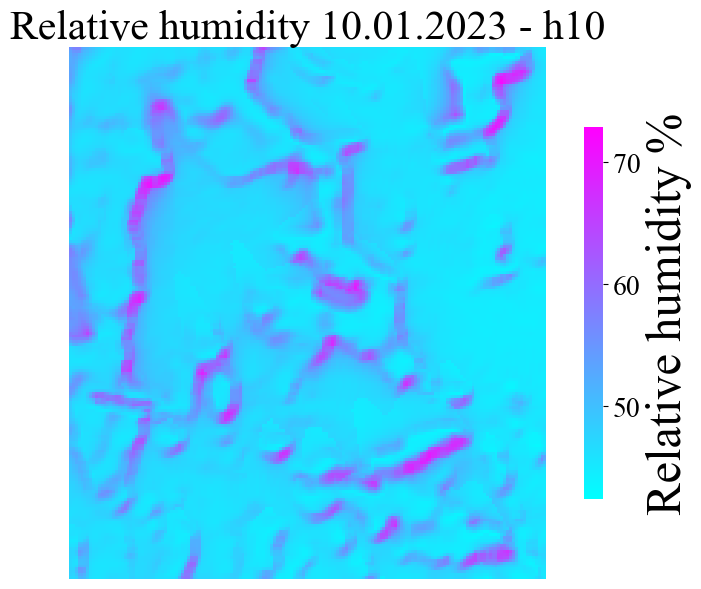

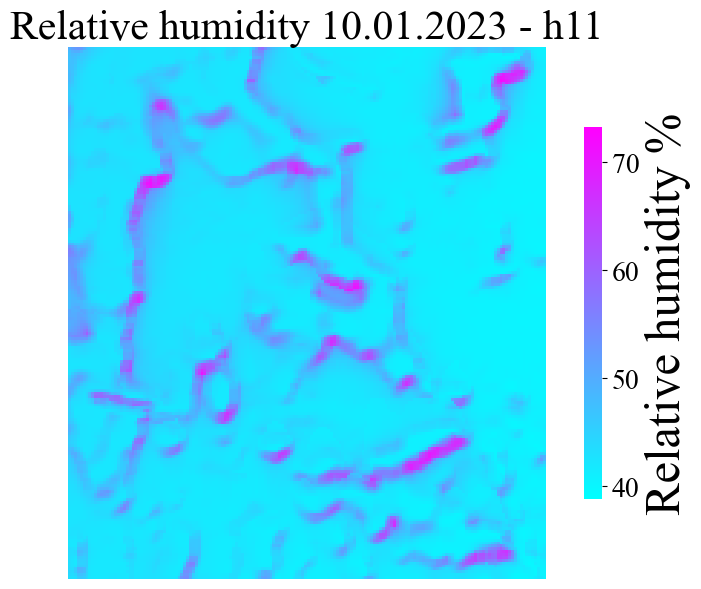

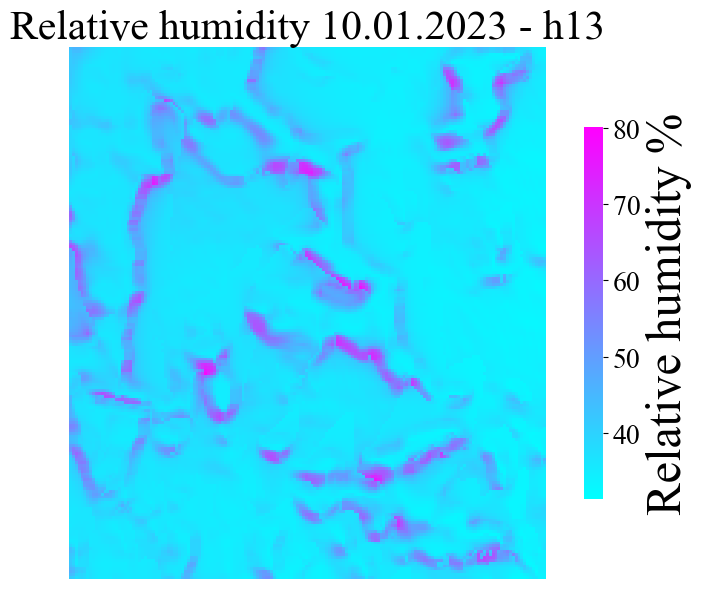

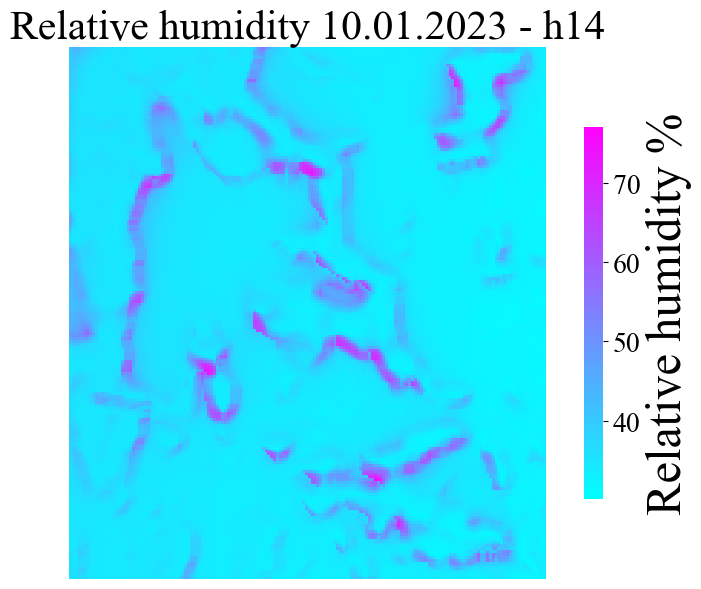

In [28]:
for period in periods:
    
    fig, ax = plot_microclimate_prediction_over_study_area(
                    model = model, target_variable = target_variable, train_data_rescale_params = train_data_rescale_params,
                    df_climate = df_climate, period = period,
                    lat = lat, long = long, dsm = dsm, resolution = resolution,
                    slope = slope, aspect = aspect, ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                    figsize=(8,6), aspect_heatmap = 1, shrink = 0.7,tick_params_labelsize = 20, ylabel_fontsize = 35,
                    title_fontsize = 30
                                                          )

## MachineLearningFFNN class

The MachineLearningFFNN class encapsulates all the aforementioned operations and plotting methods, allowing for a more concise and streamlined execution of the entire procedure. This class efficiently combines and integrates all the necessary steps to train the neural network, evaluate its performance, and generate the relevant plots, providing a more compact and organized approach to the overall process.

In [3]:
sys.path.append(LIB_PATH + 'machine_learning')
from machine_learning_ffnn import MachineLearningFFNN

sys.path.append(LIB_PATH + 'physical_model')
from terrain_utility import terrain, skyviewfactor
from utility import smooth

Metal device set to: Apple M1
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 9)]               0         
                                                                 
 dense (Dense)               (None, 1024)              10240     
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dense_2 (Dense)             (None, 256)               131328    
                                                                 
 dense_3 (Dense)             (None, 128)               32896     
                                                                 
 dense_4 (Dense)             (None, 1)                 129       
                                                                 
Total params: 699,393
Trainable

2023-06-20 11:26:33.967576: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-06-20 11:26:33.967671: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-06-20 11:26:34.115881: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


  1/585 [..............................] - ETA: 3:20 - loss: 84.0416 - mean_squared_error: 7327.8721 - mean_absolute_error: 84.7347

2023-06-20 11:26:34.277766: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


579/585 [============================>.] - ETA: 0s - loss: 55.6259 - mean_squared_error: 3443.8970 - mean_absolute_error: 56.3190

2023-06-20 11:26:38.836763: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


585/585 [==============================] - 5s 9ms/step - loss: 55.3944 - mean_squared_error: 3421.1514 - mean_absolute_error: 56.0875 - val_loss: 33.5009 - val_mean_squared_error: 1261.0133 - val_mean_absolute_error: 34.1927
Epoch 2/200
585/585 [==============================] - 5s 9ms/step - loss: 15.1166 - mean_squared_error: 365.3588 - mean_absolute_error: 15.7965 - val_loss: 6.7657 - val_mean_squared_error: 101.1505 - val_mean_absolute_error: 7.4309
Epoch 3/200
585/585 [==============================] - 5s 8ms/step - loss: 6.2838 - mean_squared_error: 103.8503 - mean_absolute_error: 6.9366 - val_loss: 6.4510 - val_mean_squared_error: 104.8518 - val_mean_absolute_error: 7.1053
Epoch 4/200
585/585 [==============================] - 5s 8ms/step - loss: 6.2721 - mean_squared_error: 105.0764 - mean_absolute_error: 6.9234 - val_loss: 6.4481 - val_mean_squared_error: 104.9559 - val_mean_absolute_error: 7.1021
Epoch 5/200
585/585 [==============================] - 5s 8ms/step - loss: 6.273

2023-06-20 11:42:43.755645: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 74.74055001971276   2.10954514573025
Benchmark vs prediction r2: 0.015896332381615284   0.9009355628054694


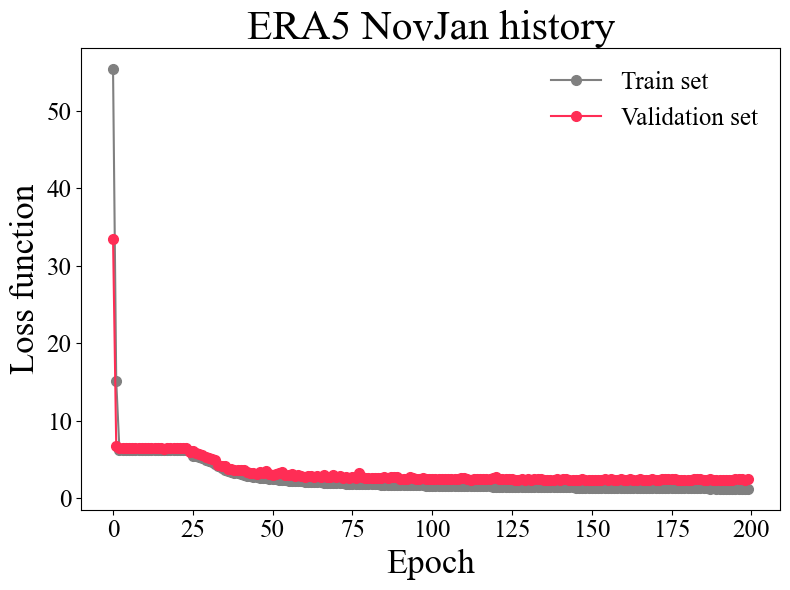

In [4]:
ML = MachineLearningFFNN(model_type_name = 'ERA5',
                         model_period_name = 'NovJan',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_01_15/df_microclimate_era5_NovJan_out_13-06-2023_16-59-32.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'H_target',
                         max_n_neurons = 512,
                         min_n_neurons = 128,
                         n_layers = 3,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.elaborate_input_data(seed = 18,
                        test_train_proportion = 0.4,
                        val_test_proportion = 0.4,
                       )

ML.create_model(display_summary = True)

ML.train(epochs = 200, patience = 200,
         metric_to_monitor = 'val_loss', restore_best_weights = True, 
         plot_history_bool = True, verbose = 1,
        )

ML.test()

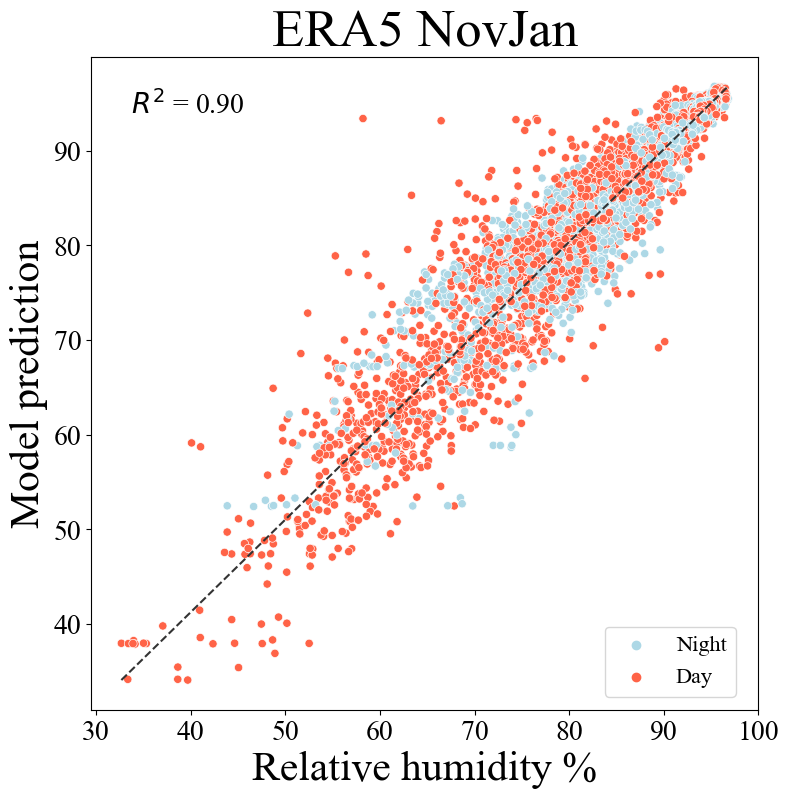

In [5]:
fig,ax = ML.make_plot_results_test_R2()

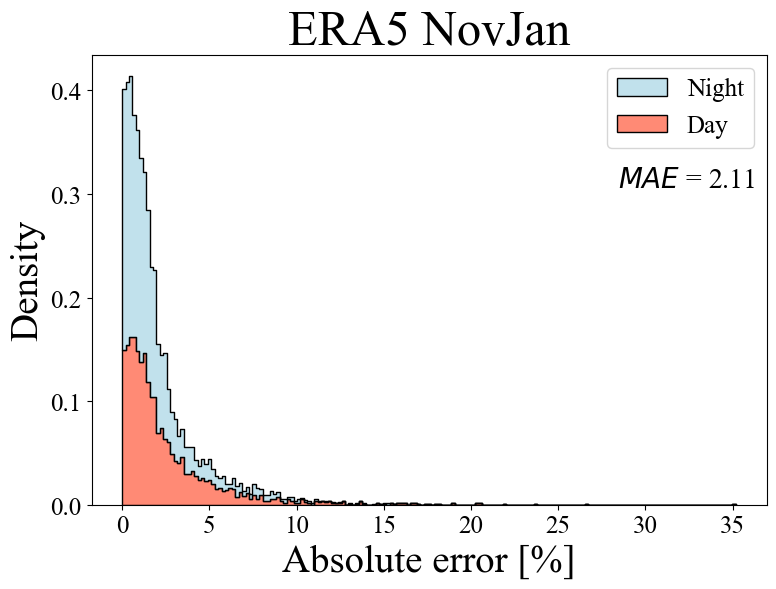

In [6]:
fig,ax = ML.make_plot_distribution_test_mae()

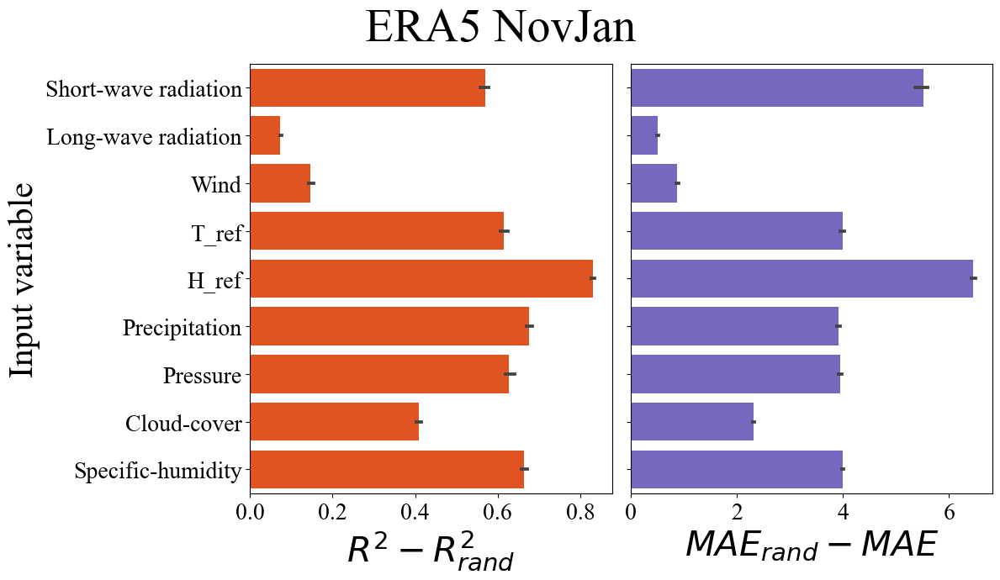

In [7]:
fig, ax = ML.make_plot_inputs_importance(n_simul = 3)

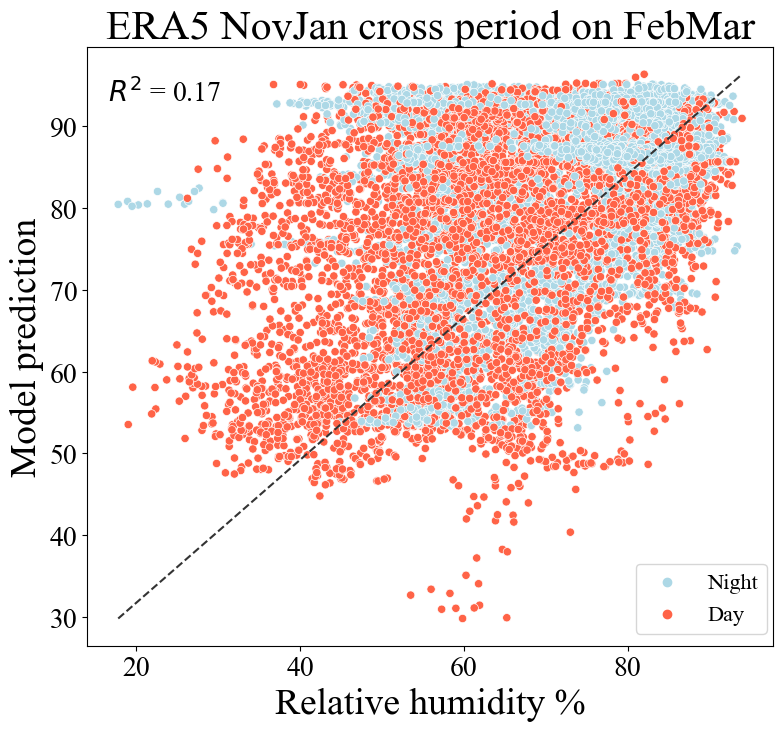

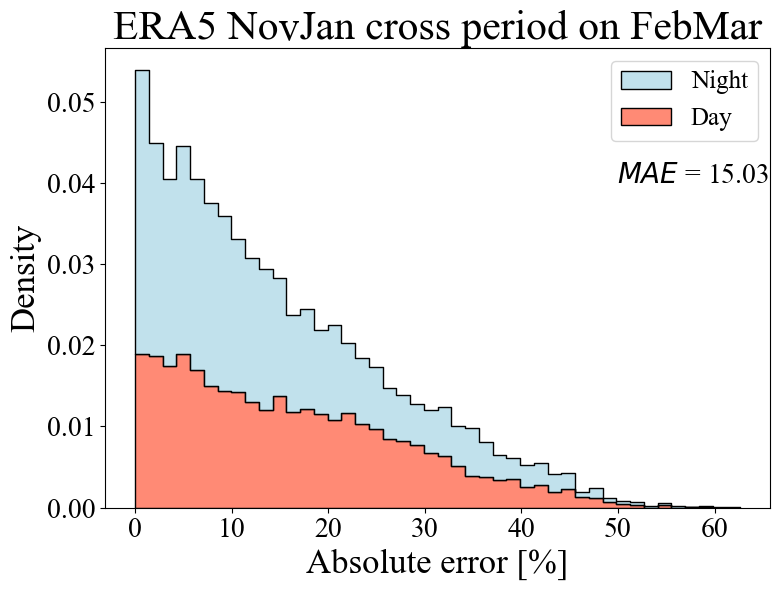

In [8]:
fig_r2, ax_r2, fig_mae, ax_mae = ML.make_plot_cross_period_prediction(df_filename_cross_period = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_02_01__2023_03_06/df_microclimate_era5_FebMar_out_13-06-2023_16-59-32.p',
                                                                      cross_period_name = 'FebMar')

In [ ]:
lat = 45.7247139
long = 9.6975472

filename = DATA_PATH + 'data_torreboldone/dsm_TorreBoldone.p'    
infile = open(filename, 'rb')
dsm = pickle.load(infile)
dsm = smooth(dsm,smooth_side = 2)
resolution = 2

slope = terrain(dsm, 'slope')
aspect = terrain(dsm, 'aspect')

ha, svf = skyviewfactor(dsm, steps = 36, reso = 2)
study_area_coordinates = [804,619,422,588]
         
df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2022_11_12__2023_01_15.p')

periods = [
    [2023,1,10,10],
    [2023,1,10,11],
    [2023,1,10,13],
    [2023,1,10,14]
]

In [ ]:
for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                         df_climate = df_climate, period = period, lat = lat, long = long,
                                                         dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                         ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                         figsize=(8,6), aspect_heatmap = 1, shrink = 0.7,
                                                         tick_params_labelsize = 20, ylabel_fontsize = 35,
                                                         title_fontsize = 30,)

    



# Load terrain data of the study area

In [3]:
sys.path.append(LIB_PATH + 'physical_model')
from terrain_utility import terrain, skyviewfactor
from utility import smooth

The terrain data for the study area is loaded, and the corresponding terrain properties are computed. For additional details, please refer to the 'notebook_physical_model' for more comprehensive information on this process.

In [4]:
lat = 45.7247139
long = 9.6975472

filename = DATA_PATH + 'data_torreboldone/dsm_TorreBoldone.p'    
infile = open(filename, 'rb')
dsm = pickle.load(infile)
dsm = smooth(dsm,smooth_side = 2)
resolution = 2

slope = terrain(dsm, 'slope')
aspect = terrain(dsm, 'aspect')

ha, svf = skyviewfactor(dsm, steps = 36, reso = 2)
study_area_coordinates = [804,619,422,588]
        

# NovJun

In this section a neural network for ERA5 database and ARPA database is trained to predict the relative humidity for the period from 12/11/2022 to 22/06/2023.

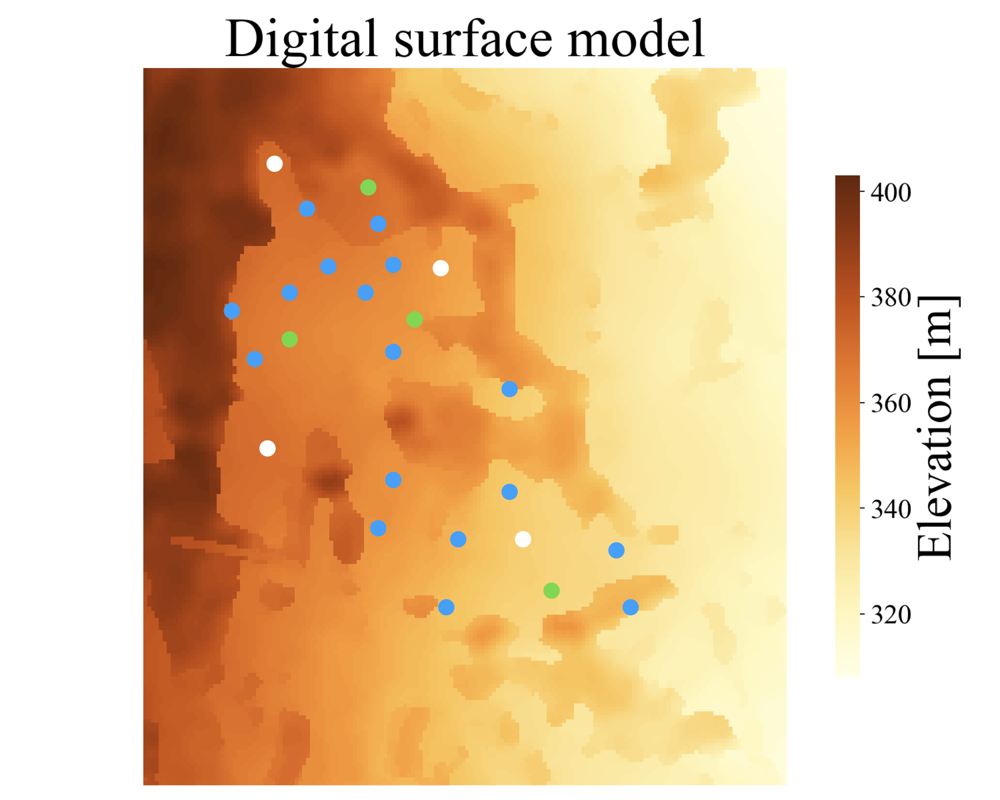

- In lightblue are represented the training sensors.
- In green are represented the validating sensors (3,12,13,22). 3 and 12 are not present in FebMar, 22 is not present in MarJun and 13 is always present.
- In white are represented the testing sensors (1, 15, 8, 23). These sensors are always present in the 3 periods.

## ERA5

Metal device set to: Apple M1
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 9)]               0         
                                                                 
 dense (Dense)               (None, 512)               5120      
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 dense_3 (Dense)             (None, 1)                 129       
                                                                 
Total params: 169,473
Trainable params: 169,473
Non-trainable params: 0
_________________________________________________________________


2023-07-01 09:04:06.705406: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-07-01 09:04:06.705529: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-07-01 09:04:06.855494: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-07-01 09:04:07.005624: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-07-01 09:04:16.894163: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


INFO:tensorflow:Assets written to: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_era5/model_weights_humidity_era5__2022_11_12__2023_06_22/FFNN_humidity_era5_NovJun_out_01-07-2023_09-03-56/model_weights/assets


2023-07-01 10:10:20.245424: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 63.7765742952038   5.669821810384278
Benchmark vs prediction r2: 0.001200530005227478   0.6514866118100294


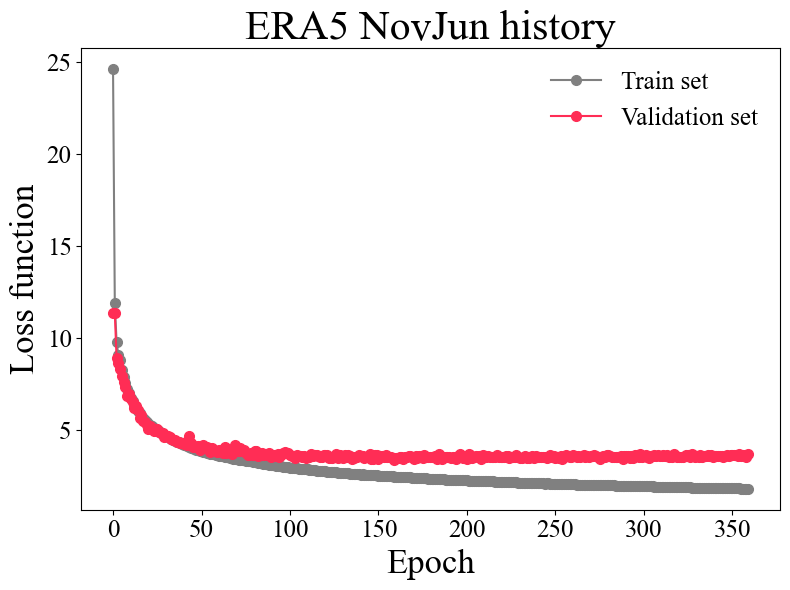

In [3]:
ML = MachineLearningFFNN(model_type_name = 'ERA5',
                         model_period_name = 'NovJun',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_06_22/df_microclimate_era5_NovJun_out_30-06-2023_12-42-55.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'H_target',
                         max_n_neurons = 512,
                         min_n_neurons = 128,
                         n_layers = 3,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.elaborate_input_data_fixed_sensors(idxs_train = [2,4,5,6,7,9,10,11,14,16,17,18,19,20,21,24,25],
                                      idxs_validation = [3,12,13,22],
                                      idxs_test = [1,8,15,23],
                                     )

ML.create_model(display_summary = True)

ML.train(epochs = 1000, patience = 200,
         metric_to_monitor = 'val_loss', restore_best_weights = True, 
         plot_history_bool = True, verbose = 0,
        )

ML.save_model_properties(datetime = DATETIME)

ML.test()

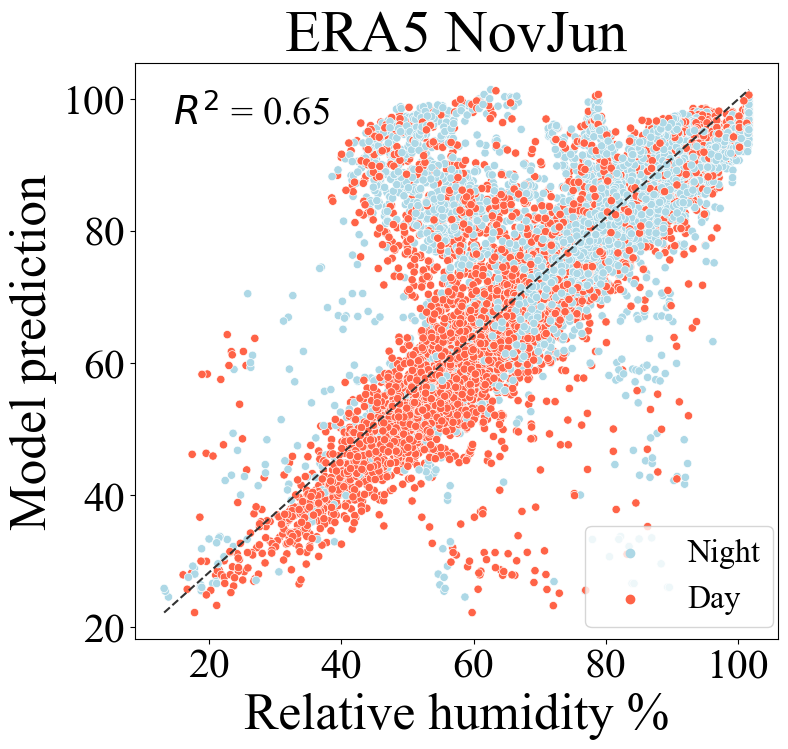

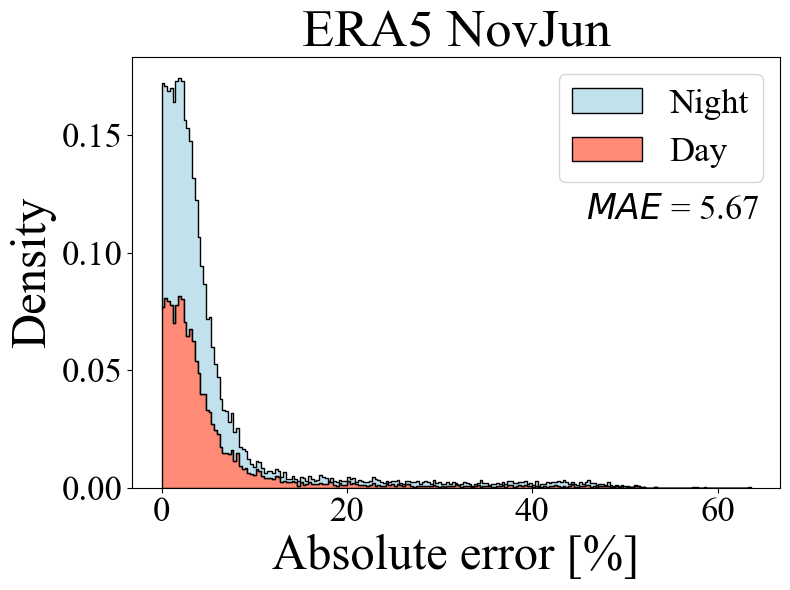

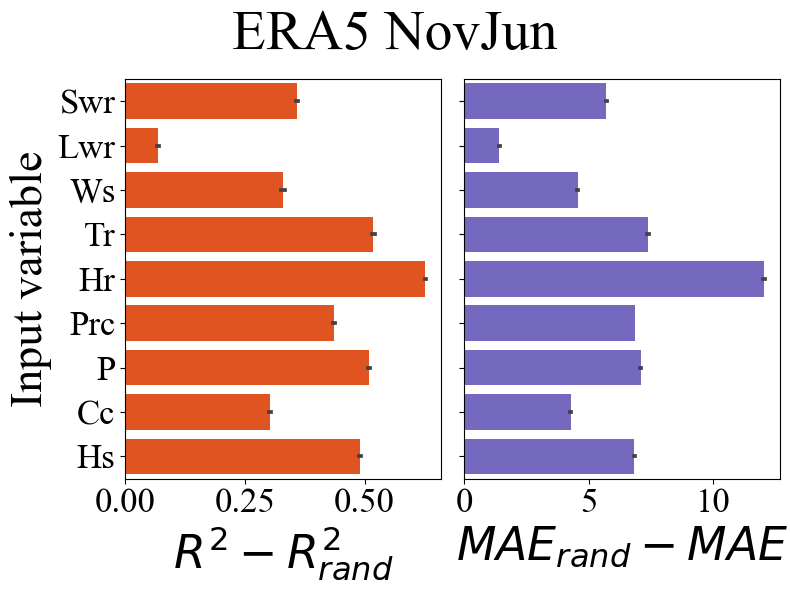

In [4]:
fig,ax = ML.make_plot_results_test_R2(xticks = [25,50,75,100],yticks = [25,50,75,100], save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJun_humidity_figure_results_test_R2.png', dpi=150)

fig,ax = ML.make_plot_distribution_test_mae(save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJun_humidity_figure_mae_distribution.png', dpi=150)

fig, ax = ML.make_plot_inputs_importance(n_simul = 10,save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJun_humidity_figure_input_importance.png', dpi=150)


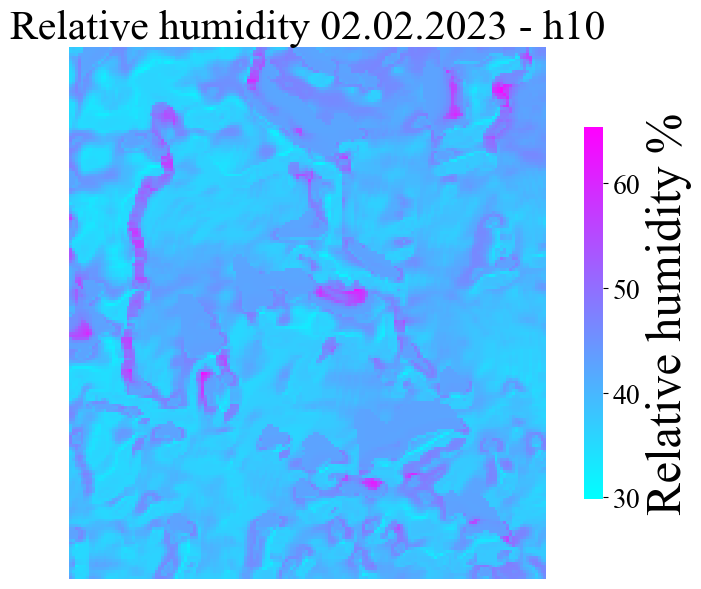

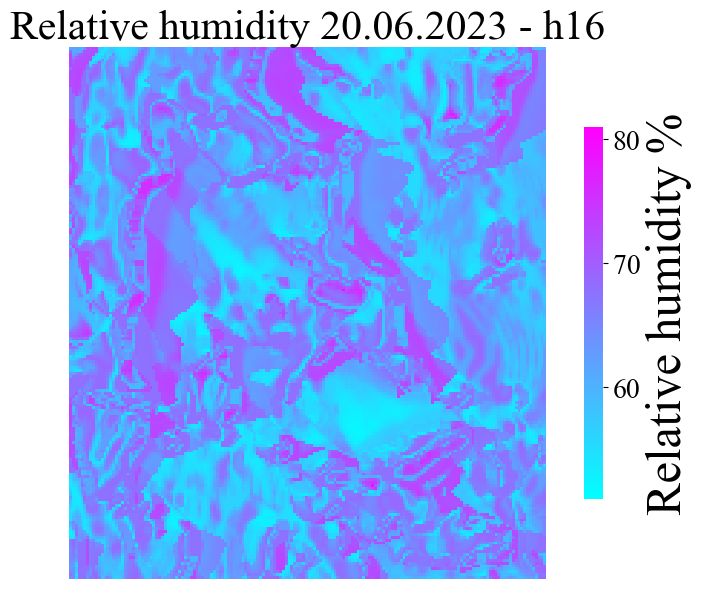

In [14]:
periods = [
 [2023,2,2,10],
 [2023,6,20,16]
]
for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                             df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2022_11_12__2023_06_22.p'),
                                                             period = period, lat = lat, long = long,
                                                             dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                             ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                             save_figure=True,)
    
    fig.savefig(RESULTS_PATH+'figures/microclima_prediction_figures/era5_humidity_spacemap_{}_{}_{:02d}_{:02d}.png'.format(period[0], period[1], period[2], period[3]), dpi=150)


### Figures reworking

In [3]:
ML = MachineLearningFFNN(model_type_name = 'ERA5',
                         model_period_name = 'NovJun',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_06_22/df_microclimate_era5_NovJun_out_30-06-2023_12-42-55.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'H_target',
                         max_n_neurons = 512,
                         min_n_neurons = 128,
                         n_layers = 3,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.load_model_properties(RESULTS_PATH+'/output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_era5/model_weights_humidity_era5__2022_11_12__2023_06_22/FFNN_humidity_era5_NovJun_out_01-07-2023_09-03-56')


Metal device set to: Apple M1


2023-07-07 10:12:11.289545: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-07-07 10:12:11.289638: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-07-07 10:12:11.402352: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open /Users/marcozanchi/Work/Grade/microclima/notebooks/results//output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_era5/model_weights_humidity_era5__2022_11_12__2023_06_22/FFNN_humidity_era5_NovJun_out_01-07-2023_09-03-56/model_weights: FAILED_PRECONDITION: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_wei

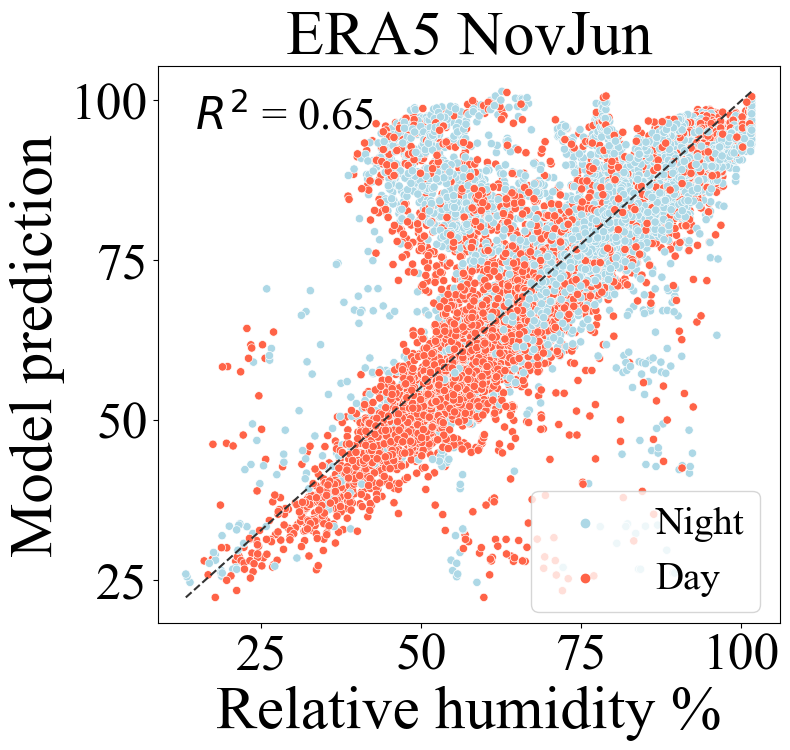

In [5]:
fig,ax = ML.make_plot_results_test_R2(
    xfontsize = 44, yfontsize = 44,
    title_fontsize = 45,
    ticks_fontsize = 37,
    r2_fontsize = 32, legend_fontsize = 28,
    legend_loc = (0.60,0.02), 
    xticks = [25,50,75,100],
    yticks = [25,50,75,100],
    save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJun_humidity_figure_results_test_R2.png', dpi=150)


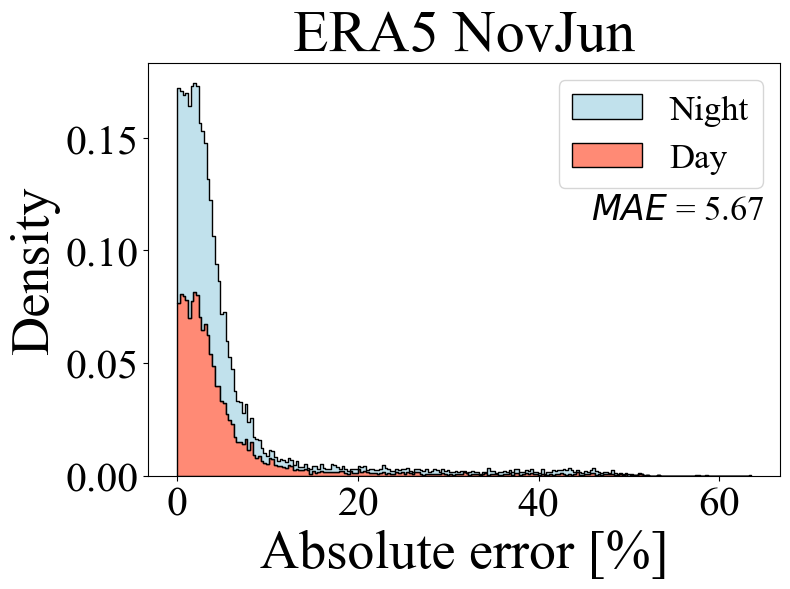

In [6]:
fig,ax = ML.make_plot_distribution_test_mae(
    xfontsize = 39, yfontsize = 39, 
    title_fontsize = 42,
    ticks_fontsize = 30,
    save_fig = True)

fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJun_humidity_figure_mae_distribution.png', dpi=150)



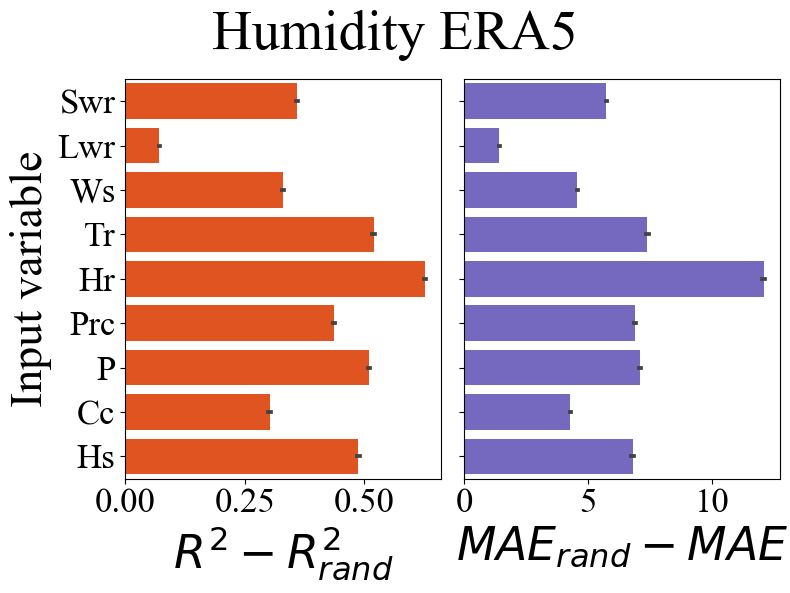

In [4]:
fig, ax = ML.make_plot_inputs_importance(n_simul = 10, title = 'Humidity ERA5',save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJun_humidity_figure_input_importance.png', dpi=150)


## Mixed ARPA ERA5

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 9)]               0         
                                                                 
 dense_4 (Dense)             (None, 1024)              10240     
                                                                 
 dense_5 (Dense)             (None, 512)               524800    
                                                                 
 dense_6 (Dense)             (None, 256)               131328    
                                                                 
 dense_7 (Dense)             (None, 128)               32896     
                                                                 
 dense_8 (Dense)             (None, 1)                 129       
                                                                 
Total params: 699,393
Trainable params: 699,393
Non-trainab

2023-07-01 10:11:59.723544: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-07-01 10:12:11.945345: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


INFO:tensorflow:Assets written to: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_mixed_arpa_era5/model_weights_humidity_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_humidity_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-56/model_weights/assets


2023-07-01 12:29:27.028025: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 64.92289430938864   5.339531236142983
Benchmark vs prediction r2: 0.056409069916761444   0.70222004009586


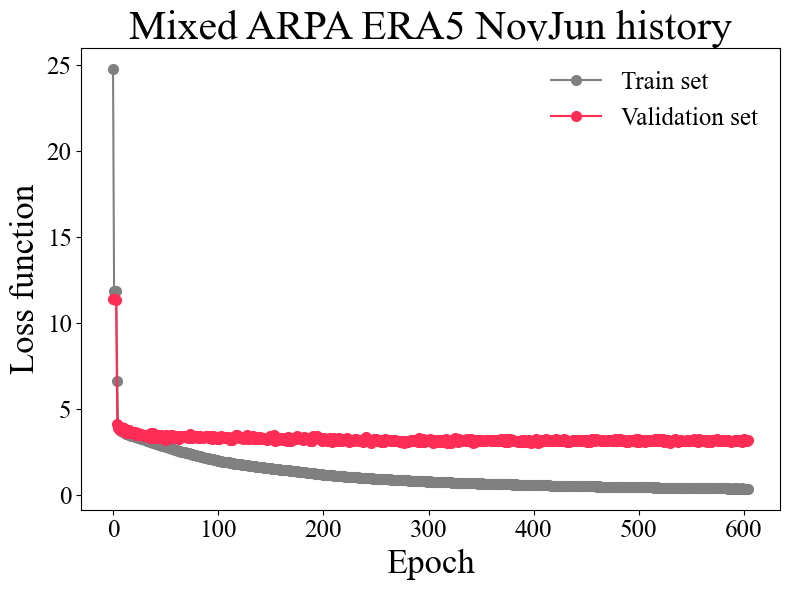

In [5]:
ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                         model_period_name = 'NovJun',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_06_22/df_microclimate_mixed_arpa_era5_NovJun_out_30-06-2023_12-42-55',              
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'H_target',
                         max_n_neurons = 1024,
                         min_n_neurons = 128,
                         n_layers = 4,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.elaborate_input_data_fixed_sensors(idxs_train = [2,4,5,6,7,9,10,11,14,16,17,18,19,20,21,24,25],
                                      idxs_validation = [3,12,13,22],
                                      idxs_test = [1,8,15,23],
                                     )

ML.create_model(display_summary = True)

ML.train(epochs = 1000, patience = 200,
         metric_to_monitor = 'val_loss', restore_best_weights = True, 
         plot_history_bool = True, verbose = 0,
        )

ML.save_model_properties(datetime = DATETIME)

ML.test()

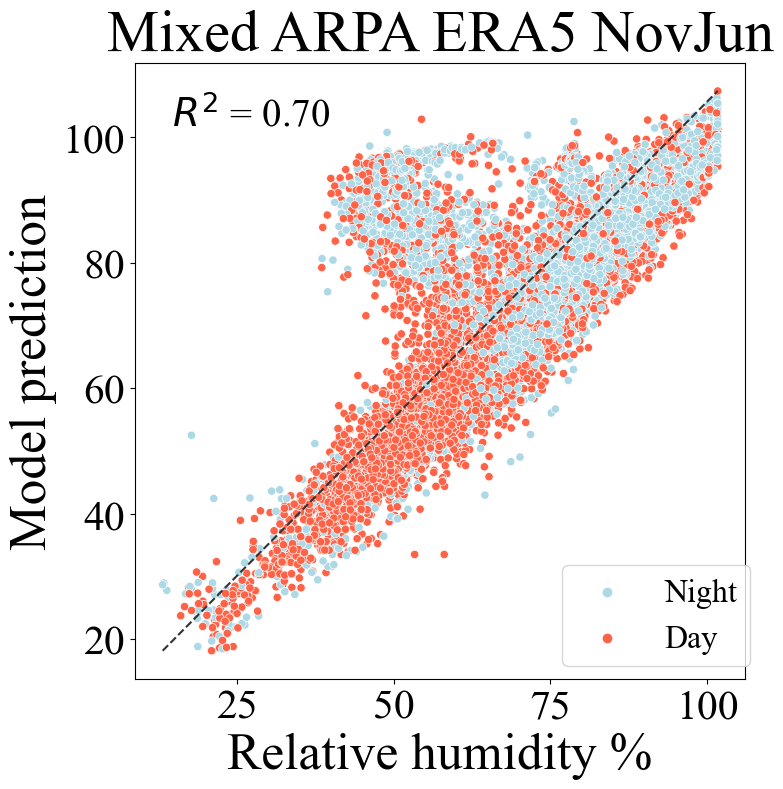

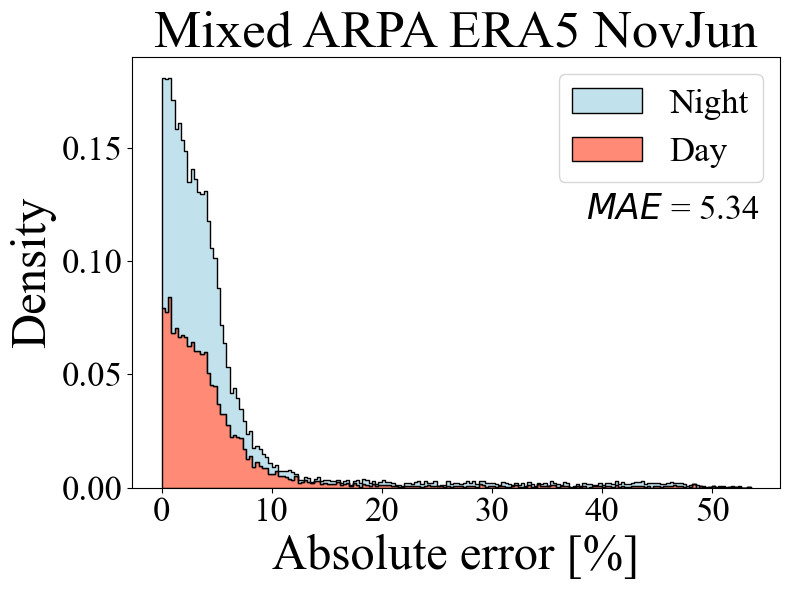

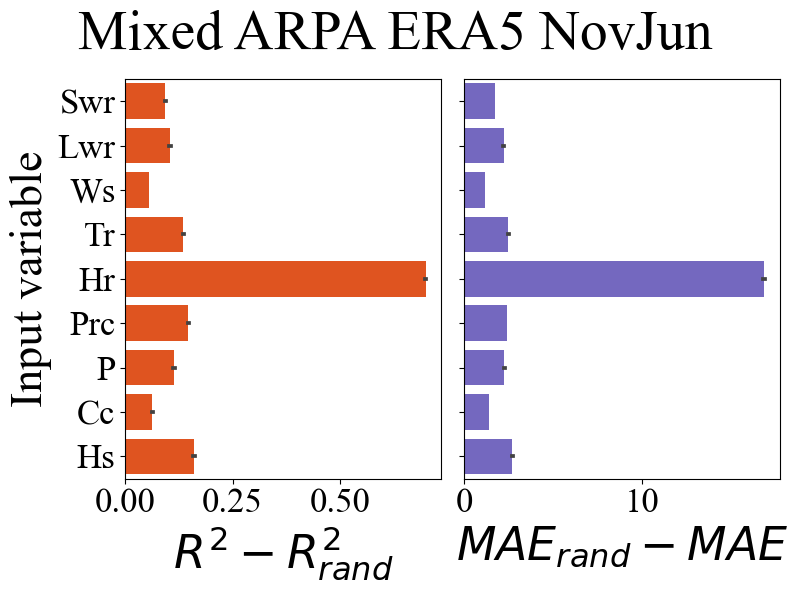

In [6]:
fig,ax = ML.make_plot_results_test_R2(xticks = [25,50,75,100],yticks = [25,50,75,100], save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJun_humidity_figure_results_test_R2.png', dpi=150)

fig,ax = ML.make_plot_distribution_test_mae(save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJun_humidity_figure_mae_distribution.png', dpi=150)

fig, ax = ML.make_plot_inputs_importance(n_simul = 10,save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJun_humidity_figure_input_importance.png', dpi=150)


In [17]:
ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                         model_period_name = 'NovJun',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_06_22/df_microclimate_mixed_arpa_era5_NovJun_out_30-06-2023_12-42-55',              
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'H_target',
                         max_n_neurons = 1024,
                         min_n_neurons = 128,
                         n_layers = 4,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.load_model_properties(RESULTS_PATH+'/output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_mixed_arpa_era5/model_weights_humidity_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_humidity_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-56')


2023-07-03 18:05:50.515541: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open /Users/marcozanchi/Work/Grade/microclima/notebooks/results//output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_mixed_arpa_era5/model_weights_humidity_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_humidity_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-56/model_weights: FAILED_PRECONDITION: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_mixed_arpa_era5/model_weights_humidity_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_humidity_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-56/model_weights; Is a directory: perhaps your file is in a different file format and you need to use a different restore operator?
2023-07-03 18:05:50.564504: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


2023-07-03 18:06:00.353645: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


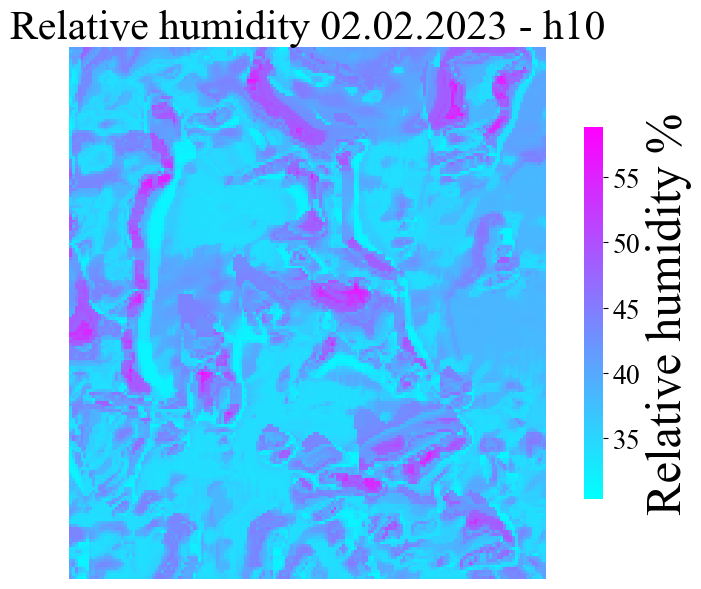

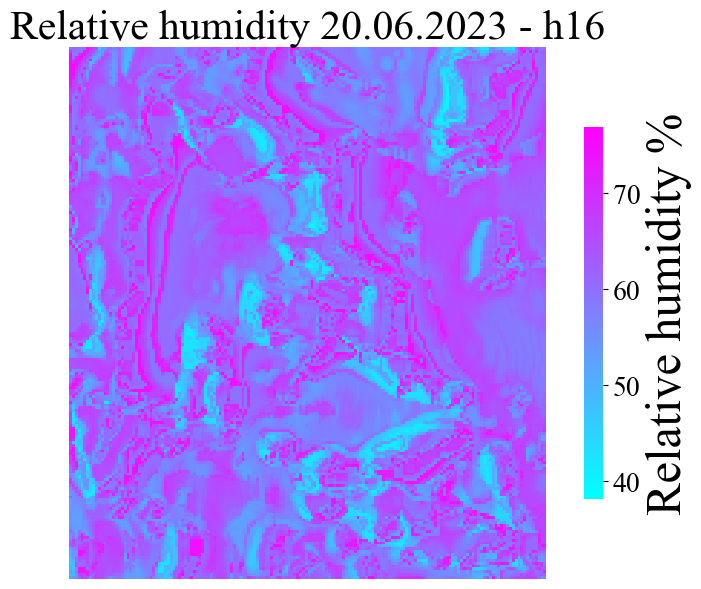

In [18]:
periods = [
 [2023,2,2,10],
 [2023,6,20,16]
]
for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                             df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2022_11_12__2023_06_22.p'),
                                                             period = period, lat = lat, long = long,
                                                             dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                             ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                             save_figure=True,)
    
    fig.savefig(RESULTS_PATH+'figures/microclima_prediction_figures/mixed_arpa_era5_humidity_spacemap_{}_{}_{:02d}_{:02d}.png'.format(period[0], period[1], period[2], period[3]), dpi=150)


### Figures reworking

In [8]:
ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                         model_period_name = 'NovJun',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_06_22/df_microclimate_mixed_arpa_era5_NovJun_out_30-06-2023_12-42-55',              
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'H_target',
                         max_n_neurons = 1024,
                         min_n_neurons = 128,
                         n_layers = 4,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.load_model_properties(RESULTS_PATH+'/output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_mixed_arpa_era5/model_weights_humidity_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_humidity_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-56')


2023-07-07 10:16:13.156709: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open /Users/marcozanchi/Work/Grade/microclima/notebooks/results//output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_mixed_arpa_era5/model_weights_humidity_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_humidity_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-56/model_weights: FAILED_PRECONDITION: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_mixed_arpa_era5/model_weights_humidity_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_humidity_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-56/model_weights; Is a directory: perhaps your file is in a different file format and you need to use a different restore operator?
2023-07-07 10:16:13.207038: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


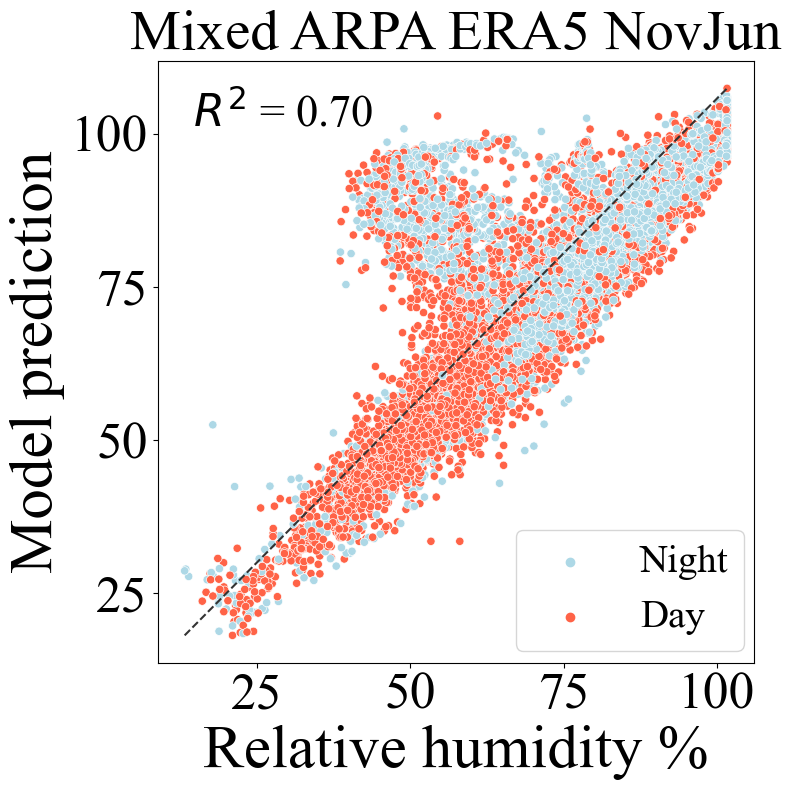

In [14]:
fig,ax = ML.make_plot_results_test_R2(
    xfontsize = 44, yfontsize = 44,
    title_fontsize = 41,
    ticks_fontsize = 37,
    r2_fontsize = 32, legend_fontsize = 28,
    legend_loc = (0.60,0.02),
    xticks = [25,50,75,100],
    yticks = [25,50,75,100],
    save_fig = True)

fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJun_humidity_figure_results_test_R2.png', dpi=150)



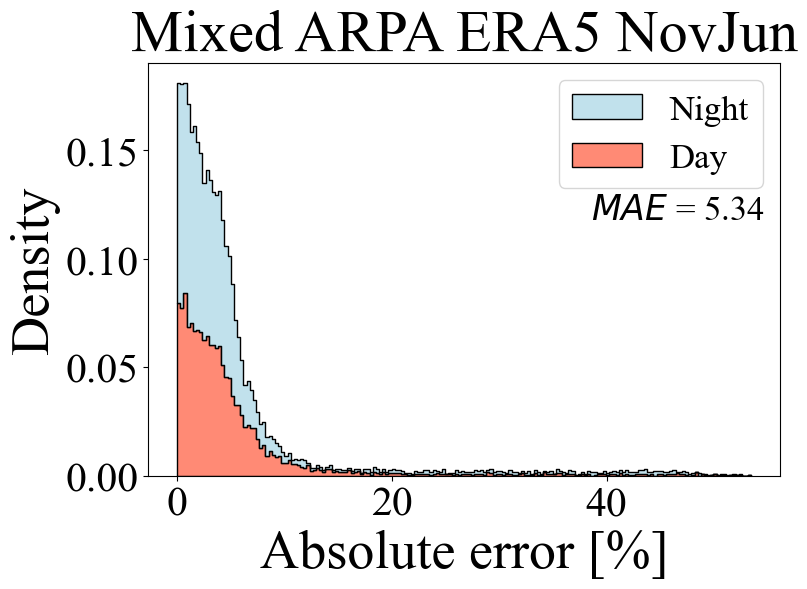

In [12]:
fig,ax = ML.make_plot_distribution_test_mae(
    xfontsize = 39, yfontsize = 39, 
    title_fontsize = 42,
    ticks_fontsize = 30,
    save_fig = True)


fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJun_humidity_figure_mae_distribution.png', dpi=150)


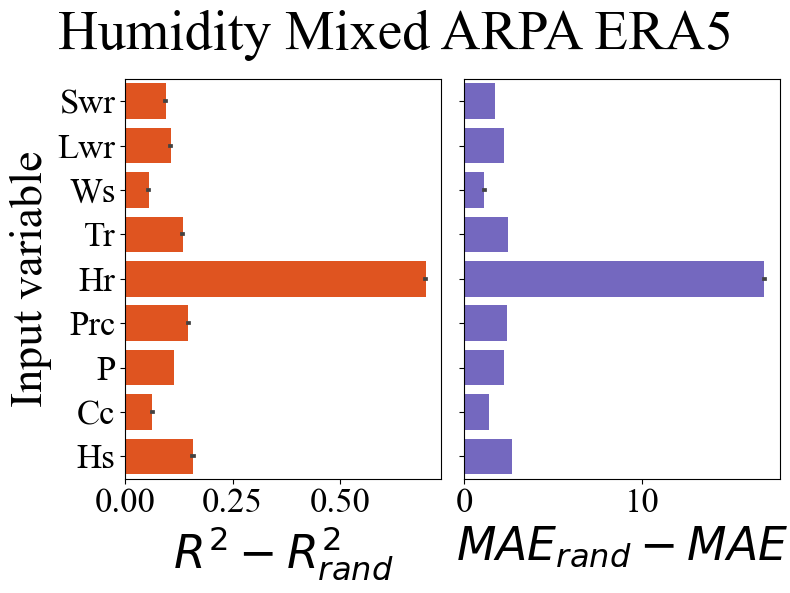

In [7]:
fig, ax = ML.make_plot_inputs_importance(n_simul = 10, title = 'Humidity Mixed ARPA ERA5',save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJun_humidity_figure_input_importance.png', dpi=150)


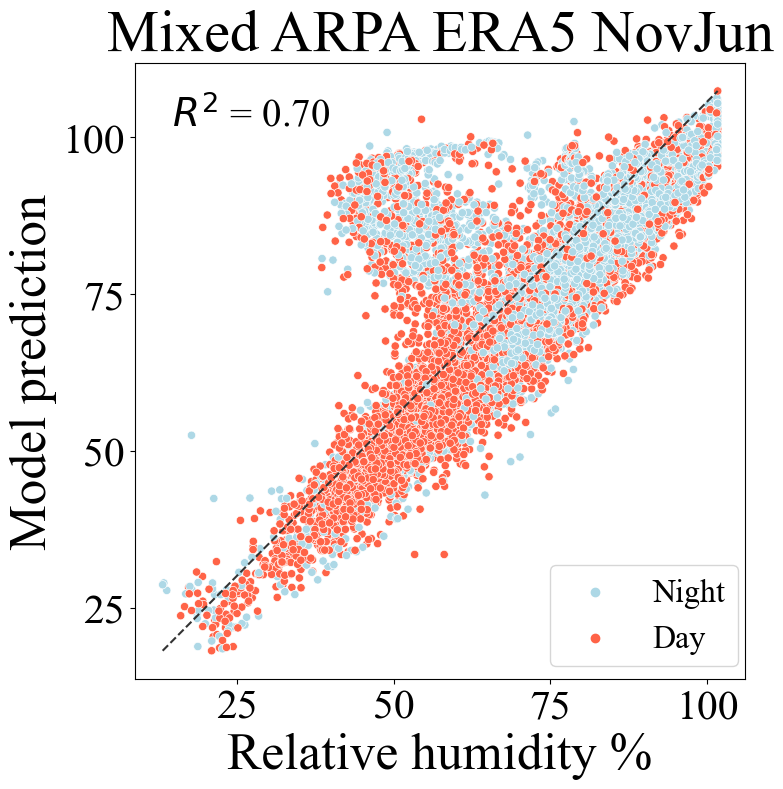

In [5]:
fig,ax = ML.make_plot_results_test_R2(legend_loc = (0.68,0.02), xticks = [25,50,75,100],yticks = [25,50,75,100],
                                      save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJun_humidity_figure_results_test_R2.png', dpi=150)


# NovJan

In this section a neural network for ERA5 database and ARPA database is trained to predict the temperature for the period from 12/11/2022 to 15/01/2023.

In [5]:

periods = [
    [2023,1,10,9],
    [2023,1,10,10],
    [2023,1,10,11],
    [2023,1,10,12],
    [2023,1,10,13],
    [2023,1,10,14],
    [2023,1,10,15],
    [2023,1,10,16],
]

## ERA5

Metal device set to: Apple M1
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 9)]               0         
                                                                 
 dense (Dense)               (None, 512)               5120      
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 dense_3 (Dense)             (None, 1)                 129       
                                                                 
Total params: 169,473
Trainable params: 169,473
Non-trainable params: 0
_________________________________________________________________


2023-06-21 21:51:41.263679: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-06-21 21:51:41.263775: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-06-21 21:51:41.396380: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-06-21 21:51:41.530593: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 21:51:44.282998: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


INFO:tensorflow:Assets written to: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_era5/model_weights_humidity_era5__2022_11_12__2023_01_15/FFNN_humidity_era5_NovJan_out_21-06-2023_21-49-38/model_weights/assets


2023-06-21 22:10:41.680228: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 74.74055001971276   2.2123073718026456
Benchmark vs prediction r2: 0.015896332381615284   0.907900435037272


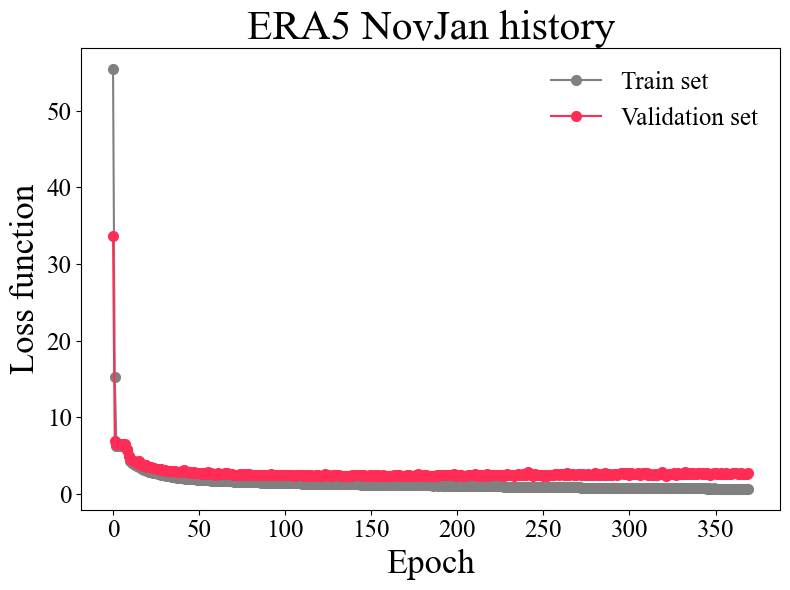

In [6]:
ML = MachineLearningFFNN(model_type_name = 'ERA5',
                         model_period_name = 'NovJan',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_01_15/df_microclimate_era5_NovJan_out_13-06-2023_16-59-32.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'H_target',
                         max_n_neurons = 512,
                         min_n_neurons = 128,
                         n_layers = 3,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.elaborate_input_data(seed = 18,
                        test_train_proportion = 0.4,
                        val_test_proportion = 0.4,
                       )

ML.create_model(display_summary = True)

ML.train(epochs = 1000, patience = 200,
         metric_to_monitor = 'val_loss', restore_best_weights = True, 
         plot_history_bool = True, verbose = 0,
        )

ML.save_model_properties(datetime = DATETIME)

ML.test()

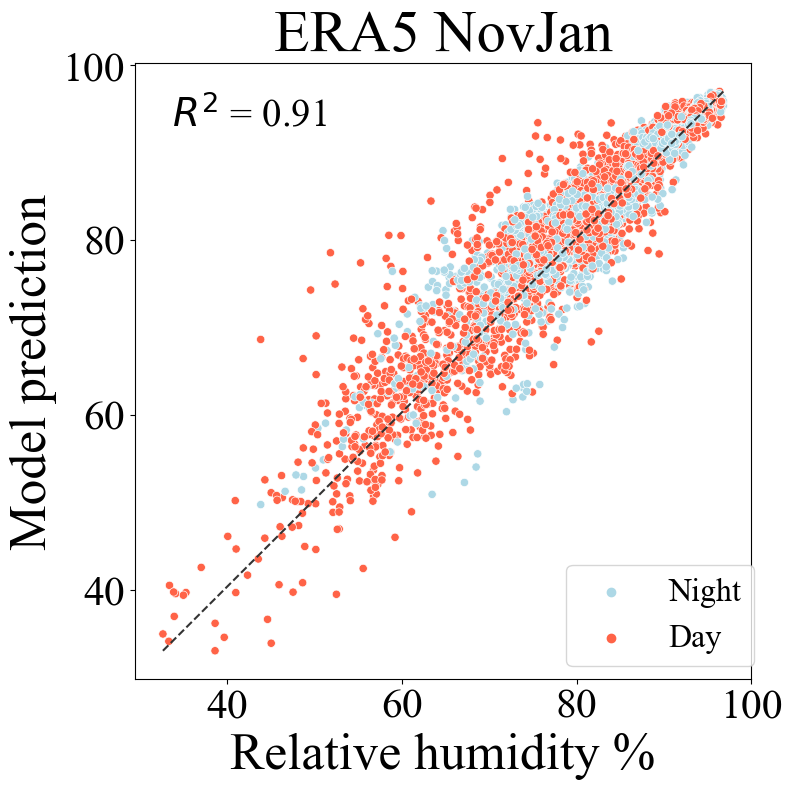

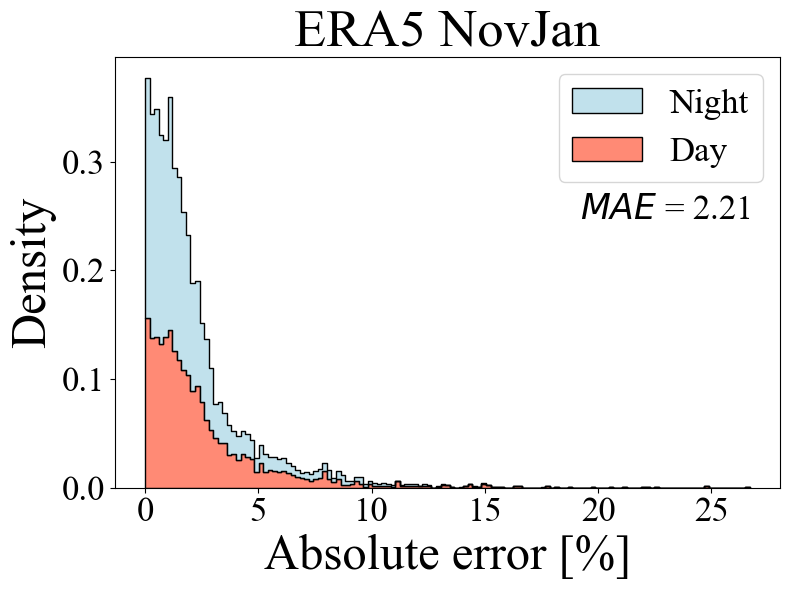

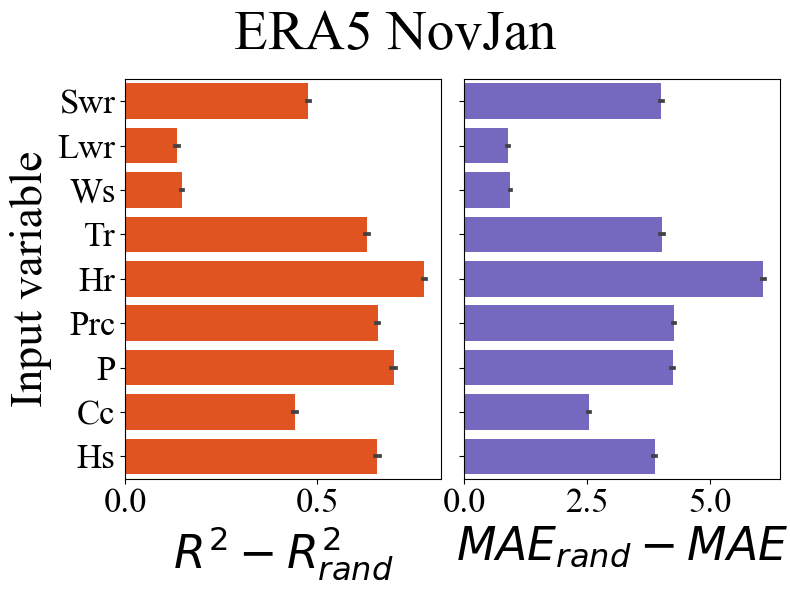

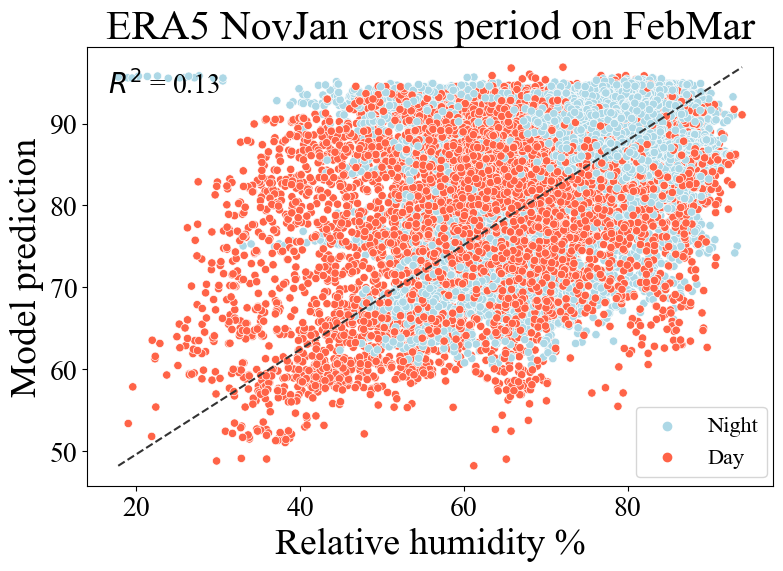

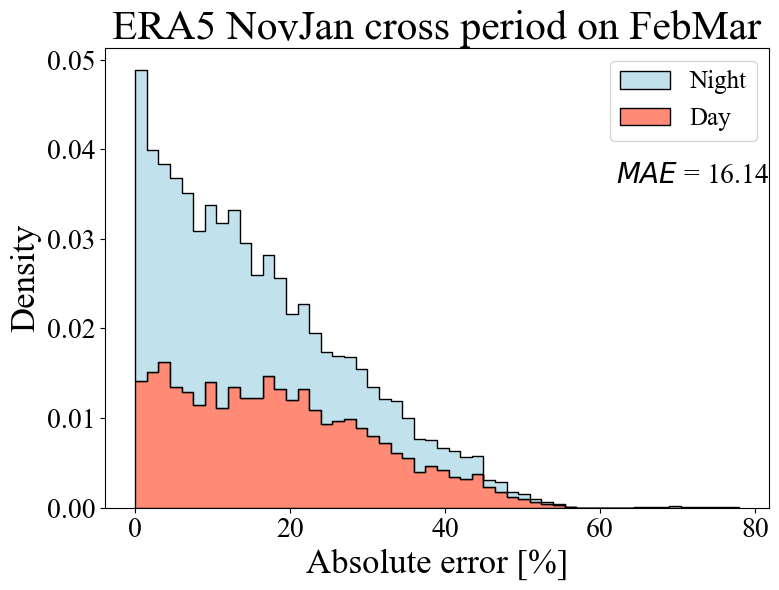

...

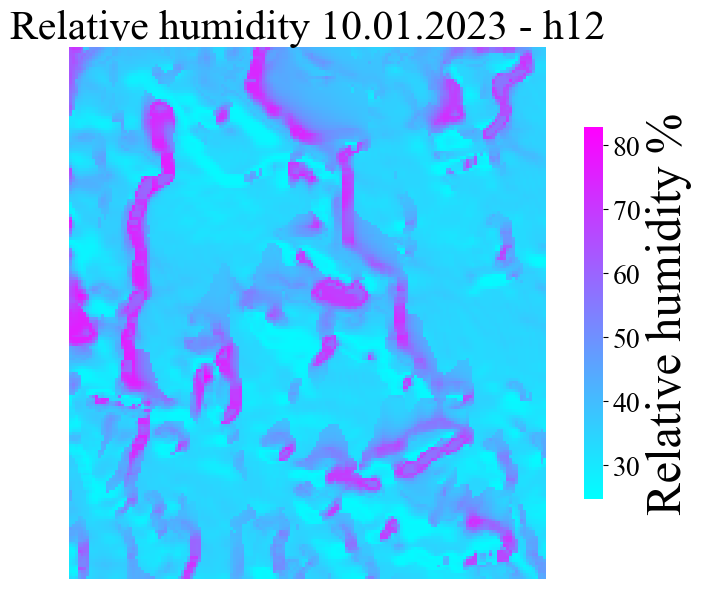

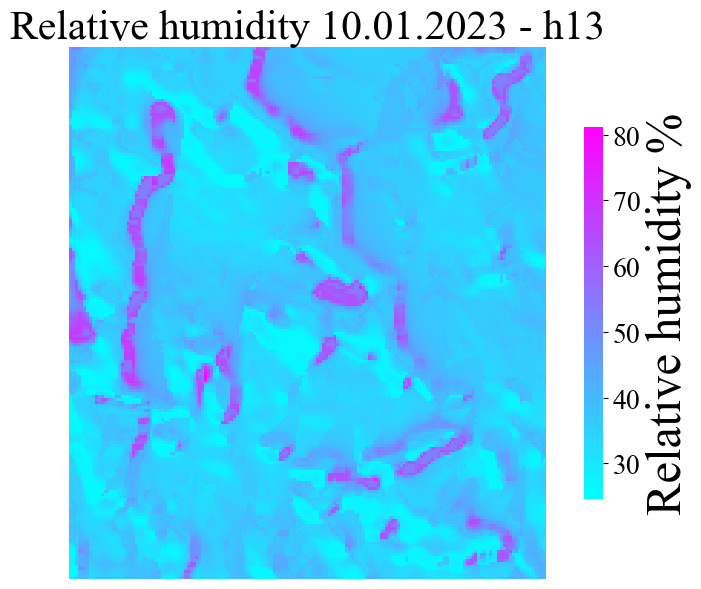

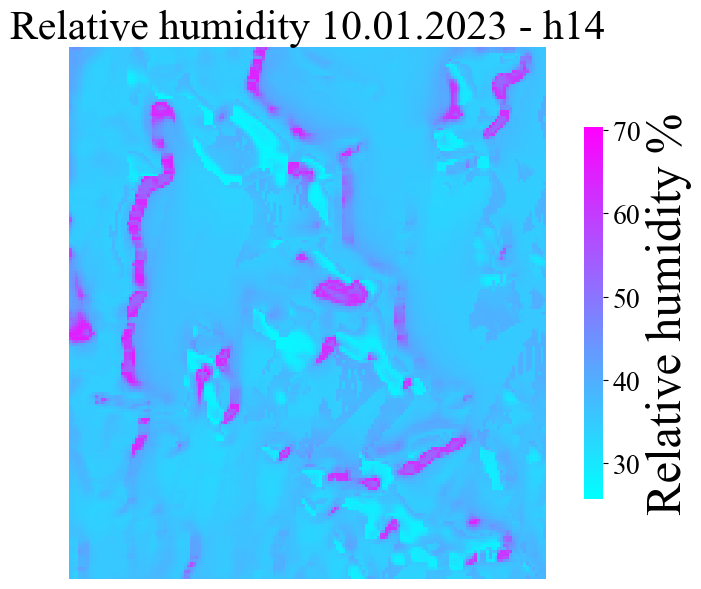

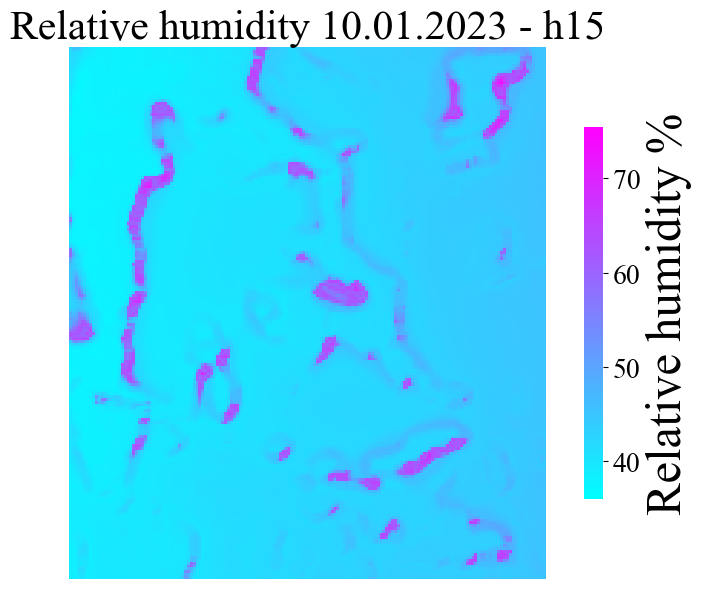

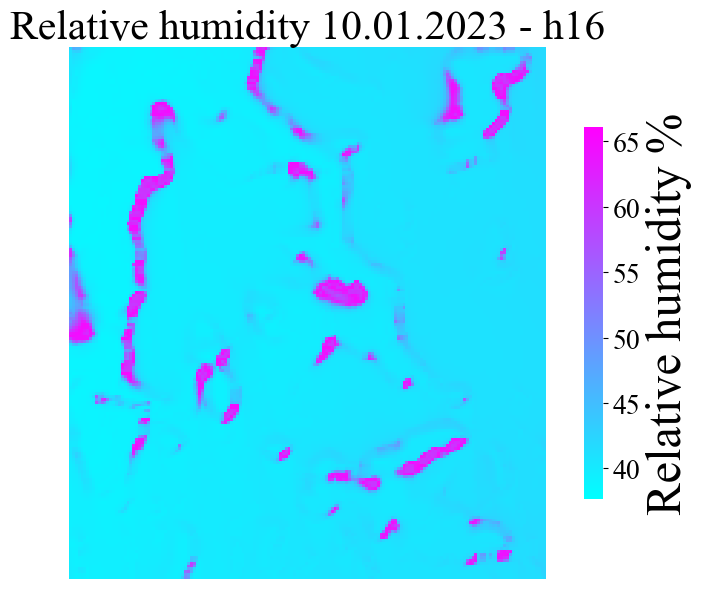

In [7]:
fig,ax = ML.make_plot_results_test_R2( save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJan_humidity_figure_results_test_R2.png', dpi=150)

fig,ax = ML.make_plot_distribution_test_mae(save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJan_humidity_figure_mae_distribution.png', dpi=150)

fig, ax = ML.make_plot_inputs_importance(n_simul = 10,save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJan_humidity_figure_input_importance.png', dpi=150)

fig_r2, ax_r2, fig_mae, ax_mae = ML.make_plot_cross_period_prediction(df_filename_cross_period = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_02_01__2023_03_06/df_microclimate_era5_FebMar_out_13-06-2023_16-59-32.p',
                                                                      cross_period_name = 'FebMar',save_fig = True)

fig_r2.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJan_humidity_figure_cross_period_results_test_R2.png', dpi=150)
fig_mae.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJan_humidity_figure_cross_period_distribution_mae.png', dpi=150)


for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                         df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2022_11_12__2023_01_15.p'),
                                                         period = period, lat = lat, long = long,
                                                         dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                         ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                         save_figure=True,)

    fig.savefig(RESULTS_PATH+'figures/microclima_prediction_figures/era5_humidity_spacemap_{}_{}_{:02d}_{:02d}.png'.format(period[0], period[1], period[2], period[3]), dpi=150)





## ARPA + ERA5

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 9)]               0         
                                                                 
 dense_4 (Dense)             (None, 512)               5120      
                                                                 
 dense_5 (Dense)             (None, 256)               131328    
                                                                 
 dense_6 (Dense)             (None, 128)               32896     
                                                                 
 dense_7 (Dense)             (None, 1)                 129       
                                                                 
Total params: 169,473
Trainable params: 169,473
Non-trainable params: 0
_________________________________________________________________


2023-06-21 22:12:37.548043: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 22:12:40.281989: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


INFO:tensorflow:Assets written to: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_mixed_arpa_era5/model_weights_humidity_mixed_arpa_era5__2022_11_12__2023_01_15/FFNN_humidity_mixed_arpa_era5_NovJan_out_21-06-2023_21-49-38/model_weights/assets


2023-06-21 22:32:12.694348: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 78.70176341930167   2.3114301881474177
Benchmark vs prediction r2: 0.02451743009986017   0.9207617837541189


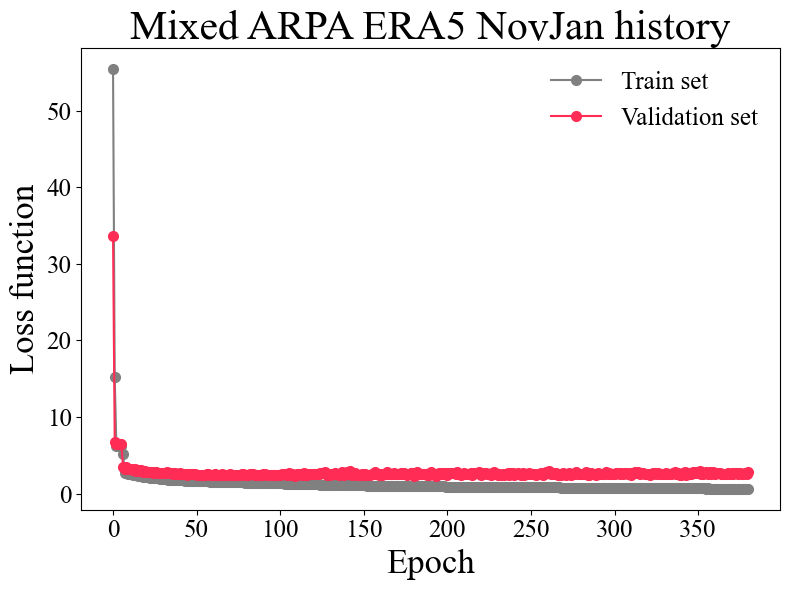

In [8]:
ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                         model_period_name = 'NovJan',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_01_15/df_microclimate_mixed_arpa_era5_NovJan_out_13-06-2023_16-59-32.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'H_target',
                         max_n_neurons = 512,
                         min_n_neurons = 128,
                         n_layers = 3,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.elaborate_input_data(seed = 18,
                        test_train_proportion = 0.4,
                        val_test_proportion = 0.4,
                       )

ML.create_model(display_summary = True)

ML.train(epochs = 1000, patience = 200,
         metric_to_monitor = 'val_loss', restore_best_weights = True, 
         plot_history_bool = True, verbose = 0,
        )

ML.save_model_properties(datetime = DATETIME)

ML.test()

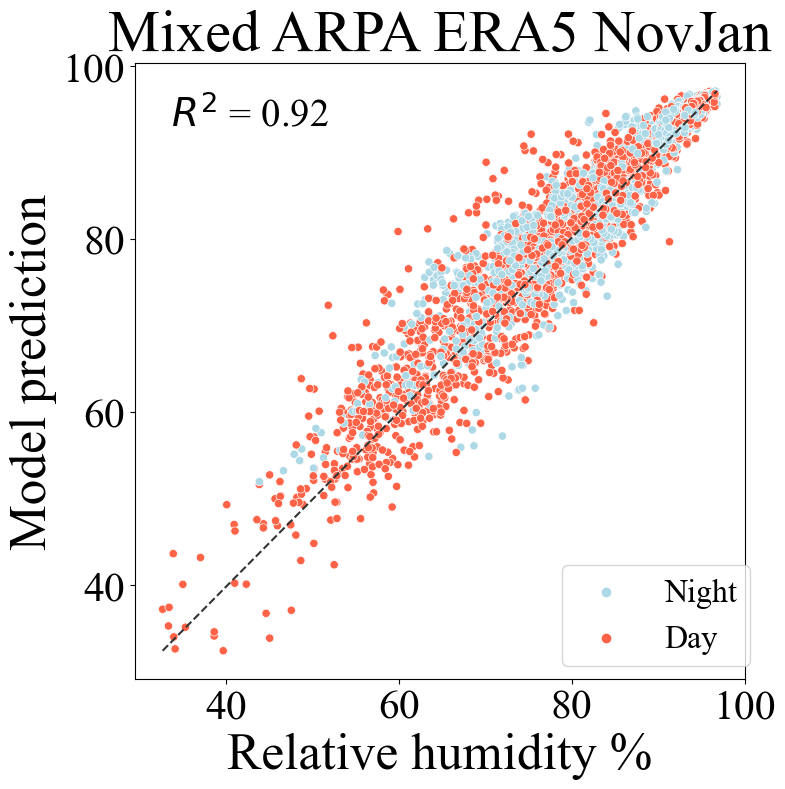

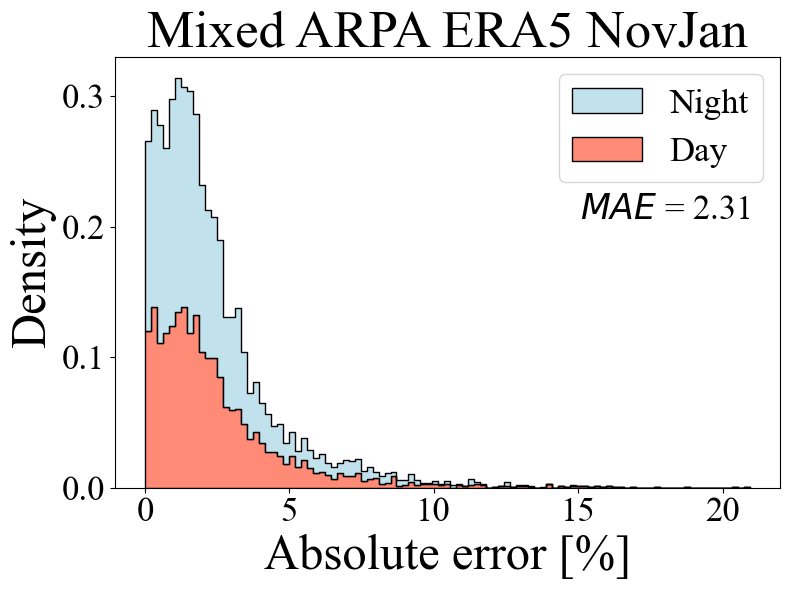

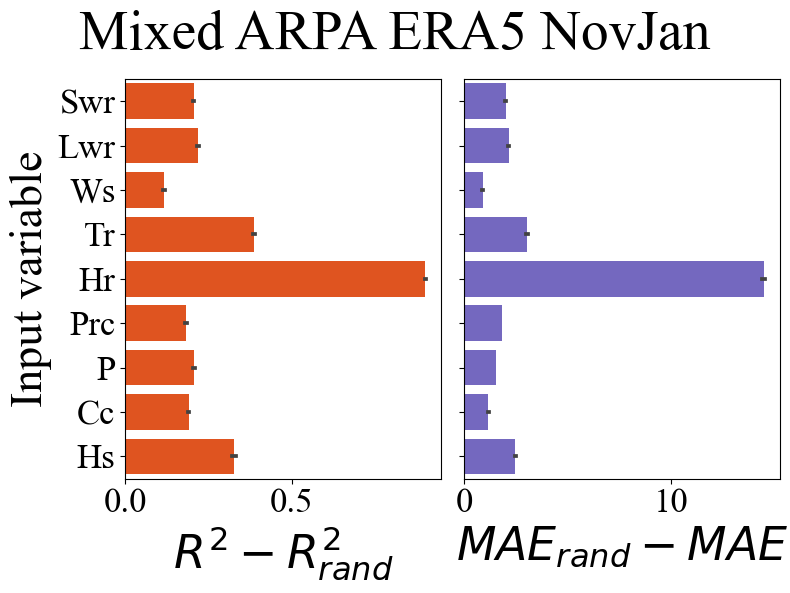

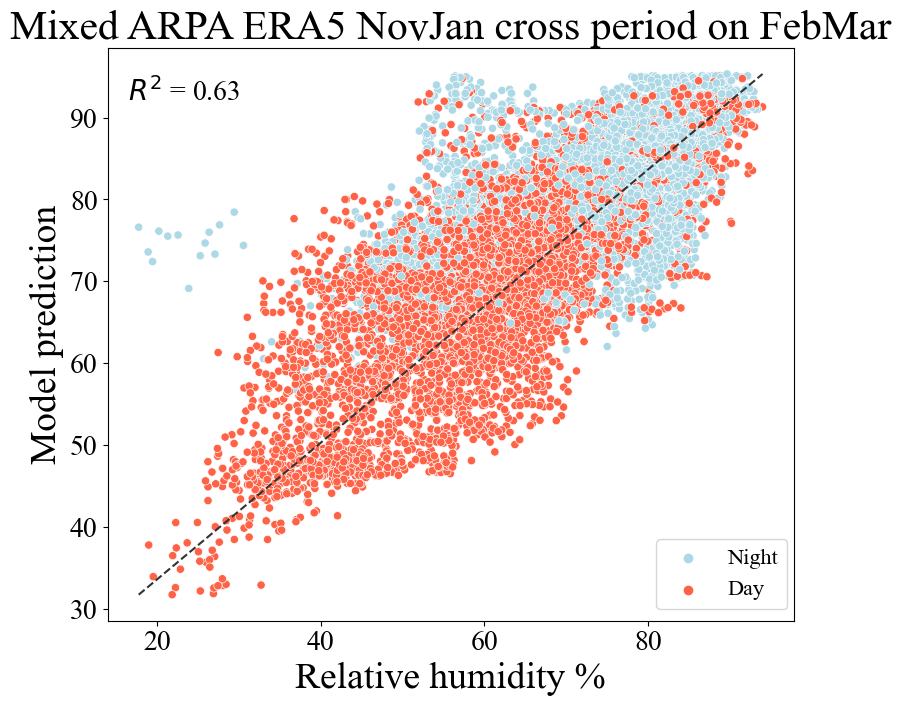

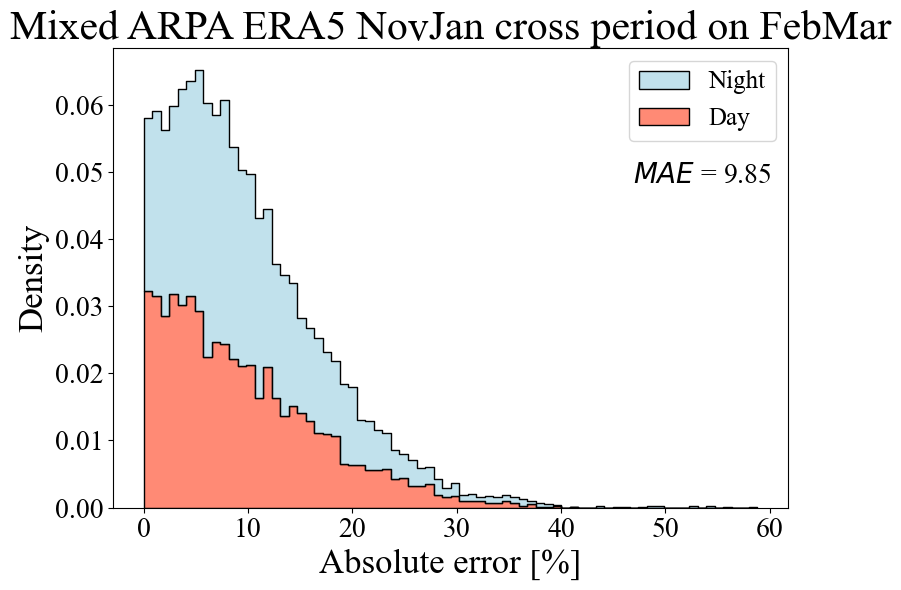

...

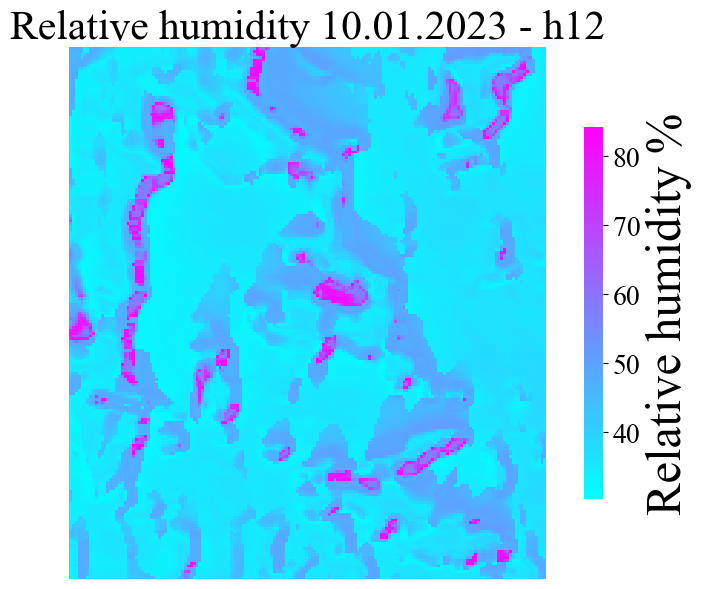

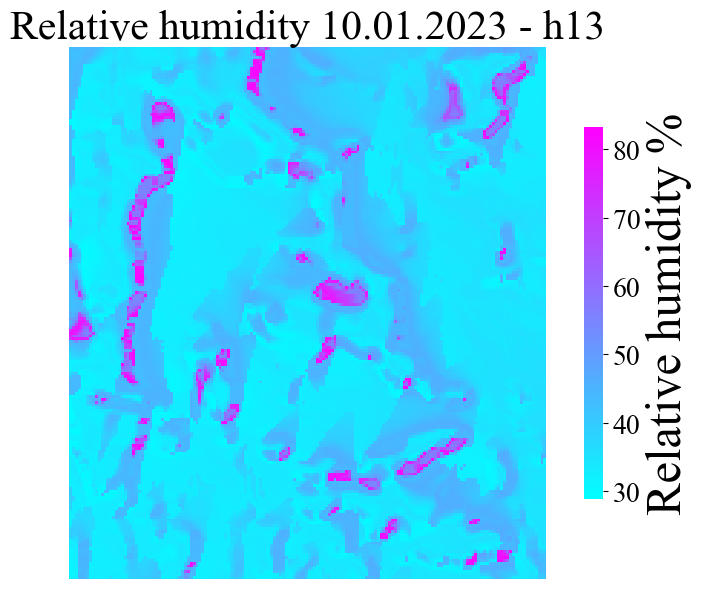

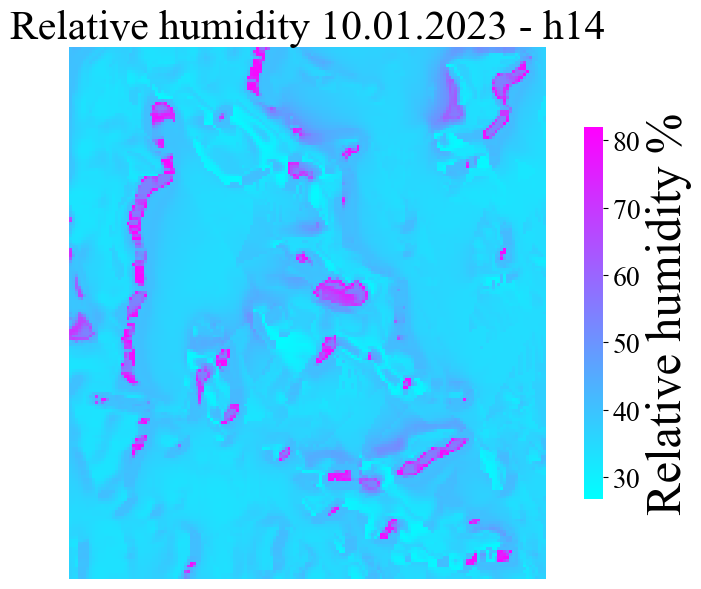

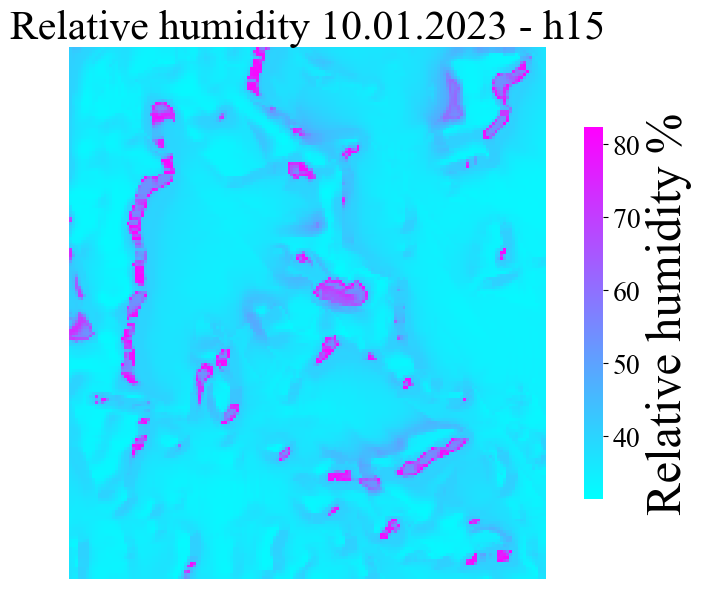

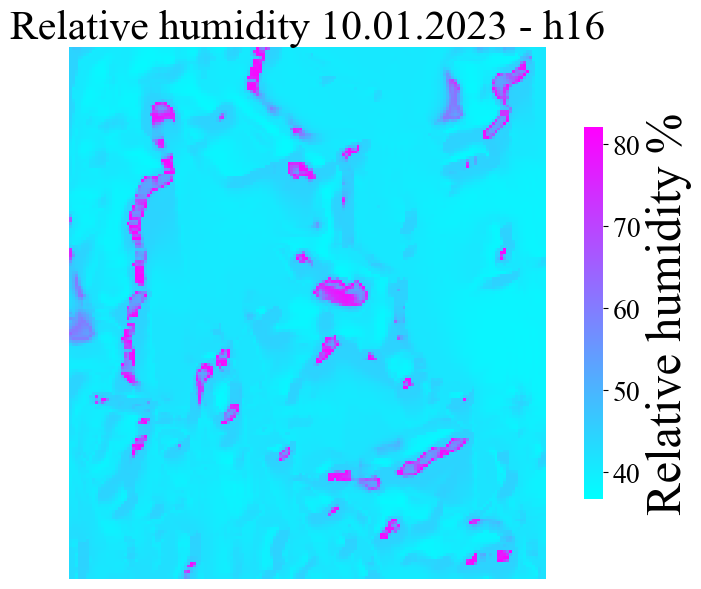

In [9]:
fig,ax = ML.make_plot_results_test_R2( save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJan_humidity_figure_results_test_R2.png', dpi=150)

fig,ax = ML.make_plot_distribution_test_mae(save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJan_humidity_figure_mae_distribution.png', dpi=150)

fig, ax = ML.make_plot_inputs_importance(n_simul = 10,save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJan_humidity_figure_input_importance.png', dpi=150)

fig_r2, ax_r2, fig_mae, ax_mae = ML.make_plot_cross_period_prediction(df_filename_cross_period = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_02_01__2023_03_06/df_microclimate_mixed_arpa_era5_FebMar_out_13-06-2023_16-59-32.p',
                                                                      cross_period_name = 'FebMar',save_fig = True)

fig_r2.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJan_humidity_figure_cross_period_results_test_R2.png', dpi=150)
fig_mae.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJan_humidity_figure_cross_period_distribution_mae.png', dpi=150)


for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                         df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2022_11_12__2023_01_15.p'),
                                                         period = period, lat = lat, long = long,
                                                         dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                         ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                         save_figure=True,)

    fig.savefig(RESULTS_PATH+'figures/microclima_prediction_figures/mixed_arpa_era5_humidity_spacemap_{}_{}_{:02d}_{:02d}.png'.format(period[0], period[1], period[2], period[3]), dpi=150)



# FebMar

In [10]:
periods = [
    [2023,2,2,9],
    [2023,2,2,10],
    [2023,2,2,11],
    [2023,2,2,12],
    [2023,2,2,13],
    [2023,2,2,14],
    [2023,2,2,15],
    [2023,2,2,16],
]

## ERA5

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 9)]               0         
                                                                 
 dense_8 (Dense)             (None, 512)               5120      
                                                                 
 dense_9 (Dense)             (None, 256)               131328    
                                                                 
 dense_10 (Dense)            (None, 128)               32896     
                                                                 
 dense_11 (Dense)            (None, 1)                 129       
                                                                 
Total params: 169,473
Trainable params: 169,473
Non-trainable params: 0
_________________________________________________________________


2023-06-21 22:34:00.586892: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 22:34:01.846689: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


INFO:tensorflow:Assets written to: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_era5/model_weights_humidity_era5__2023_02_01__2023_03_06/FFNN_humidity_era5_FebMar_out_21-06-2023_21-49-38/model_weights/assets


2023-06-21 22:41:57.625423: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 58.518663968930106   5.869399849879055
Benchmark vs prediction r2: 0.015298712747672019   0.7019522611331671


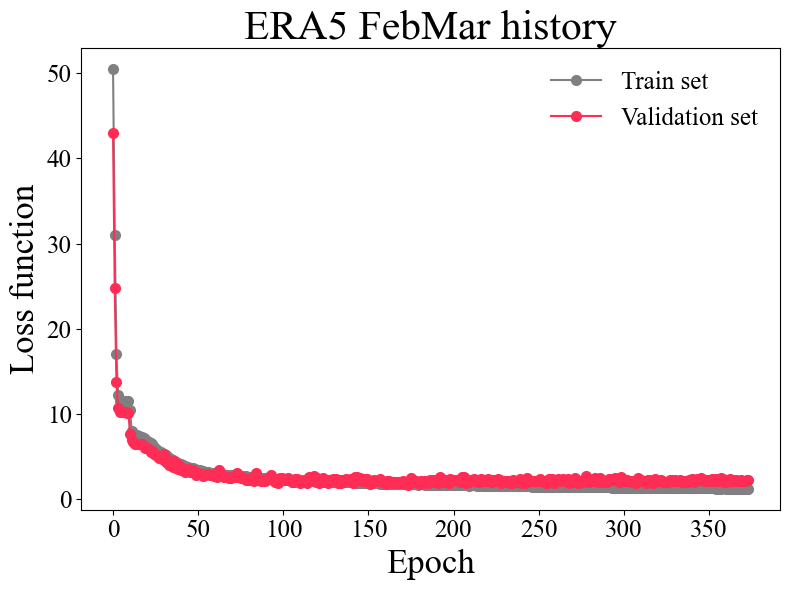

In [11]:
ML = MachineLearningFFNN(model_type_name = 'ERA5',
                         model_period_name = 'FebMar',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_02_01__2023_03_06/df_microclimate_era5_FebMar_out_13-06-2023_16-59-32.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'H_target',
                         max_n_neurons = 512,
                         min_n_neurons = 128,
                         n_layers = 3,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.elaborate_input_data(seed = 18,
                        test_train_proportion = 0.4,
                        val_test_proportion = 0.4,
                       )

ML.create_model(display_summary = True)

ML.train(epochs = 1000, patience = 200,
         metric_to_monitor = 'val_loss', restore_best_weights = True, 
         plot_history_bool = True, verbose = 0,
        )

ML.save_model_properties(datetime = DATETIME)

ML.test()

2023-06-21 22:42:23.773020: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


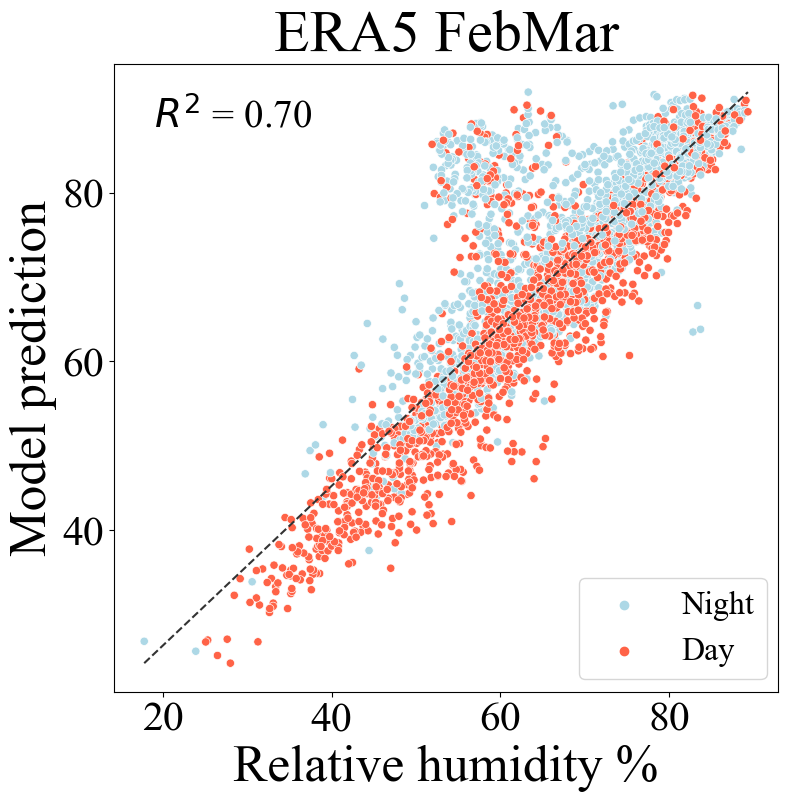

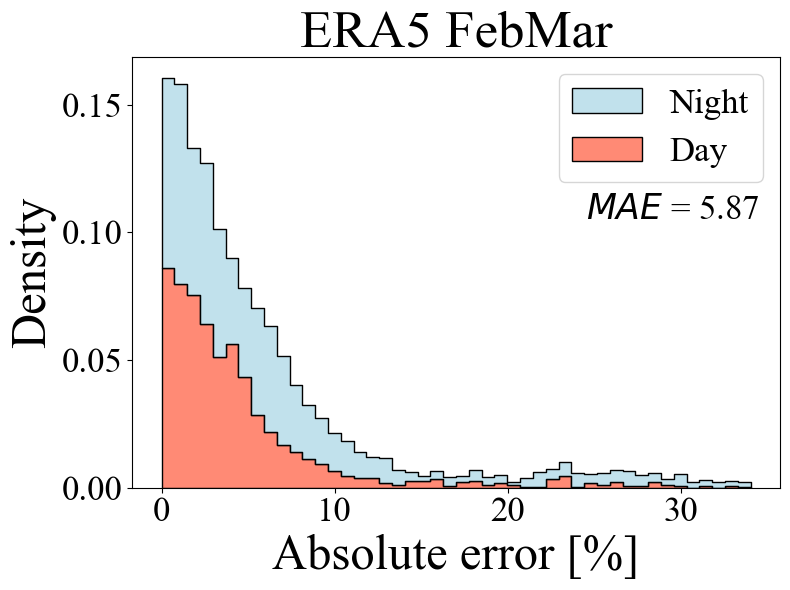

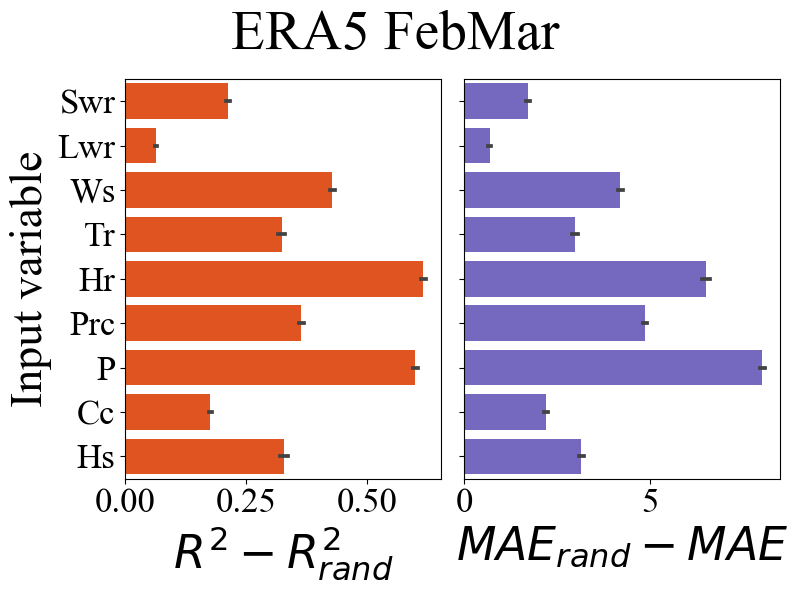

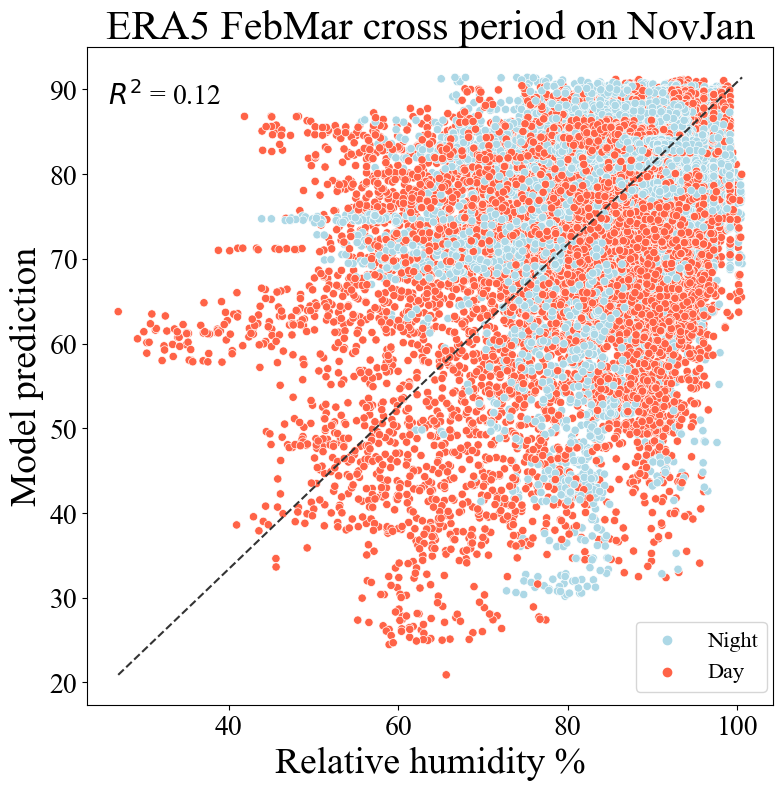

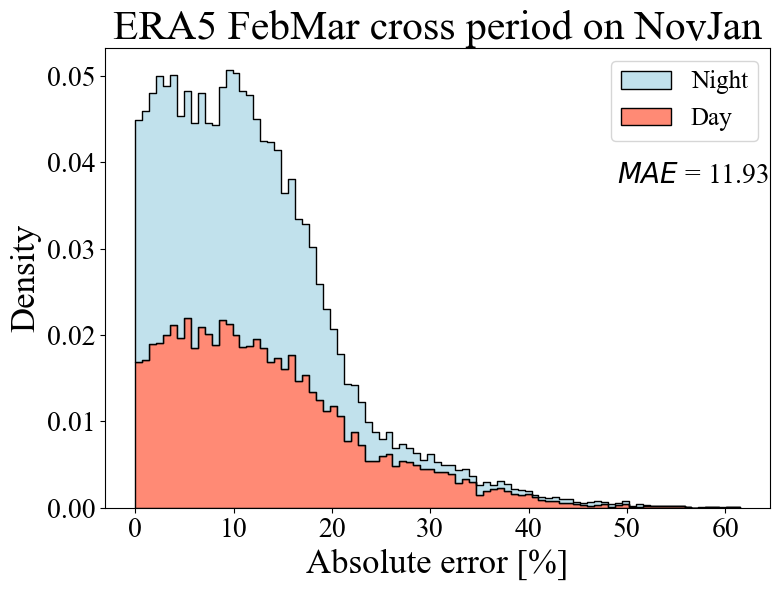

...

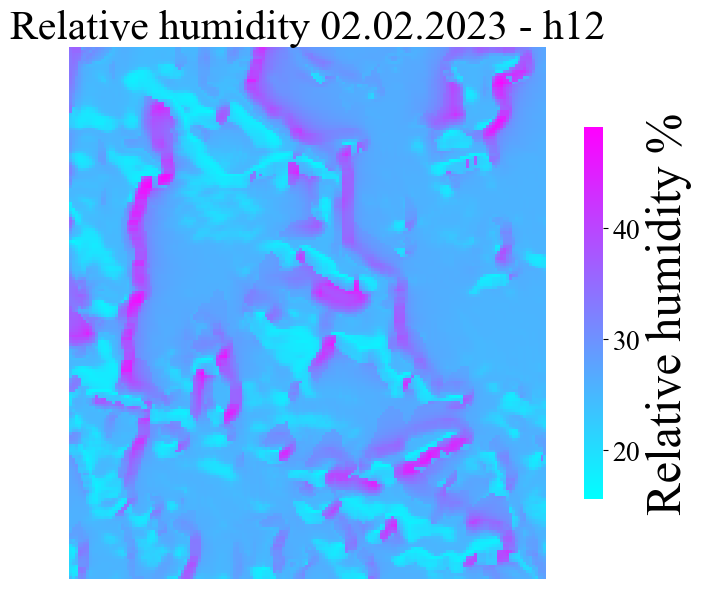

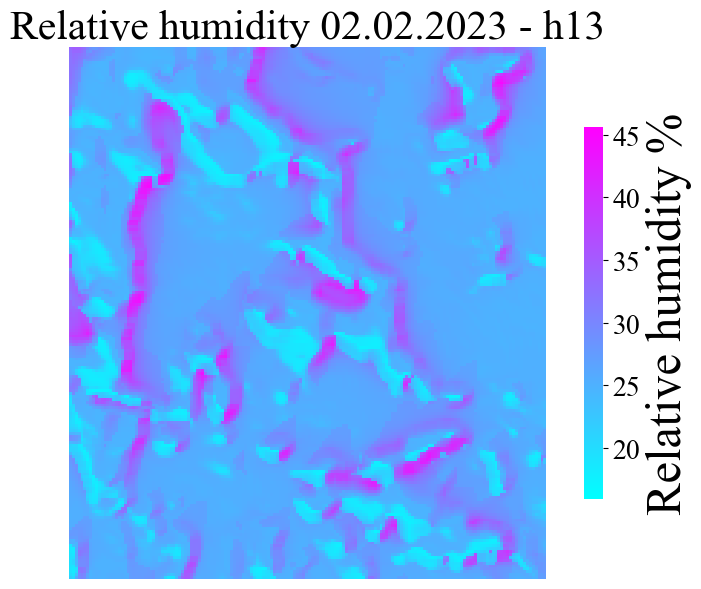

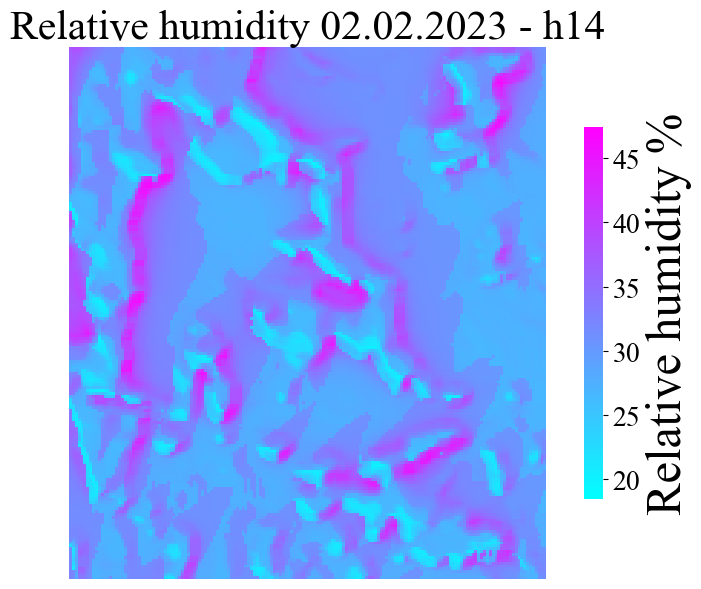

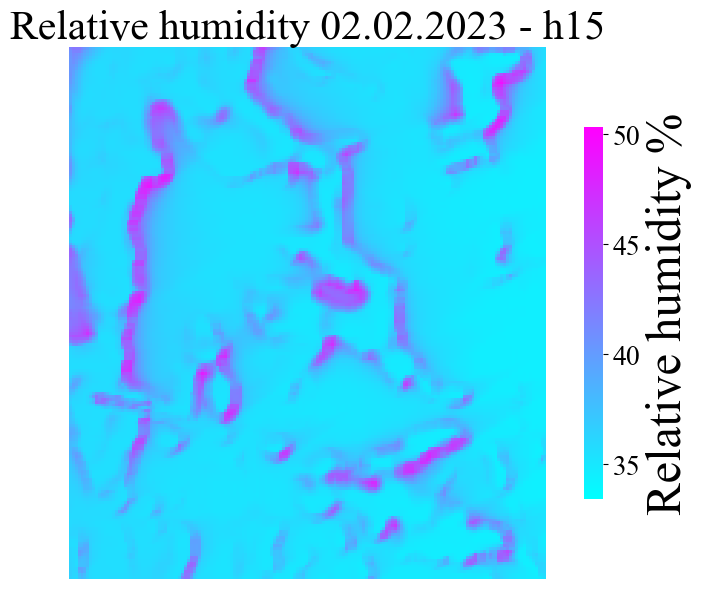

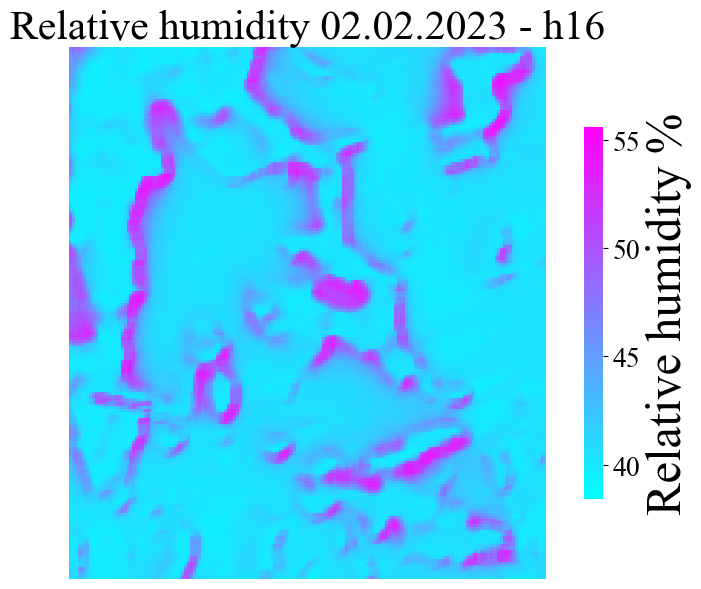

In [12]:
fig,ax = ML.make_plot_results_test_R2( save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/FebMar_humidity_figure_results_test_R2.png', dpi=150)

fig,ax = ML.make_plot_distribution_test_mae(save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/FebMar_humidity_figure_mae_distribution.png', dpi=150)

fig, ax = ML.make_plot_inputs_importance(n_simul = 10,save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/FebMar_humidity_figure_input_importance.png', dpi=150)

fig_r2, ax_r2, fig_mae, ax_mae = ML.make_plot_cross_period_prediction(df_filename_cross_period = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_01_15/df_microclimate_era5_NovJan_out_13-06-2023_16-59-32.p',
                                                                      cross_period_name = 'NovJan',save_fig = True)

fig_r2.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/FebMar_humidity_figure_cross_period_results_test_R2.png', dpi=150)
fig_mae.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/FebMar_humidity_figure_cross_period_distribution_mae.png', dpi=150)

for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                         df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2023_02_01__2023_03_06.p'),
                                                         period = period, lat = lat, long = long,
                                                         dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                         ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                         save_figure=True,)

    fig.savefig(RESULTS_PATH+'figures/microclima_prediction_figures/era5_humidity_spacemap_{}_{}_{:02d}_{:02d}.png'.format(period[0], period[1], period[2], period[3]), dpi=150)



## ARPA + ERA5

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 9)]               0         
                                                                 
 dense_12 (Dense)            (None, 512)               5120      
                                                                 
 dense_13 (Dense)            (None, 256)               131328    
                                                                 
 dense_14 (Dense)            (None, 128)               32896     
                                                                 
 dense_15 (Dense)            (None, 1)                 129       
                                                                 
Total params: 169,473
Trainable params: 169,473
Non-trainable params: 0
_________________________________________________________________


2023-06-21 22:43:24.485282: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 22:43:25.759100: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


INFO:tensorflow:Assets written to: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_mixed_arpa_era5/model_weights_humidity_mixed_arpa_era5__2023_02_01__2023_03_06/FFNN_humidity_mixed_arpa_era5_FebMar_out_21-06-2023_21-49-38/model_weights/assets


2023-06-21 22:49:01.623454: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 59.13202900739053   5.78661668960022
Benchmark vs prediction r2: 0.03506309127036613   0.6839614770635102


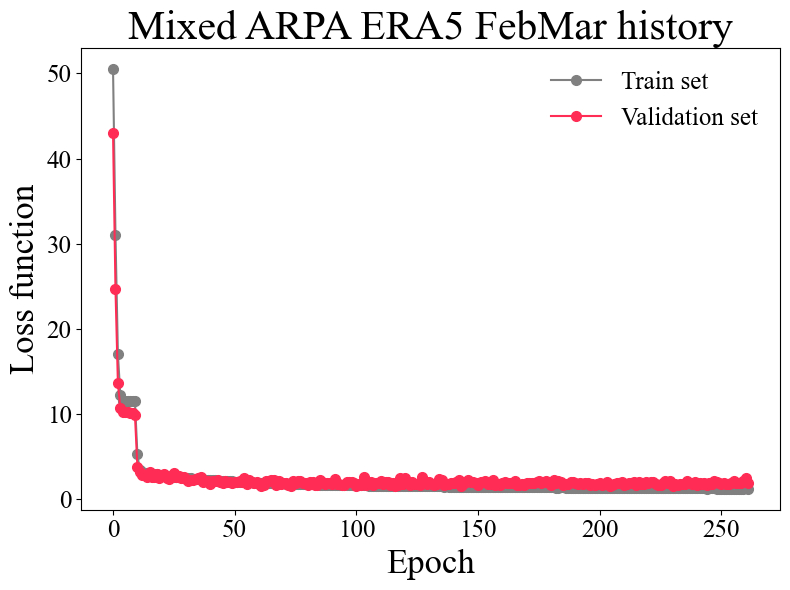

In [13]:
ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                         model_period_name = 'FebMar',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_02_01__2023_03_06/df_microclimate_mixed_arpa_era5_FebMar_out_13-06-2023_16-59-32.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'H_target',
                         max_n_neurons = 512,
                         min_n_neurons = 128,
                         n_layers = 3,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.elaborate_input_data(seed = 18,
                        test_train_proportion = 0.4,
                        val_test_proportion = 0.4,
                       )

ML.create_model(display_summary = True)

ML.train(epochs = 1000, patience = 200,
         metric_to_monitor = 'val_loss', restore_best_weights = True, 
         plot_history_bool = True, verbose = 0,
        )

ML.save_model_properties(datetime = DATETIME)

ML.test()

2023-06-21 22:49:27.812266: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


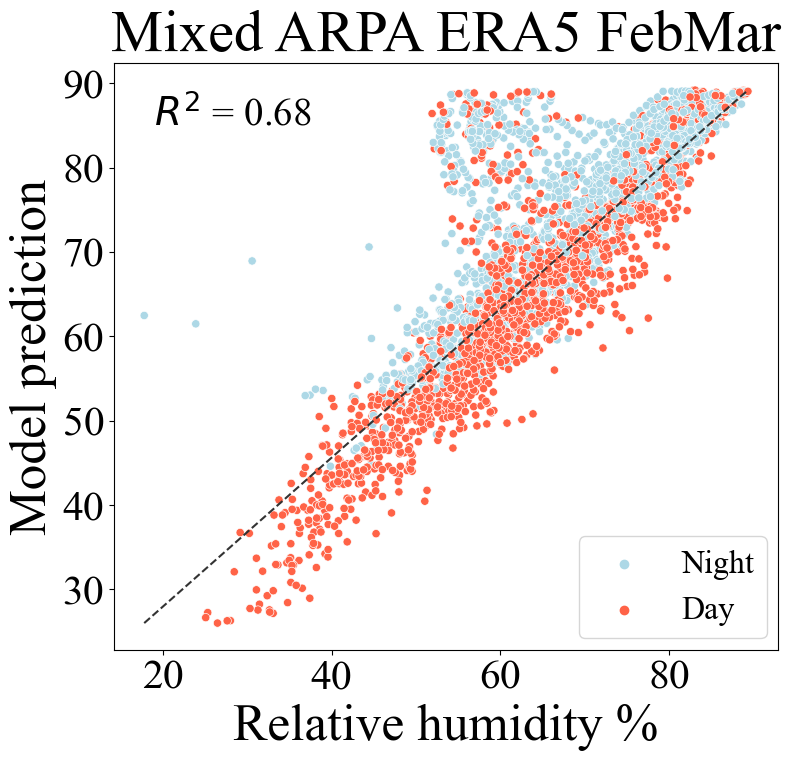

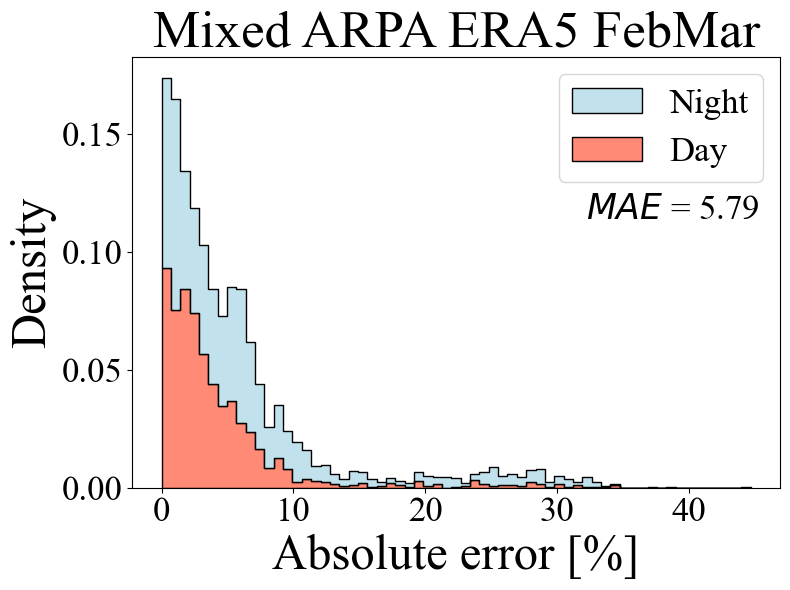

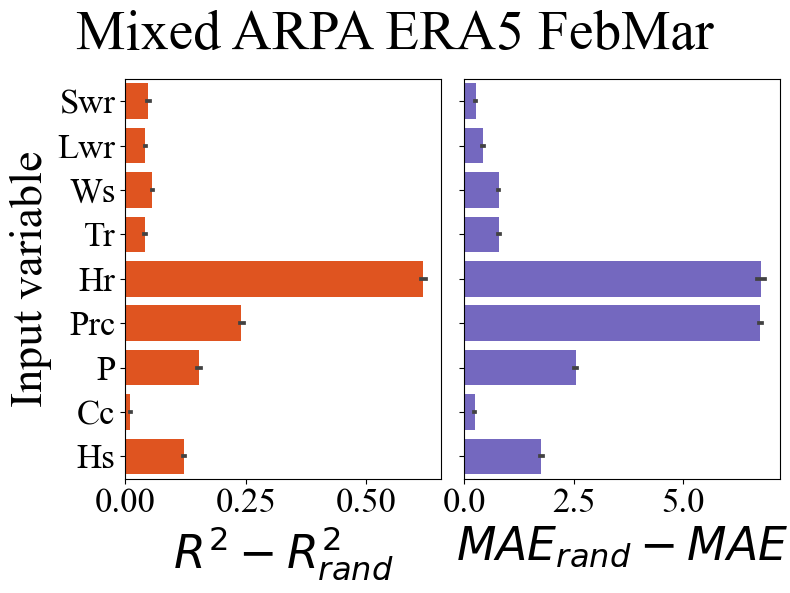

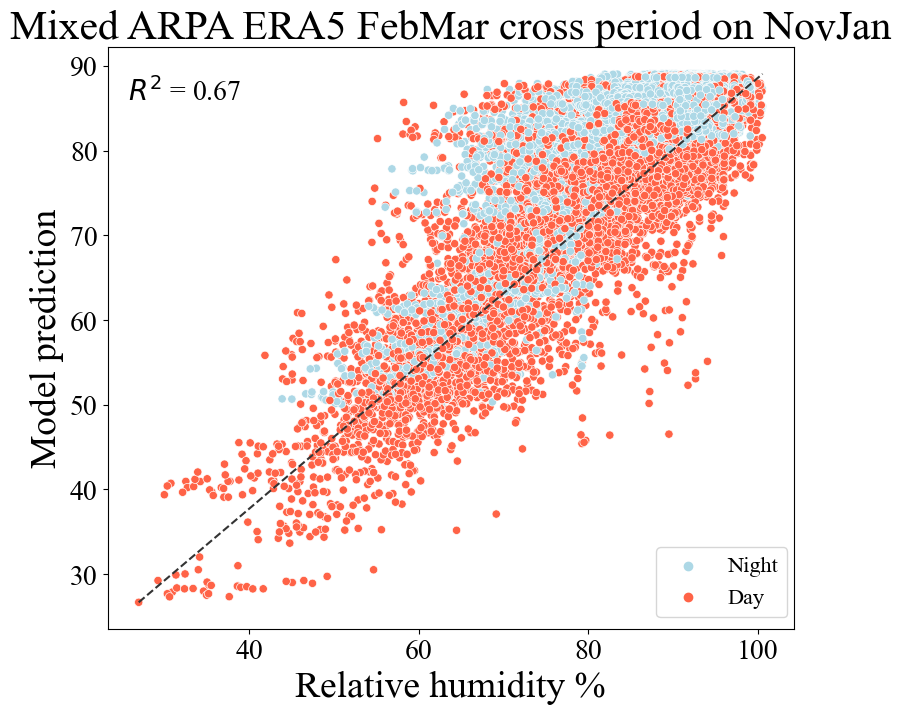

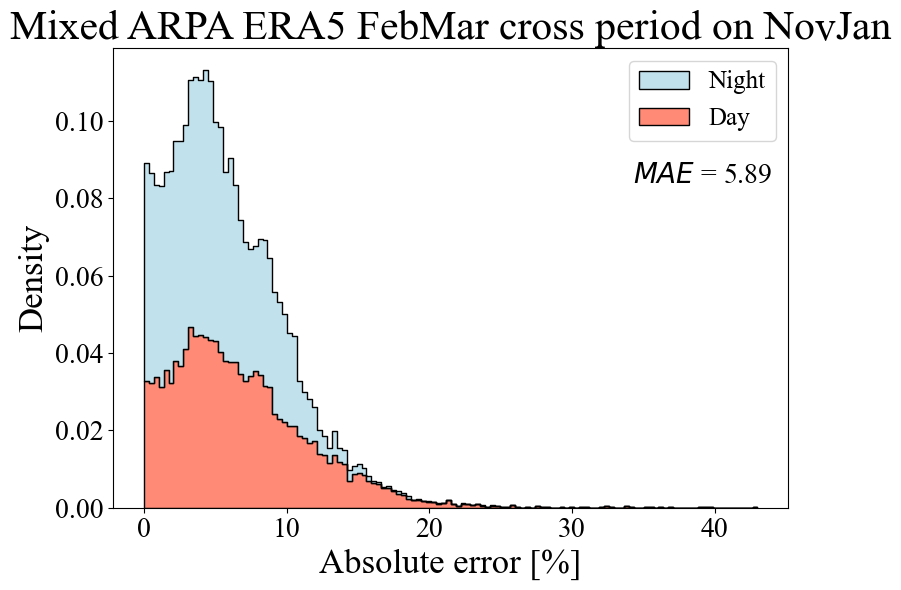

...

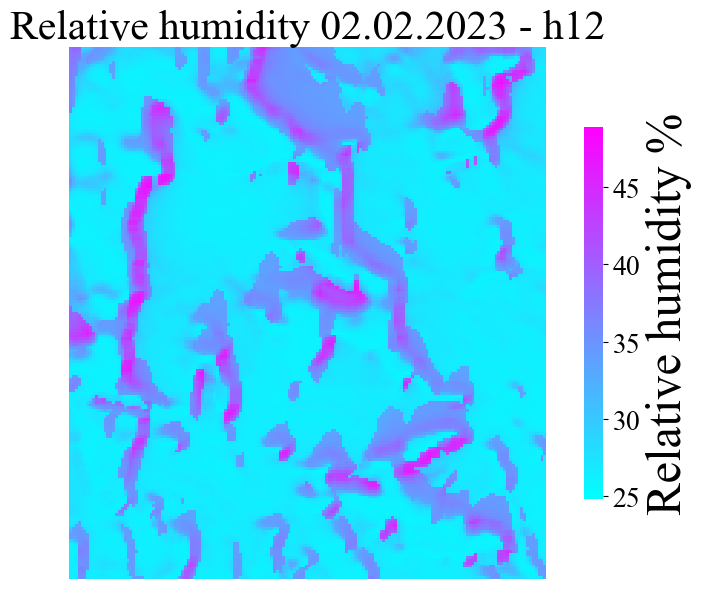

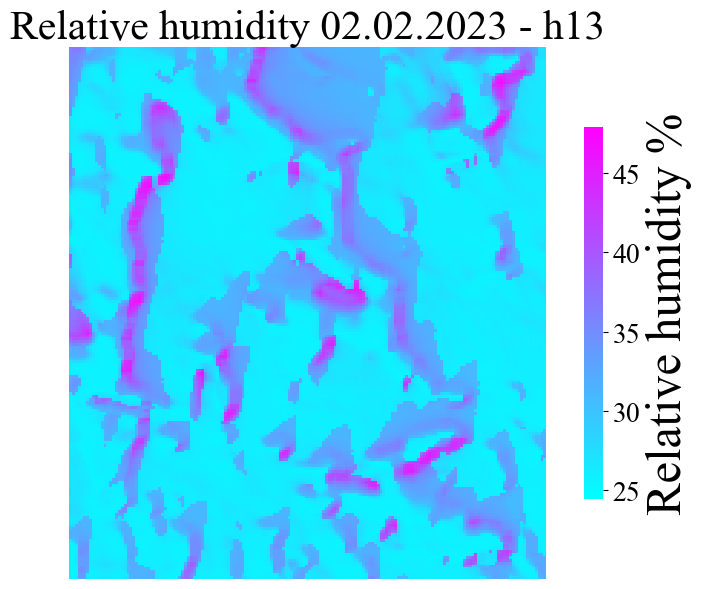

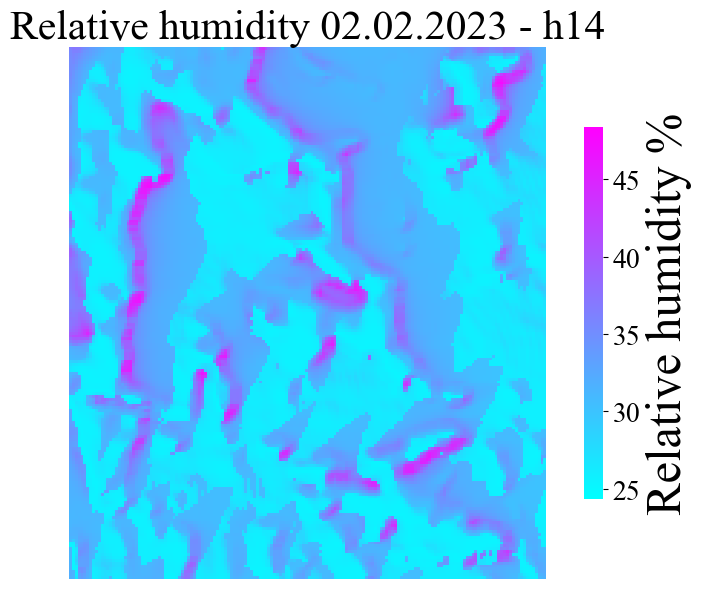

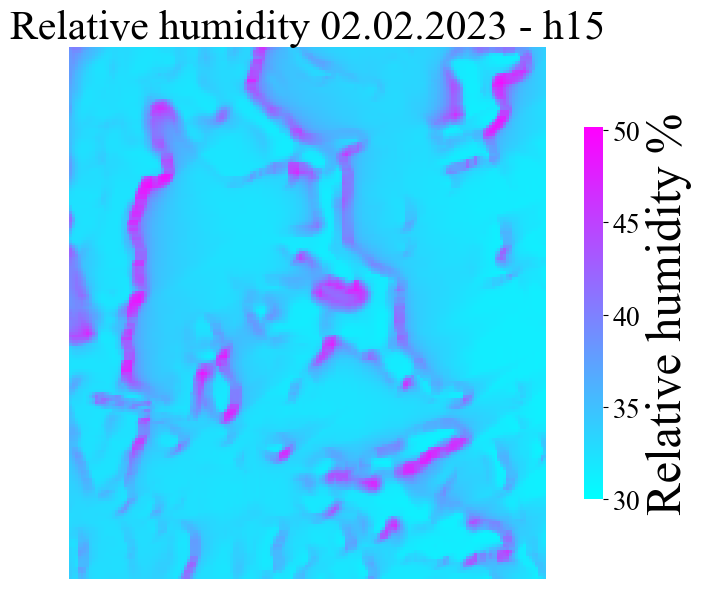

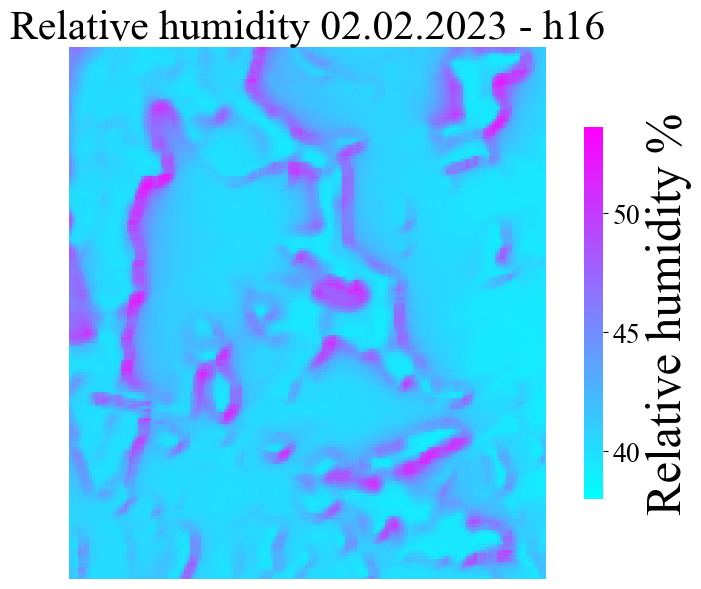

In [14]:
fig,ax = ML.make_plot_results_test_R2( save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/FebMar_humidity_figure_results_test_R2.png', dpi=150)

fig,ax = ML.make_plot_distribution_test_mae(save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/FebMar_humidity_figure_mae_distribution.png', dpi=150)

fig, ax = ML.make_plot_inputs_importance(n_simul = 10,save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/FebMar_humidity_figure_input_importance.png', dpi=150)

fig_r2, ax_r2, fig_mae, ax_mae = ML.make_plot_cross_period_prediction(df_filename_cross_period = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_01_15/df_microclimate_mixed_arpa_era5_NovJan_out_13-06-2023_16-59-32.p',
                                                                      cross_period_name = 'NovJan',save_fig = True)

fig_r2.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/FebMar_humidity_figure_cross_period_results_test_R2.png', dpi=150)
fig_mae.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/FebMar_humidity_figure_cross_period_distribution_mae.png', dpi=150)

for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                         df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2023_02_01__2023_03_06.p'),
                                                         period = period, lat = lat, long = long,
                                                         dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                         ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                         save_figure=True,)

    fig.savefig(RESULTS_PATH+'figures/microclima_prediction_figures/mixed_arpa_era5_humidity_spacemap_{}_{}_{:02d}_{:02d}.png'.format(period[0], period[1], period[2], period[3]), dpi=150)



# MarJun

In [7]:
periods = [
    [2023,6,20,9],
    [2023,6,20,10],
    [2023,6,20,11],
    [2023,6,20,12],
    [2023,6,20,13],
    [2023,6,20,14],
    [2023,6,20,15],
    [2023,6,20,16],
]

## ERA5

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 9)]               0         
                                                                 
 dense_5 (Dense)             (None, 1024)              10240     
                                                                 
 dense_6 (Dense)             (None, 512)               524800    
                                                                 
 dense_7 (Dense)             (None, 256)               131328    
                                                                 
 dense_8 (Dense)             (None, 128)               32896     
                                                                 
 dense_9 (Dense)             (None, 1)                 129       
                                                                 
Total params: 699,393
Trainable params: 699,393
Non-trainab

2023-06-30 11:22:48.199580: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 11:22:53.651242: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


INFO:tensorflow:Assets written to: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_era5/model_weights_humidity_era5__2023_03_27__2023_06_22/FFNN_humidity_era5_MarJun_out_30-06-2023_11-20-20/model_weights/assets


2023-06-30 11:50:22.884708: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 60.41159697262934   5.205176770923383
Benchmark vs prediction r2: 0.0008146804209172057   0.8421807240079743


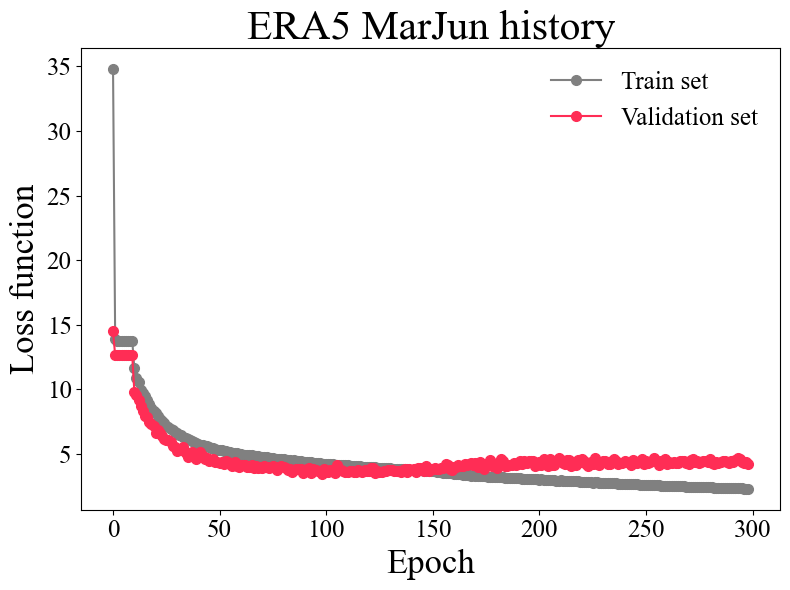

In [8]:
ML = MachineLearningFFNN(model_type_name = 'ERA5',
                         model_period_name = 'MarJun',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_03_27__2023_06_22/df_microclimate_era5_MarJun_out_28-06-2023_22-26-55.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'H_target',
                         max_n_neurons = 1024,
                         min_n_neurons = 128,
                         n_layers = 4,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.elaborate_input_data(seed = 18,
                        test_train_proportion = 0.4,
                        val_test_proportion = 0.4,
                       )

ML.create_model(display_summary = True)

ML.train(epochs = 1000, patience = 200,
         metric_to_monitor = 'val_loss', restore_best_weights = True, 
         plot_history_bool = True, verbose = 0,
        )

ML.save_model_properties(datetime = DATETIME)

ML.test()

2023-06-30 11:51:25.821882: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


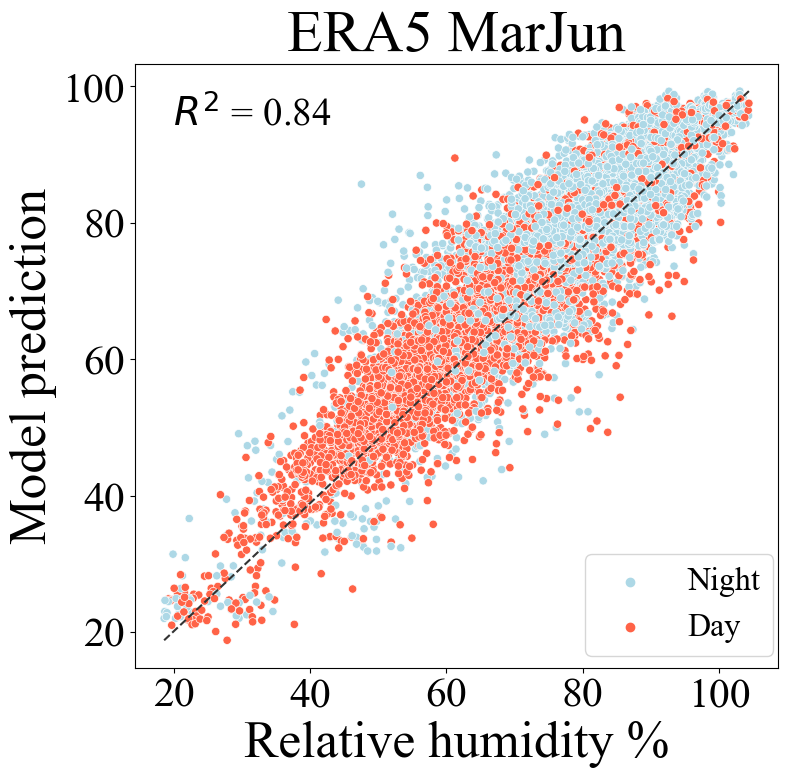

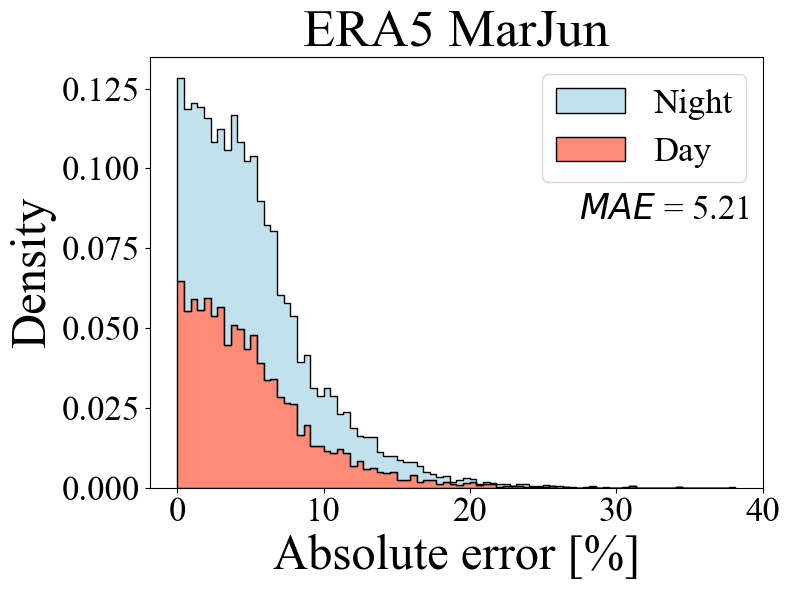

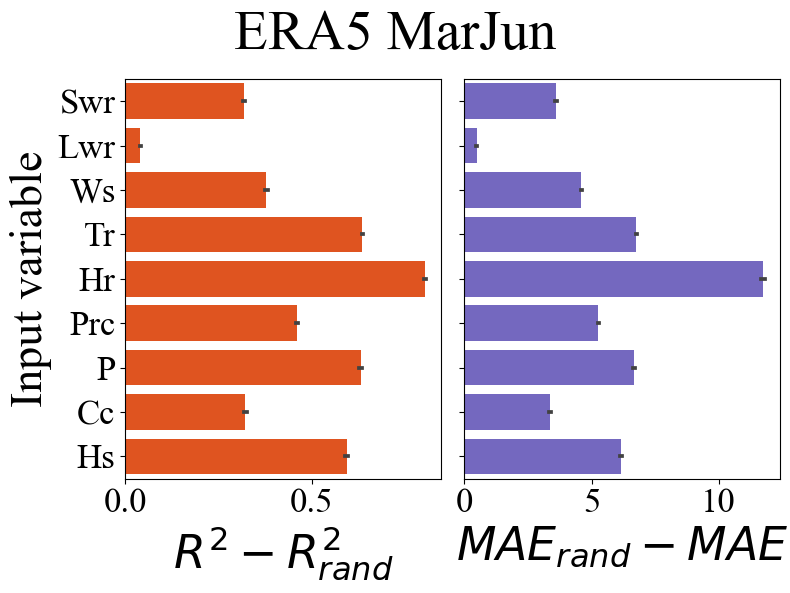

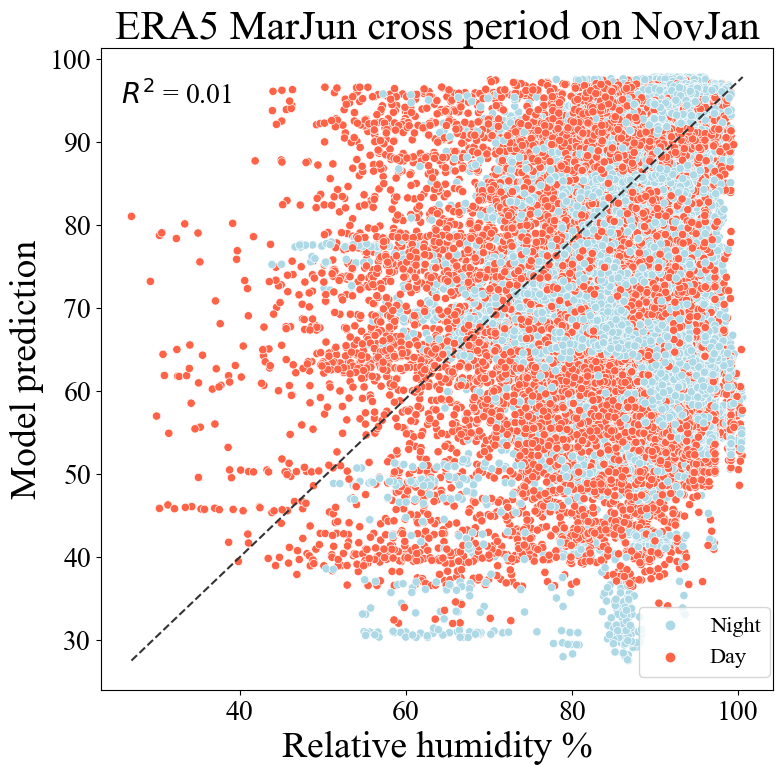

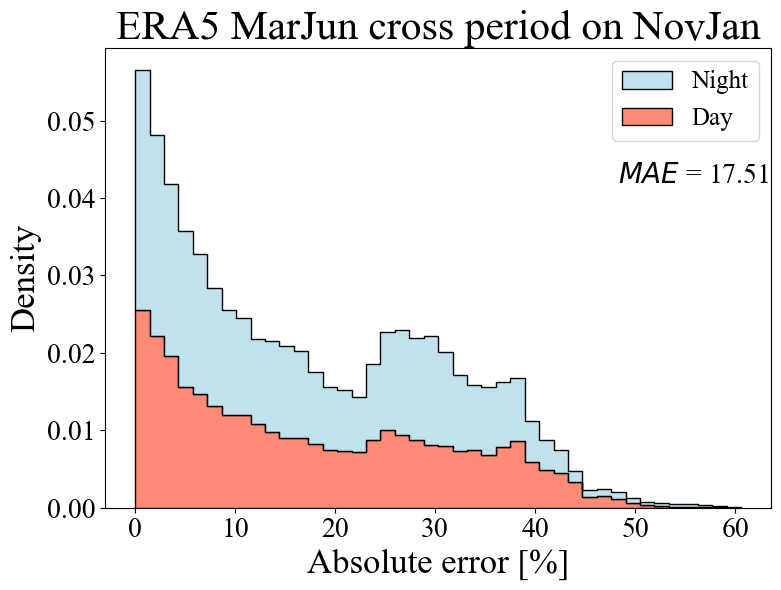

...

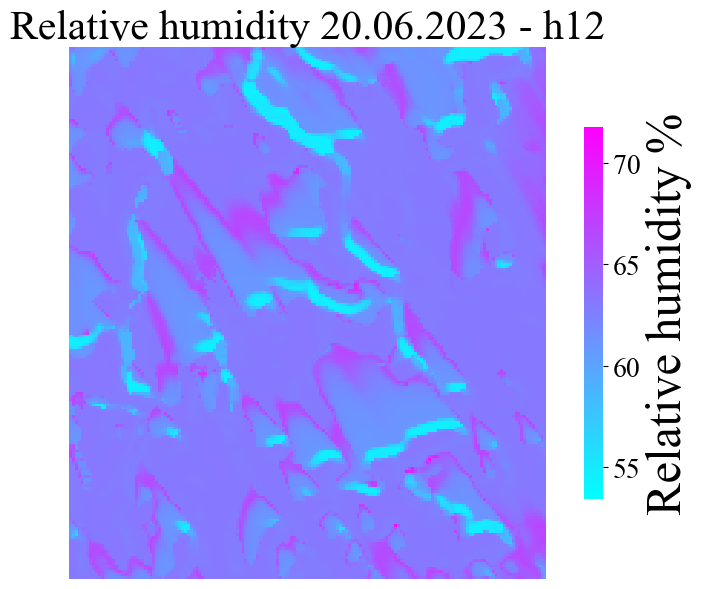

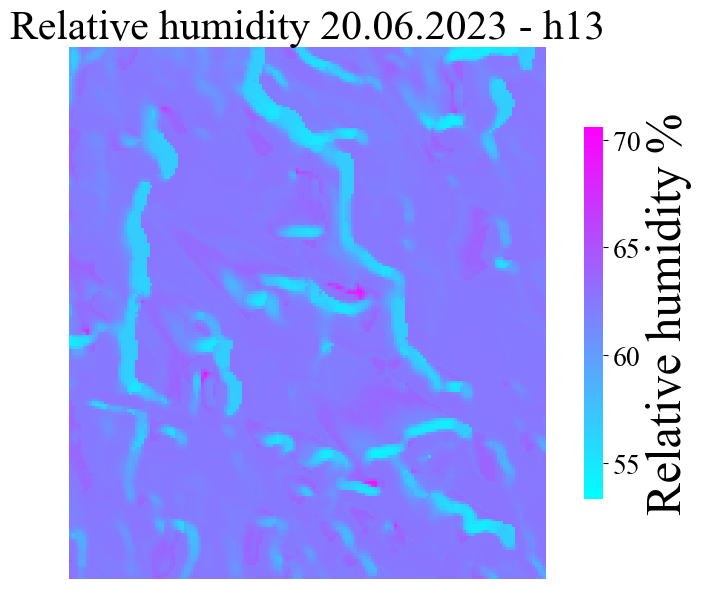

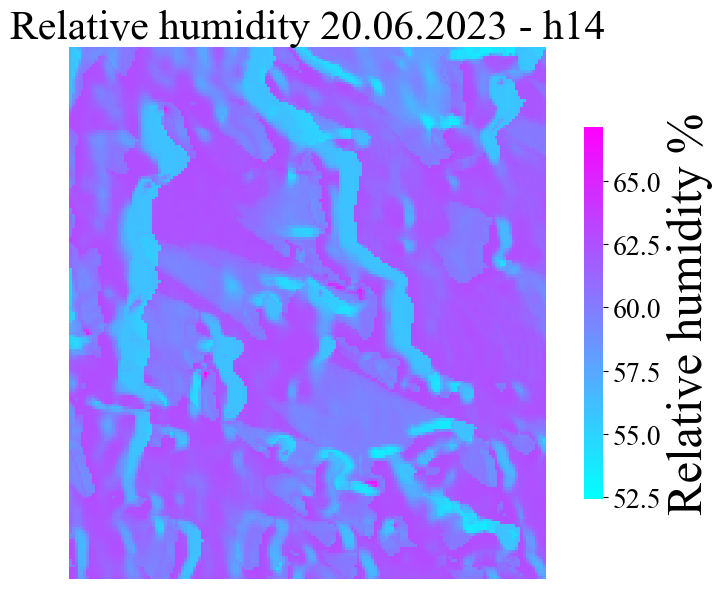

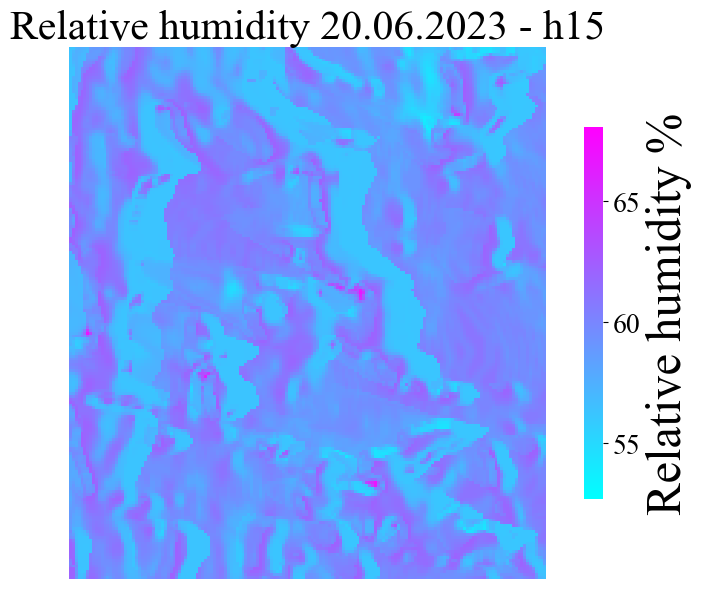

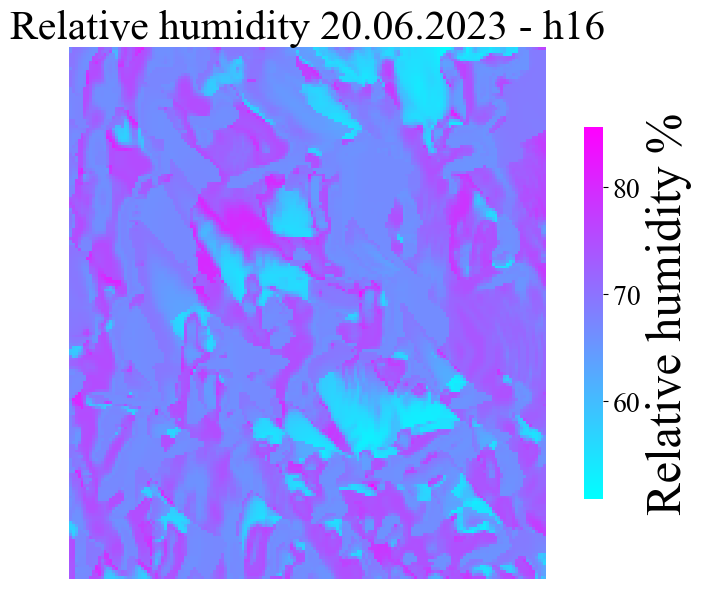

In [9]:
fig,ax = ML.make_plot_results_test_R2( save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/MarJun_humidity_figure_results_test_R2.png', dpi=150)

fig,ax = ML.make_plot_distribution_test_mae(save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/MarJun_humidity_figure_mae_distribution.png', dpi=150)

fig, ax = ML.make_plot_inputs_importance(n_simul = 10,save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/MarJun_humidity_figure_input_importance.png', dpi=150)

fig_r2, ax_r2, fig_mae, ax_mae = ML.make_plot_cross_period_prediction(df_filename_cross_period = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_01_15/df_microclimate_era5_NovJan_out_13-06-2023_16-59-32.p',
                                                                      cross_period_name = 'NovJan',save_fig = True)

fig_r2.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/MarJun_humidity_figure_cross_period_NovJan_results_test_R2.png', dpi=150)
fig_mae.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/MarJun_humidity_figure_cross_period_NovJan_distribution_mae.png', dpi=150)

fig_r2, ax_r2, fig_mae, ax_mae = ML.make_plot_cross_period_prediction(df_filename_cross_period = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_02_01__2023_03_06/df_microclimate_era5_FebMar_out_13-06-2023_16-59-32.p',
                                                                      cross_period_name = 'FebMar',save_fig = True)

fig_r2.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/MarJun_humidity_figure_cross_period_FebMar_results_test_R2.png', dpi=150)
fig_mae.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/MarJun_humidity_figure_cross_period_FebMar_distribution_mae.png', dpi=150)


for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                         df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2023_03_27__2023_06_22.p'),
                                                         period = period, lat = lat, long = long,
                                                         dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                         ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                         save_figure=True,)

    fig.savefig(RESULTS_PATH+'figures/microclima_prediction_figures/era5_humidity_temperature_spacemap_{}_{}_{:02d}_{:02d}.png'.format(period[0], period[1], period[2], period[3]), dpi=150)


## ARPA + ERA5

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 9)]               0         
                                                                 
 dense_10 (Dense)            (None, 256)               2560      
                                                                 
 dense_11 (Dense)            (None, 128)               32896     
                                                                 
 dense_12 (Dense)            (None, 1)                 129       
                                                                 
Total params: 35,585
Trainable params: 35,585
Non-trainable params: 0
_________________________________________________________________


2023-06-30 11:52:21.164293: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 11:52:25.020089: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


INFO:tensorflow:Assets written to: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_mixed_arpa_era5/model_weights_humidity_mixed_arpa_era5__2023_03_27__2023_06_22/FFNN_humidity_mixed_arpa_era5_MarJun_out_30-06-2023_11-20-20/model_weights/assets


2023-06-30 12:06:18.053195: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 59.68664550040499   5.066965739043074
Benchmark vs prediction r2: 0.0353181590157266   0.8556652976341826


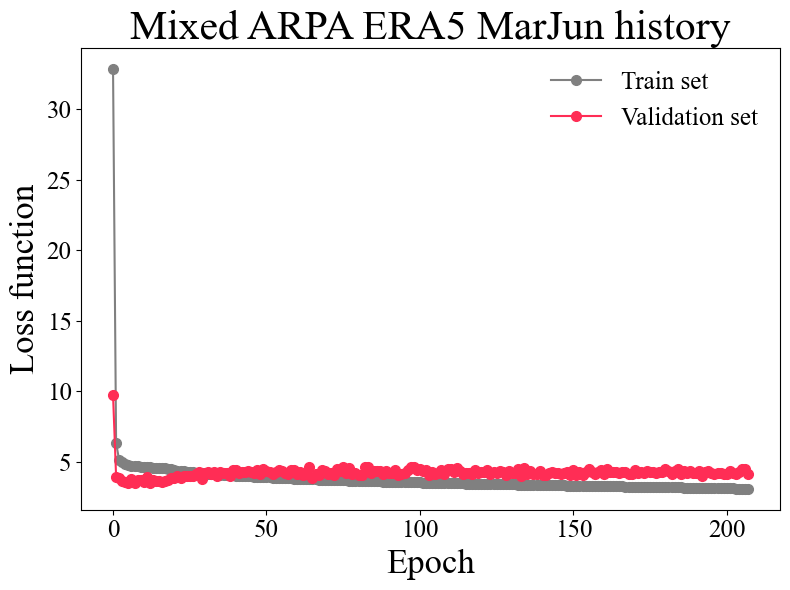

In [10]:
ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                         model_period_name = 'MarJun',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_03_27__2023_06_22/df_microclimate_mixed_arpa_era5_MarJun_out_29-06-2023_14-03-45.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'H_target',
                         max_n_neurons = 256,
                         min_n_neurons = 128,
                         n_layers = 2,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.elaborate_input_data(seed = 18,
                        test_train_proportion = 0.4,
                        val_test_proportion = 0.4,
                       )

ML.create_model(display_summary = True)

ML.train(epochs = 1000, patience = 200,
         metric_to_monitor = 'val_loss', restore_best_weights = True, 
         plot_history_bool = True, verbose = 0,
        )

ML.save_model_properties(datetime = DATETIME)

ML.test()

2023-06-30 12:09:38.377032: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


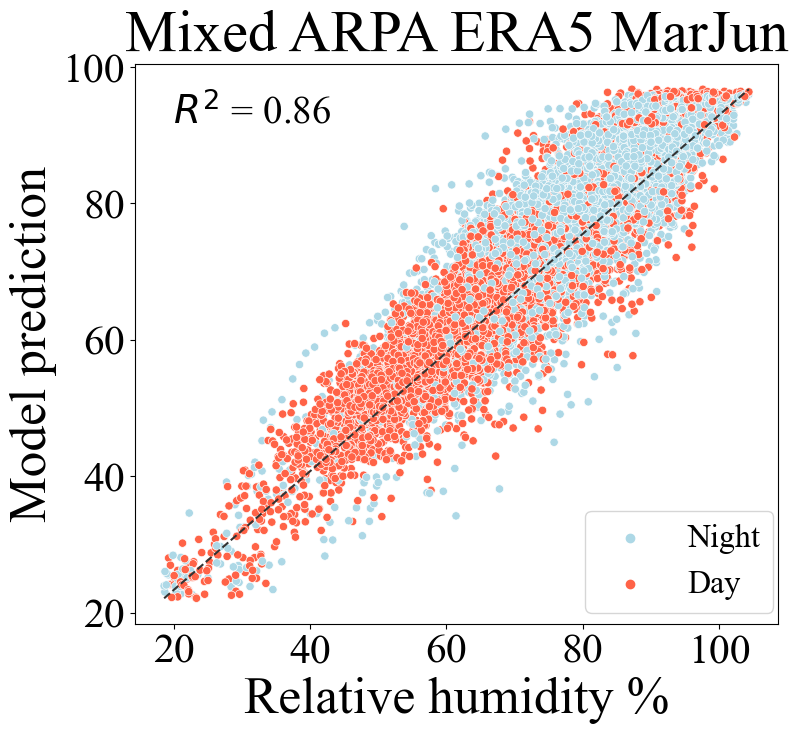

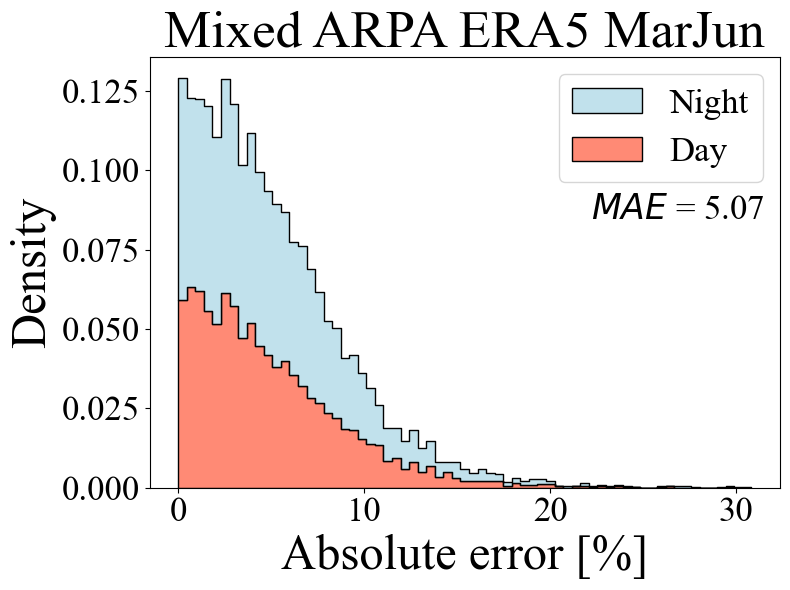

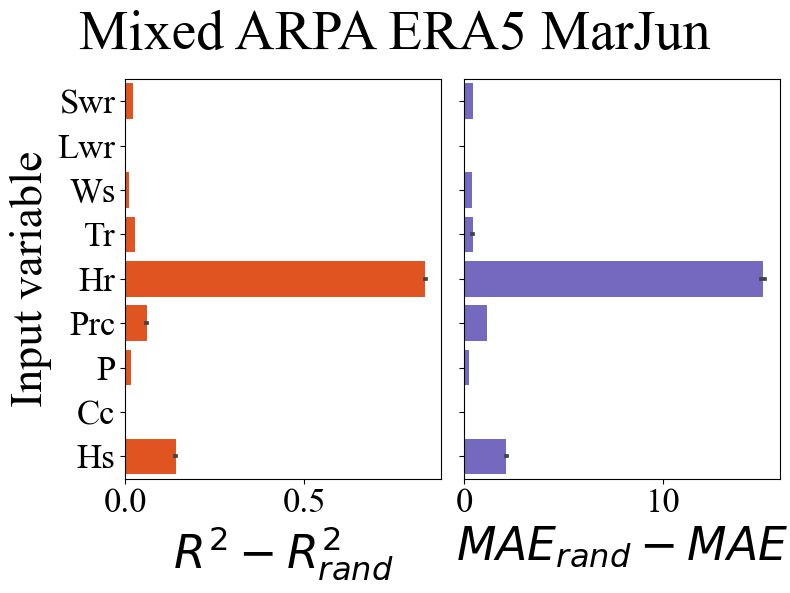

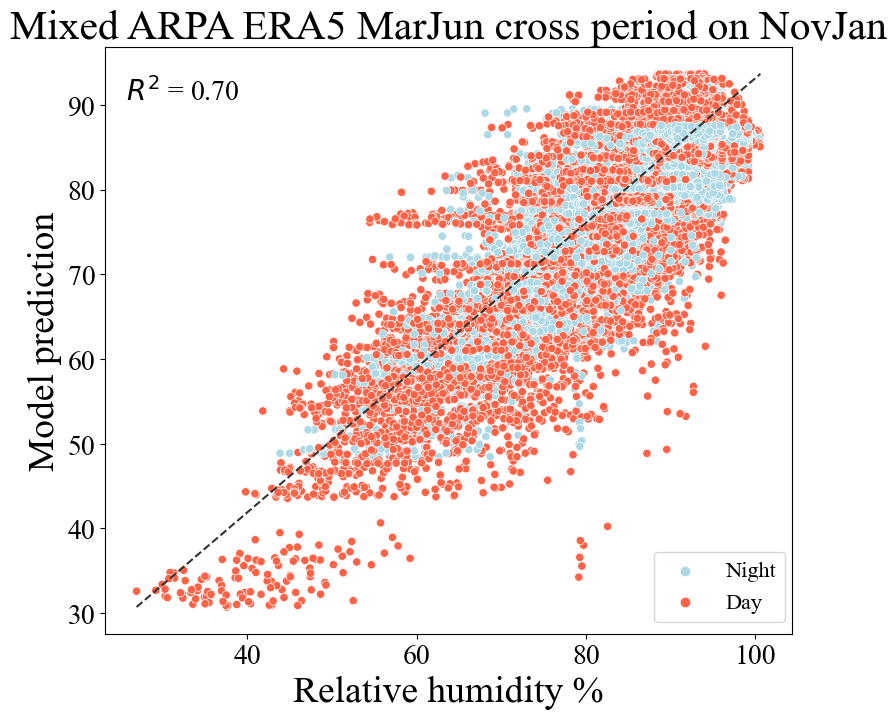

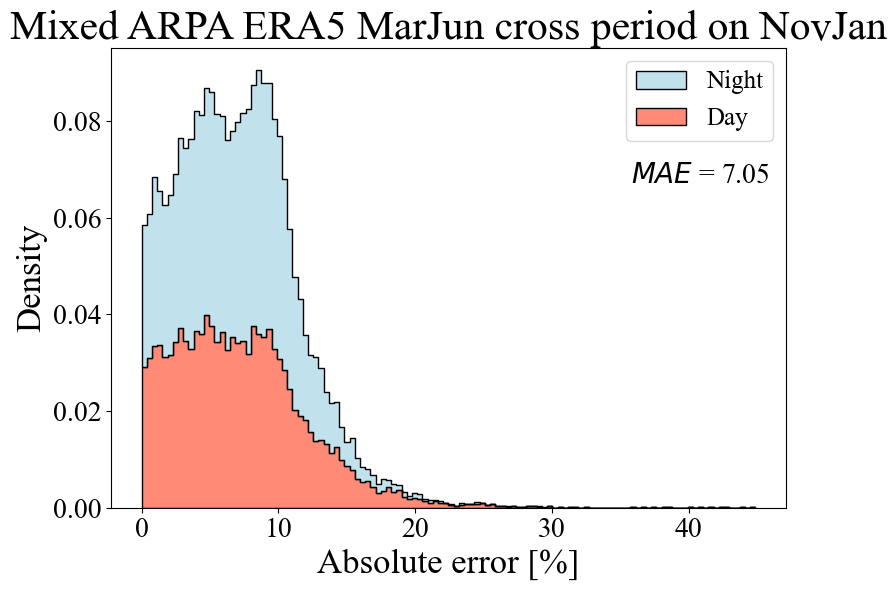

...

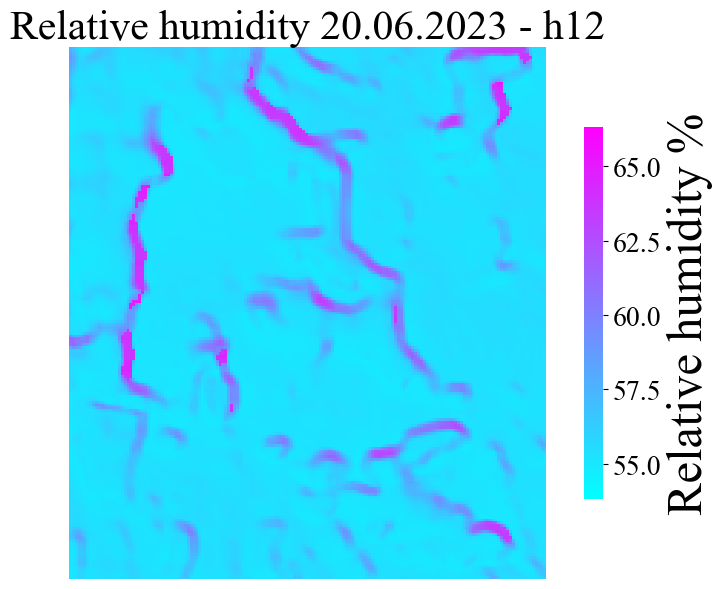

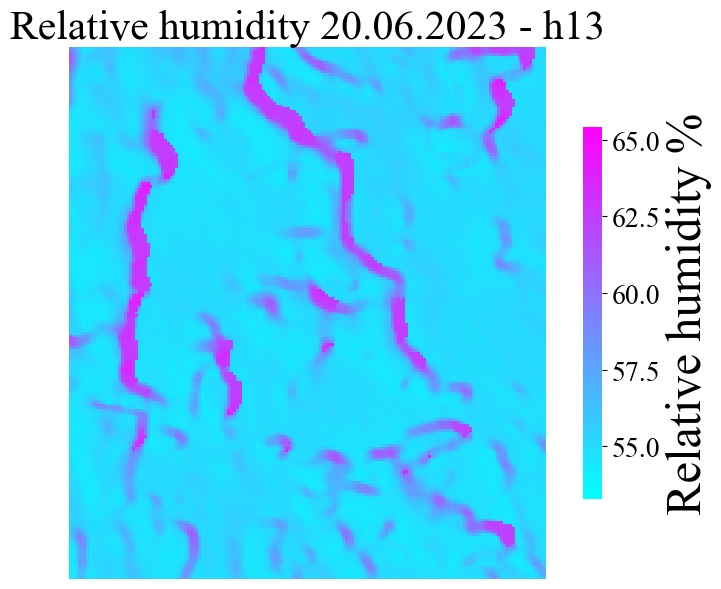

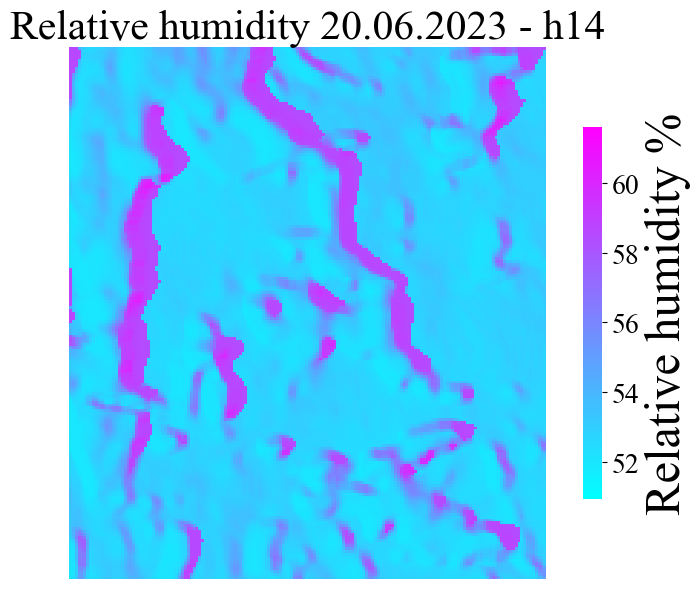

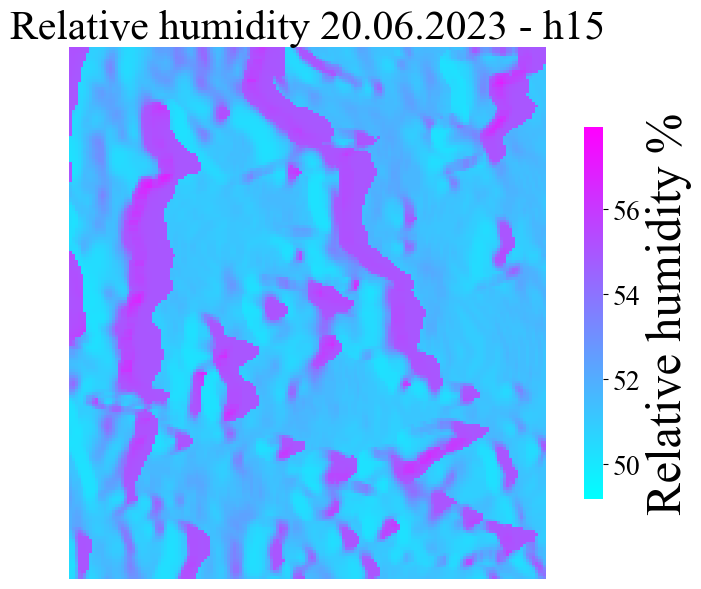

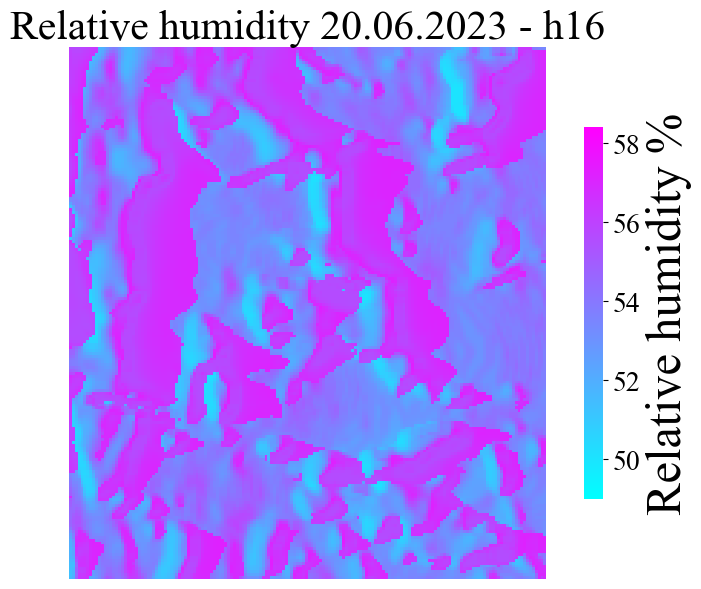

In [12]:
fig,ax = ML.make_plot_results_test_R2( save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/MarJun_humidity_figure_results_test_R2.png', dpi=150)

fig,ax = ML.make_plot_distribution_test_mae(save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/MarJun_humidity_figure_mae_distribution.png', dpi=150)

fig, ax = ML.make_plot_inputs_importance(n_simul = 10,save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/MarJun_humidity_figure_input_importance.png', dpi=150)

fig_r2, ax_r2, fig_mae, ax_mae = ML.make_plot_cross_period_prediction(df_filename_cross_period = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_01_15/df_microclimate_mixed_arpa_era5_NovJan_out_13-06-2023_16-59-32.p',
                                                                      cross_period_name = 'NovJan',save_fig = True)

fig_r2.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/MarJun_humidity_figure_cross_period_NovJan_results_test_R2.png', dpi=150)
fig_mae.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/MarJun_humidity_figure_cross_period_NovJan_distribution_mae.png', dpi=150)

fig_r2, ax_r2, fig_mae, ax_mae = ML.make_plot_cross_period_prediction(df_filename_cross_period = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_02_01__2023_03_06/df_microclimate_mixed_arpa_era5_FebMar_out_13-06-2023_16-59-32.p',
                                                                      cross_period_name = 'FebMar',save_fig = True)

fig_r2.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/MarJun_humidity_figure_cross_period_FebMar_results_test_R2.png', dpi=150)
fig_mae.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/MarJun_humidity_figure_cross_period_FebMar_distribution_mae.png', dpi=150)


for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                         df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2023_03_27__2023_06_22.p'),
                                                         period = period, lat = lat, long = long,
                                                         dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                         ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                         save_figure=True,)

    fig.savefig(RESULTS_PATH+'figures/microclima_prediction_figures/mixed_arpa_era5_humidity_temperature_spacemap_{}_{}_{:02d}_{:02d}.png'.format(period[0], period[1], period[2], period[3]), dpi=150)



# Supplementary tests

This section includes several supplementary tests:
1. Hyperparameter optimization.
2. Evaluation of $R^2$ and MAE variations across different sensor configurations in the test, train, and validation sets.
3. Comparison between the neural network and a simple linear regression model across different sensor configurations to assess the neural network's superiority.
4. Benchmark testing across different sensor configurations.

## Hyperparameter optimization

Various hyperparameter configurations defining the neural network architecture were tested, and the configuration that achieved the lowest test accuracy was chosen as the final architecture. Specifically, four different configurations involving the number of hidden layers and the maximum number of neurons were examined. The sigmoidal activation function and the initial learning rate were kept constant throughout the testing process.

### NovJun

In [3]:
hyperparam_configs = [
    [2048,5],
    [1024,4],
    [512,3],
    [256,2],
    [128,1],
]

for hyperparam_config in hyperparam_configs:

    ML = MachineLearningFFNN(model_type_name = 'ERA5',
                             model_period_name = 'NovJun',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_06_22/df_microclimate_era5_NovJun_out_30-06-2023_12-42-55.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'H_target',
                             max_n_neurons = hyperparam_config[0],
                             min_n_neurons = 128,
                             n_layers = hyperparam_config[1],
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data_fixed_sensors(idxs_train = [2,4,5,6,7,9,10,11,14,16,17,18,19,20,21,24,25],
                                          idxs_validation = [3,12,13,22],
                                          idxs_test = [1,8,15,23],
                                         )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    print(hyperparam_config)
    ML.test()

    del ML, hyperparam_config

Metal device set to: Apple M1


2023-06-30 23:24:45.582076: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-06-30 23:24:45.582176: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-06-30 23:24:45.738921: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-06-30 23:24:45.908405: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 23:25:03.597602: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[2048, 5]


2023-07-01 00:23:33.940324: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 63.7765742952038   13.86344056521046
Benchmark vs prediction r2: 0.001200530005227478   0.0


2023-07-01 00:23:37.729060: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-07-01 00:23:47.986762: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[1024, 4]


2023-07-01 01:00:20.646263: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 63.7765742952038   5.609348987720961
Benchmark vs prediction r2: 0.001200530005227478   0.6488649424929128


2023-07-01 01:00:24.242316: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-07-01 01:00:32.459225: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[512, 3]


2023-07-01 01:31:33.535758: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 63.7765742952038   5.582750515094724
Benchmark vs prediction r2: 0.001200530005227478   0.6467281475249244


2023-07-01 01:31:37.202179: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-07-01 01:31:44.226619: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[256, 2]


2023-07-01 01:58:34.506891: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 63.7765742952038   6.346281333905756
Benchmark vs prediction r2: 0.001200530005227478   0.6183368695516679


2023-07-01 01:58:37.952216: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-07-01 01:58:45.650923: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[128, 1]


2023-07-01 02:28:52.566399: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 63.7765742952038   8.608398431086163
Benchmark vs prediction r2: 0.001200530005227478   0.45308971620674326


Hyperparameters configurations for ERA5 on NovJun

| Hypeparameters |    R2    |   MAE   |
|----------------|:--------:|------:  |
| 5, 2048        | $0$  | $13.863$ |
| 4, 1024        | $0.649$  | $ 5.609$ |
| 3, 512         | $0.647$  | $5.583$ |
| 2, 256         | $0.618$  | $6.346$ |
| 1, 128         | $0.453$  | $8.608$ |

In [4]:
hyperparam_configs = [
    [2048,5],
    [1024,4],
    [512,3],
    [256,2],
    [128,1],
]

for hyperparam_config in hyperparam_configs:

    ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                             model_period_name = 'NovJun',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_06_22/df_microclimate_mixed_arpa_era5_NovJun_out_30-06-2023_12-42-55',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'H_target',
                             max_n_neurons = hyperparam_config[0],
                             min_n_neurons = 128,
                             n_layers = hyperparam_config[1],
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data_fixed_sensors(idxs_train = [2,4,5,6,7,9,10,11,14,16,17,18,19,20,21,24,25],
                                          idxs_validation = [3,12,13,22],
                                          idxs_test = [1,8,15,23],
                                         )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    print(hyperparam_config)
    ML.test()

    del ML, hyperparam_config

2023-07-01 02:28:55.937088: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-07-01 02:29:11.953603: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[2048, 5]


2023-07-01 03:25:51.357640: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 64.92289430938864   13.870056187478772
Benchmark vs prediction r2: 0.056409069916761444   0.0


2023-07-01 03:25:55.106643: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-07-01 03:26:05.015694: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[1024, 4]


2023-07-01 04:03:00.872769: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 64.92289430938864   5.146067270707565
Benchmark vs prediction r2: 0.056409069916761444   0.7028346594098167


2023-07-01 04:03:04.473112: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-07-01 04:03:12.832571: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[512, 3]


2023-07-01 04:34:17.464596: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 64.92289430938864   5.266015754380152
Benchmark vs prediction r2: 0.056409069916761444   0.6975442838569287


2023-07-01 04:34:21.092644: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-07-01 04:34:28.244706: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[256, 2]


2023-07-01 05:01:10.228842: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 64.92289430938864   5.382182657834077
Benchmark vs prediction r2: 0.056409069916761444   0.6935754110597914


2023-07-01 05:01:13.634583: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-07-01 05:01:21.720056: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[128, 1]


2023-07-01 05:31:34.701200: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 64.92289430938864   5.685610528568444
Benchmark vs prediction r2: 0.056409069916761444   0.6811197694483959


Hyperparameters configurations for Mixed ARPA ERA5 on NovJun

| Hypeparameters |    R2    |   MAE   |
|----------------|:--------:|------:  |
| 5, 2048        | $0$  | $13.870$ |
| 4, 1024        | $0.703$  | $5.146$ |
| 3, 512         | $0.697$  | $5.266$ |
| 2, 256         | $0.694$  | $5.382$ |
| 1, 128         | $0.681$  | $5.685$ |

### NovJan

In [3]:
hyperparam_configs = [
    [1024,4],
    [512,3],
    [256,2],
    [128,1],
]

for hyperparam_config in hyperparam_configs:

    ML = MachineLearningFFNN(model_type_name = 'ERA5',
                             model_period_name = 'NovJan',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_01_15/df_microclimate_era5_NovJan_out_13-06-2023_16-59-32.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'H_target',
                             max_n_neurons = hyperparam_config[0],
                             min_n_neurons = 128,
                             n_layers = hyperparam_config[1],
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = 18,
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    print(hyperparam_config)
    ML.test()

    del ML, hyperparam_config


Metal device set to: Apple M1


2023-06-20 12:33:18.171613: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-06-20 12:33:18.171709: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-06-20 12:33:18.304198: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-06-20 12:33:18.447119: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 12:33:21.936406: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[1024, 4]


2023-06-20 12:45:48.711520: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 74.74055001971276   2.1087826076843172
Benchmark vs prediction r2: 0.015896332381615284   0.905775851357015


2023-06-20 12:45:50.162818: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 12:45:53.080096: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[512, 3]


2023-06-20 12:56:09.704305: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 74.74055001971276   2.0836819426920163
Benchmark vs prediction r2: 0.015896332381615284   0.9146101108302285


2023-06-20 12:56:11.110316: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 12:56:13.455580: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[256, 2]


2023-06-20 13:05:04.151374: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 74.74055001971276   2.275108529094521
Benchmark vs prediction r2: 0.015896332381615284   0.8721924253773198


2023-06-20 13:05:05.487769: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 13:05:07.869878: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[128, 1]


2023-06-20 13:14:11.559338: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 74.74055001971276   3.578117145629688
Benchmark vs prediction r2: 0.015896332381615284   0.7045317479217904


Hyperparameters configurations for ERA5 on NovJan

| Hypeparameters |    R2    |   MAE   |
|----------------|:--------:|------:  |
| 4, 1024        | $0.906$  | $2.109$ |
| 3, 512         | $0.915$  | $2.084$ |
| 2, 256         | $0.872$  | $2.275$ |
| 1, 128         | $0.705$  | $3.578$ |

In [4]:
hyperparam_configs = [
    [1024,4],
    [512,3],
    [256,2],
    [128,1],
]

for hyperparam_config in hyperparam_configs:

    ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                             model_period_name = 'NovJan',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_01_15/df_microclimate_mixed_arpa_era5_NovJan_out_13-06-2023_16-59-32.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'H_target',
                             max_n_neurons = hyperparam_config[0],
                             min_n_neurons = 128,
                             n_layers = hyperparam_config[1],
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = 18,
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    print(hyperparam_config)
    ML.test()

    del ML, hyperparam_config





2023-06-20 13:14:12.872647: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 13:14:16.311242: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[1024, 4]


2023-06-20 13:26:34.553697: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 78.70176341930167   2.2785679200051985
Benchmark vs prediction r2: 0.02451743009986017   0.9129361668368217


2023-06-20 13:26:36.006457: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 13:26:38.880551: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[512, 3]


2023-06-20 13:37:02.142934: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 78.70176341930167   2.1444606050577795
Benchmark vs prediction r2: 0.02451743009986017   0.9151576438685497


2023-06-20 13:37:03.535223: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 13:37:05.893809: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[256, 2]


2023-06-20 13:45:59.160430: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 78.70176341930167   2.180733318860044
Benchmark vs prediction r2: 0.02451743009986017   0.9000161994197967


2023-06-20 13:46:00.496131: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 13:46:02.878670: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[128, 1]


2023-06-20 13:55:06.829785: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 78.70176341930167   2.680358104504719
Benchmark vs prediction r2: 0.02451743009986017   0.848140153461027


Hyperparameters configurations for Mixed ARPA ERA5 on NovJan

| Hypeparameters |    R2    |   MAE   |
|----------------|:--------:|------:  |
| 4, 1024        | $0.913$  | $2.279$ |
| 3, 512         | $0.915$  | $2.144$ |
| 2, 256         | $0.900$  | $2.181$ |
| 1, 128         | $0.848$  | $2.680$ |

### FebMar

In [5]:
hyperparam_configs = [
    [1024,4],
    [512,3],
    [256,2],
    [128,1],
]

for hyperparam_config in hyperparam_configs:

    ML = MachineLearningFFNN(model_type_name = 'ERA5',
                             model_period_name = 'FebMar',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_02_01__2023_03_06/df_microclimate_era5_FebMar_out_13-06-2023_16-59-32.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'H_target',
                             max_n_neurons = hyperparam_config[0],
                             min_n_neurons = 128,
                             n_layers = hyperparam_config[1],
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = 18,
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    print(hyperparam_config)
    ML.test()
    del ML, hyperparam_config

2023-06-20 13:55:07.657174: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 13:55:09.194198: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[1024, 4]


2023-06-20 14:00:15.276640: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 58.518663968930106   5.659760535729398
Benchmark vs prediction r2: 0.015298712747672019   0.6899804067776396


2023-06-20 14:00:15.955839: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 14:00:17.367873: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[512, 3]


2023-06-20 14:04:36.900498: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 58.518663968930106   5.485741119499197
Benchmark vs prediction r2: 0.015298712747672019   0.7064754697532569


2023-06-20 14:04:37.611582: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 14:04:38.975803: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[256, 2]
Benchmark vs prediction mae: 58.518663968930106   5.891338502219496
Benchmark vs prediction r2: 0.015298712747672019   0.6527852980971282


2023-06-20 14:08:23.424694: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 14:08:24.051513: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 14:08:25.130619: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[128, 1]
Benchmark vs prediction mae: 58.518663968930106   7.162413570652499
Benchmark vs prediction r2: 0.015298712747672019   0.5385530806229639


2023-06-20 14:11:53.633365: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Hyperparameters configurations for ERA5 on FebMar

| Hypeparameters |    R2    |   MAE   |
|----------------|:--------:|------:  |
| 4, 1024        | $0.690$  | $5.660$ |         
| 3, 512         | $0.706$  | $5.486$ |         
| 2, 256         | $0.653$  | $5.891$ |         
| 1, 128         | $0.539$  | $7.162$ |

In [6]:
hyperparam_configs = [
    [1024,4],
    [512,3],
    [256,2],
    [128,1],
]

for hyperparam_config in hyperparam_configs:

    ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                             model_period_name = 'FebMar',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_02_01__2023_03_06/df_microclimate_mixed_arpa_era5_FebMar_out_13-06-2023_16-59-32.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'H_target',
                             max_n_neurons = hyperparam_config[0],
                             min_n_neurons = 128,
                             n_layers = hyperparam_config[1],
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = 18,
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    print(hyperparam_config)
    ML.test()
    del ML, hyperparam_config

2023-06-20 14:11:54.705481: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 14:11:56.247366: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[1024, 4]


2023-06-20 14:17:10.820046: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 59.13202900739053   5.254725390663239
Benchmark vs prediction r2: 0.03506309127036613   0.6985374918613521


2023-06-20 14:17:11.499023: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 14:17:12.829181: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[512, 3]


2023-06-20 14:22:20.974037: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 59.13202900739053   5.304019920894036
Benchmark vs prediction r2: 0.03506309127036613   0.7051626340530908


2023-06-20 14:22:21.960524: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 14:22:23.654481: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[256, 2]


2023-06-20 14:27:06.457042: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 59.13202900739053   5.236515612394384
Benchmark vs prediction r2: 0.03506309127036613   0.697443292303595


2023-06-20 14:27:07.233569: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 14:27:08.536607: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[128, 1]
Benchmark vs prediction mae: 59.13202900739053   5.607532440725077
Benchmark vs prediction r2: 0.03506309127036613   0.6783364657094417


2023-06-20 14:31:24.228818: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Hyperparameters configurations for Mixed ARPA ERA5 on FebMar

| Hypeparameters |    R2    |   MAE   |
|----------------|:--------:|------:  |
| 4, 1024        | $0.699$  | $5.255$ |         
| 3, 512         | $0.705$  | $5.304$ |         
| 2, 256         | $0.697$  | $5.237$ |         
| 1, 128         | $0.678$  | $5.608$ |         

### MarJun

In [5]:
hyperparam_configs = [
    [1024,4],
    [512,3],
    [256,2],
    [128,1],
]

for hyperparam_config in hyperparam_configs:

    ML = MachineLearningFFNN(model_type_name = 'ERA5',
                             model_period_name = 'MarJun',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_03_27__2023_06_22/df_microclimate_era5_MarJun_out_28-06-2023_22-26-55.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'H_target',
                             max_n_neurons = hyperparam_config[0],
                             min_n_neurons = 128,
                             n_layers = hyperparam_config[1],
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = 18,
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    print(hyperparam_config)
    ML.test()
    del ML, hyperparam_config

Metal device set to: Apple M1


2023-06-29 20:43:24.824487: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-06-29 20:43:24.824595: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-06-29 20:43:24.975984: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-06-29 20:43:25.128694: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 20:43:31.315318: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[1024, 4]


2023-06-29 21:05:18.665000: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 60.41159697262934   4.786521963383615
Benchmark vs prediction r2: 0.0008146804209172057   0.869517483369878


2023-06-29 21:05:21.138237: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 21:05:26.376544: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[512, 3]


2023-06-29 21:24:51.208719: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 60.41159697262934   5.072002162552042
Benchmark vs prediction r2: 0.0008146804209172057   0.8517837515430084


2023-06-29 21:24:53.689043: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 21:24:58.299040: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[256, 2]


2023-06-29 21:41:42.539736: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 60.41159697262934   5.381704066397499
Benchmark vs prediction r2: 0.0008146804209172057   0.834826423455659


2023-06-29 21:41:44.893708: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 21:41:48.886795: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[128, 1]


2023-06-29 21:56:54.014105: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 60.41159697262934   8.106452544051256
Benchmark vs prediction r2: 0.0008146804209172057   0.582508266689606


Hyperparameters configurations for ERA5 on MarJun

| Hypeparameters |    R2    |   MAE   |
|----------------|:--------:|------:  |
| 4, 1024        | $0.870$  | $4.787$ |
| 3, 512         | $0.852$  | $5.072$ |
| 2, 256         | $0.835$  | $5.382$ |
| 1, 128         | $0.583$  | $8.106$ |

In [6]:
hyperparam_configs = [
    [1024,4],
    [512,3],
    [256,2],
    [128,1],
]

for hyperparam_config in hyperparam_configs:

    ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                             model_period_name = 'MarJun',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_03_27__2023_06_22/df_microclimate_mixed_arpa_era5_MarJun_out_29-06-2023_14-03-45.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'H_target',
                             max_n_neurons = hyperparam_config[0],
                             min_n_neurons = 128,
                             n_layers = hyperparam_config[1],
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = 18,
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    print(hyperparam_config)
    ML.test()
    del ML, hyperparam_config

2023-06-29 21:56:56.448949: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 21:57:03.266485: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[1024, 4]


2023-06-29 22:21:28.484976: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 59.68664550040499   5.074719580564436
Benchmark vs prediction r2: 0.0353181590157266   0.8606145610614191


2023-06-29 22:21:31.130972: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 22:21:36.837714: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[512, 3]


2023-06-29 22:41:34.210534: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 59.68664550040499   5.0461681273112
Benchmark vs prediction r2: 0.0353181590157266   0.8667406834400316


2023-06-29 22:41:36.719040: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 22:41:41.454730: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[256, 2]


2023-06-29 22:58:40.754043: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 59.68664550040499   4.848713589636432
Benchmark vs prediction r2: 0.0353181590157266   0.8698001834165993


2023-06-29 22:58:43.136668: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 22:58:47.219001: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[128, 1]


2023-06-29 23:13:16.807699: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 59.68664550040499   4.972700144533892
Benchmark vs prediction r2: 0.0353181590157266   0.8630002571060218


Hyperparameters configurations for Mixed ARPA ERA5 on MarJun

| Hypeparameters |    R2    |   MAE   |
|----------------|:--------:|------:  |
| 4, 1024        | $0.861$  | $5.075$ |
| 3, 512         | $0.867$  | $5.046$ |
| 2, 256         | $0.870$  | $4.849$ |
| 1, 128         | $0.863$  | $4.973$ |

## Sensors robustness

As the data division into train, validation, and test sets was achieved based on a per sensor division, the overall accuracy of the neural network could potentially be influenced by the specific partitioning of the sensors. To ensure that the neural network's accuracy is not heavily dependent on the sensor configurations, ten different configurations were utilized for training, validation, and testing. The table below presents the mean and standard deviation of the $R^2$ and MAE values across these ten configurations.

| Model |  Period  |       MAE       |       R2        |
|-------|:--------:|:---------------:|:---------------:|
| ERA5  |  NovJan  | $2.472\pm0.366$ | $0.876\pm0.036$ |
| Mixed |  NovJan  | $3.045\pm0.301$ | $0.844\pm0.043$ |
| ERA5  |  FebMar  | $3.762\pm0.652$ | $0.860\pm0.082$ |
| Mixed |  FebMar  | $3.562\pm0.920$ | $0.866\pm0.103$ |
| ERA5  |  MarJun  | $5.545\pm1.037$ | $0.823\pm0.111$ |
| Mixed |  MarJun  | $5.503\pm1.144$ | $0.849\pm0.067$ |

In the following subsections you can find the codes that have produced this table.

### NovJan

In [6]:
mae_arr = []
R2_arr = []

for _ in range(10):

    ML = MachineLearningFFNN(model_type_name = 'ERA5',
                             model_period_name = 'NovJan',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_01_15/df_microclimate_era5_NovJan_out_13-06-2023_16-59-32.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'H_target',
                             max_n_neurons = 512,
                             min_n_neurons = 128,
                             n_layers = 3,
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = random.randint(0,1000000000),
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    
    ML.test()

    mae, R2 = ML.evaluate()

    mae_arr.append(mae)
    R2_arr.append(R2)
    
    del ML

print('Mae over different training configuration: ',np.mean(mae_arr), '+-', np.std(mae_arr))
print('R2 over different training configuration: ',np.mean(R2_arr), '+-', np.std(R2_arr))

Metal device set to: Apple M1


2023-06-20 23:25:23.387488: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-06-20 23:25:23.387586: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-06-20 23:25:23.523669: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-06-20 23:25:23.670729: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:25:27.084955: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:37:52.292531: I tensorflow/core/grappler/o

Benchmark vs prediction mae: 77.18376413013782   2.752156790688464
Benchmark vs prediction r2: 0.011830255866895406   0.8198211195046337


2023-06-20 23:37:53.898467: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:37:57.216473: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:50:22.310423: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 75.69408349092623   1.8754313753413432
Benchmark vs prediction r2: 0.01644346376778093   0.9283199711429555


2023-06-20 23:50:23.932116: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:50:27.376312: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:02:58.437455: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 76.11076876485791   2.31181900213005
Benchmark vs prediction r2: 0.01644433804676029   0.9000607824520547


2023-06-21 00:03:00.126288: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:03:03.504608: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:15:01.542175: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 75.7688232231115   3.073654543690425
Benchmark vs prediction r2: 0.010776252480987986   0.8385070040983437


2023-06-21 00:15:03.188593: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:15:06.318959: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:27:03.552062: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 76.2159527214142   2.851327361884352
Benchmark vs prediction r2: 0.01584806586861451   0.8157283479815339


2023-06-21 00:27:05.204258: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:27:08.383360: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:39:21.212215: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 75.63948694155232   2.087485208049459
Benchmark vs prediction r2: 0.017833775332675744   0.8994234119765045


2023-06-21 00:39:22.891525: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:39:26.182072: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:51:44.304197: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 75.87939518300321   2.2300783058949665
Benchmark vs prediction r2: 0.014777115829296817   0.9039086320320769


2023-06-21 00:51:45.993958: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:51:49.340129: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 01:02:49.953284: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 75.02636606180661   2.2510272054915803
Benchmark vs prediction r2: 0.01669527778392475   0.8922824437731556


2023-06-21 01:02:51.377117: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 01:02:54.124547: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 01:13:09.808695: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 74.5814383624959   2.8173091368914895
Benchmark vs prediction r2: 0.015310375475406831   0.8890944816191328


2023-06-21 01:13:11.591927: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 01:13:14.306842: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 01:23:30.438358: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 75.632378299202   2.469601807159525
Benchmark vs prediction r2: 0.016847992863315116   0.8773075744597083
Mae over different training configuration:  2.471989073722165 +- 0.36611039293745234
R2 over different training configuration:  0.8764453769040099 +- 0.036434354069693996


In [7]:
mae_arr = []
R2_arr = []

for _ in range(10):

    ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                             model_period_name = 'NovJan',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_01_15/df_microclimate_mixed_arpa_era5_NovJan_out_13-06-2023_16-59-32.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'H_target',
                             max_n_neurons = 512,
                             min_n_neurons = 128,
                             n_layers = 3,
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = random.randint(0,1000000000),
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    ML.test()
    mae, R2 = ML.evaluate()

    mae_arr.append(mae)
    R2_arr.append(R2)
    
    del ML

print('Mae over different training configuration: ',np.mean(mae_arr), '+-', np.std(mae_arr))
print('R2 over different training configuration: ',np.mean(R2_arr), '+-', np.std(R2_arr))
    
    

2023-06-21 01:23:31.856956: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 01:23:34.563110: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 01:33:50.265475: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 79.6532562698408   2.9053939745537027
Benchmark vs prediction r2: 0.04047767210403811   0.8557817741280535


2023-06-21 01:33:51.674849: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 01:33:54.456907: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 01:44:09.542651: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 80.9110794826841   3.3434623993570667
Benchmark vs prediction r2: 0.02021512280917283   0.8462037783595253


2023-06-21 01:44:10.953458: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 01:44:13.681212: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 01:54:28.507686: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 80.08887031744058   3.031128466553627
Benchmark vs prediction r2: 0.029149797543870194   0.8431681955901087


2023-06-21 01:54:29.926123: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 01:54:32.682007: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 02:04:48.665494: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 78.62251553498514   3.15829828642455
Benchmark vs prediction r2: 0.014155654801904477   0.8828604747208592


2023-06-21 02:04:50.088805: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 02:04:52.867556: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 02:15:09.429763: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 79.79447115416887   2.4529935615506298
Benchmark vs prediction r2: 0.03196258854136052   0.9203877765438924


2023-06-21 02:15:10.854613: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 02:15:13.601510: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 02:25:28.961007: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 79.3215978996744   2.597847097364806
Benchmark vs prediction r2: 0.03375269376155066   0.8890367562631949


2023-06-21 02:25:30.386187: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 02:25:33.147557: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 02:35:48.323473: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 79.88855730285252   3.366920732884578
Benchmark vs prediction r2: 0.026897458609386835   0.825670702460934


2023-06-21 02:35:49.754856: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 02:35:52.545942: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 02:46:08.678157: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 80.1368853960346   3.329505083824684
Benchmark vs prediction r2: 0.020304245420766323   0.7763296931331343


2023-06-21 02:46:10.106159: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 02:46:12.888334: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 02:56:28.089633: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 80.56237807602861   2.996923508456729
Benchmark vs prediction r2: 0.01498999165672176   0.8086720197840968


2023-06-21 02:56:29.520864: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 02:56:32.357663: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:06:47.785055: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 80.1997023052109   3.268877480068764
Benchmark vs prediction r2: 0.021102452641835807   0.7916926971081812
Mae over different training configuration:  3.0451350591039135 +- 0.30150029892403735
R2 over different training configuration:  0.843980386809198 +- 0.042915320003129254


### FebMar

In [8]:
mae_arr = []
R2_arr = []

for _ in range(10):

    ML = MachineLearningFFNN(model_type_name = 'ERA5',
                             model_period_name = 'FebMar',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_02_01__2023_03_06/df_microclimate_era5_FebMar_out_13-06-2023_16-59-32.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'H_target',
                             max_n_neurons = 512,
                             min_n_neurons = 128,
                             n_layers = 3,
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = random.randint(0,1000000000),
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    
    ML.test()

    mae, R2 = ML.evaluate()

    mae_arr.append(mae)
    R2_arr.append(R2)
    
    del ML

print('Mae over different training configuration: ',np.mean(mae_arr), '+-', np.std(mae_arr))
print('R2 over different training configuration: ',np.mean(R2_arr), '+-', np.std(R2_arr))

2023-06-21 03:06:48.718097: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:06:50.044475: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:11:05.004305: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 60.4640990090521   2.898438130703557
Benchmark vs prediction r2: 0.030883573779064442   0.9318668713011629


2023-06-21 03:11:06.201516: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:11:07.484844: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:15:21.847896: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 62.68711331505211   3.531953043804755
Benchmark vs prediction r2: 0.010154859655619524   0.8636973848333875


2023-06-21 03:15:22.514496: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:15:23.806878: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:19:39.849562: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 60.433811398133955   3.316585332258484
Benchmark vs prediction r2: 0.02634669949085887   0.9332145073295334


2023-06-21 03:19:40.526374: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:19:41.846330: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:23:59.074272: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 60.462584121349444   4.537379894870622
Benchmark vs prediction r2: 0.026390789202529765   0.6887664197490557


2023-06-21 03:23:59.747492: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:24:01.046852: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:28:14.910390: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 60.698898639390165   3.3650163188203064
Benchmark vs prediction r2: 0.017918715561521987   0.9189004660561293


2023-06-21 03:28:15.586895: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:28:16.897341: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:32:31.315289: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 59.17677096843065   4.9470090808342375
Benchmark vs prediction r2: 0.009579829204446652   0.8698018625975369


2023-06-21 03:32:31.988148: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:32:33.293806: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:36:47.550645: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 63.06596674353082   3.703682678960577
Benchmark vs prediction r2: 0.02876751949965858   0.8870206553593751


2023-06-21 03:36:48.227241: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:36:49.567046: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:41:03.636762: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 62.063344660416185   3.386208808326466
Benchmark vs prediction r2: 0.03799233854585743   0.8979123807105623


2023-06-21 03:41:04.308045: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:41:05.634053: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:45:20.384854: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 60.017143271245516   4.6203919758884515
Benchmark vs prediction r2: 0.02790856134530132   0.7166217281975817


2023-06-21 03:45:21.056328: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:45:22.397527: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 61.29030569477174   3.3088648644117447
Benchmark vs prediction r2: 0.02582017476139403   0.8938841316319813
Mae over different training configuration:  3.76155301288792 +- 0.6516822572098325
R2 over different training configuration:  0.8601686407766307 +- 0.08203523973139595


2023-06-21 03:49:37.472256: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


In [9]:
mae_arr = []
R2_arr = []

for _ in range(10):

    ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                             model_period_name = 'FebMar',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_02_01__2023_03_06/df_microclimate_mixed_arpa_era5_FebMar_out_13-06-2023_16-59-32.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'H_target',
                             max_n_neurons = 512,
                             min_n_neurons = 128,
                             n_layers = 3,
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = random.randint(0,1000000000),
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    ML.test()
    mae, R2 = ML.evaluate()

    mae_arr.append(mae)
    R2_arr.append(R2)
    
    del ML

print('Mae over different training configuration: ',np.mean(mae_arr), '+-', np.std(mae_arr))
print('R2 over different training configuration: ',np.mean(R2_arr), '+-', np.std(R2_arr))
    
    

2023-06-21 03:49:38.150251: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:49:39.493166: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:53:53.834828: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 63.25926898904003   2.720945101987964
Benchmark vs prediction r2: 0.058055561423242044   0.9339391338456687


2023-06-21 03:53:54.512419: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:53:55.841005: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:58:10.310780: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 60.72334922440813   3.334419670709959
Benchmark vs prediction r2: 0.046491924227080775   0.9290380736749995


2023-06-21 03:58:11.322317: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 03:58:12.630173: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 04:02:28.294486: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 61.81268251592827   3.0579245850659293
Benchmark vs prediction r2: 0.04844412243908643   0.9351764178594656


2023-06-21 04:02:28.965734: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 04:02:30.285993: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 04:06:44.851847: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 61.21156250962371   3.379116479169813
Benchmark vs prediction r2: 0.047647970461734586   0.9457925324339469


2023-06-21 04:06:45.523308: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 04:06:46.835278: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 04:11:01.819273: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 62.79732685680328   2.535702154418537
Benchmark vs prediction r2: 0.0675388171039647   0.9555390265764655


2023-06-21 04:11:02.491534: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 04:11:03.806267: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 04:15:18.042435: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 59.48869940413323   4.78339223911418
Benchmark vs prediction r2: 0.04474463550120045   0.7304460120176606


2023-06-21 04:15:18.714474: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 04:15:20.025519: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 04:19:34.179230: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 61.782844835537226   3.833864766511536
Benchmark vs prediction r2: 0.04327087523815844   0.880590692360827


2023-06-21 04:19:34.856800: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 04:19:36.183346: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 04:23:50.925336: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 60.4125834455063   4.634316857790266
Benchmark vs prediction r2: 0.05533389146301969   0.7042652968858598


2023-06-21 04:23:51.597894: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 04:23:52.922614: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 04:28:07.893455: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 63.19470269633278   2.3219879223279305
Benchmark vs prediction r2: 0.060107322284904494   0.94767557171513


2023-06-21 04:28:08.566714: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 04:28:09.899548: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 60.102537354574196   5.0159655028146
Benchmark vs prediction r2: 0.048577186252762215   0.7007581301980358
Mae over different training configuration:  3.5617635279910713 +- 0.9201744288570766
R2 over different training configuration:  0.8663220887568059 +- 0.10318895785527578


2023-06-21 04:32:24.492839: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


### MarJun

In [13]:
mae_arr = []
R2_arr = []

for _ in range(10):

    ML = MachineLearningFFNN(model_type_name = 'ERA5',
                             model_period_name = 'MarJun',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_03_27__2023_06_22/df_microclimate_era5_MarJun_out_28-06-2023_22-26-55.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'H_target',
                             max_n_neurons = 1024,
                             min_n_neurons = 128,
                             n_layers = 4,
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = random.randint(0,1000000000),
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    
    ML.test()

    mae, R2 = ML.evaluate()

    mae_arr.append(mae)
    R2_arr.append(R2)
    
    del ML

print('Mae over different training configuration: ',np.mean(mae_arr), '+-', np.std(mae_arr))
print('R2 over different training configuration: ',np.mean(R2_arr), '+-', np.std(R2_arr))

2023-06-29 23:15:56.406940: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 23:16:02.591270: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 23:39:11.171660: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 61.893730916108964   5.226263642280055
Benchmark vs prediction r2: 0.00011274872187274542   0.8842471678501128


2023-06-29 23:39:13.827235: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 23:39:20.346578: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 00:02:25.907479: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 59.035486085882134   7.072193281129822
Benchmark vs prediction r2: 0.0013797262697975707   0.6067090084540951


2023-06-30 00:02:28.556884: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 00:02:35.184045: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 00:26:05.405877: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 61.71422478954894   5.358916950950986
Benchmark vs prediction r2: 0.0005867109584718445   0.8345486578115792


2023-06-30 00:26:08.097708: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 00:26:14.591510: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 00:49:17.035434: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 59.39181896409538   5.070754438697021
Benchmark vs prediction r2: 0.0011734557130112526   0.852227298182916


2023-06-30 00:49:19.704671: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 00:49:26.423567: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 01:12:32.391096: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 60.68838532490206   4.180137419856355
Benchmark vs prediction r2: 0.0013033334219675295   0.9070802213079613


2023-06-30 01:12:35.060851: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 01:12:41.744371: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 01:35:51.638154: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 57.432644380371755   5.818549801502969
Benchmark vs prediction r2: 7.833554190355188e-06   0.9142677254763835


2023-06-30 01:35:54.303966: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 01:36:00.802477: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 01:59:04.621202: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 57.17786884466791   5.604883330497946
Benchmark vs prediction r2: 0.005301944086585336   0.8736091818936004


2023-06-30 01:59:07.230119: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 01:59:13.715635: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 02:22:15.302486: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 59.189918363243684   4.907569536861479
Benchmark vs prediction r2: 0.001202348939816055   0.875522584916625


2023-06-30 02:22:17.959838: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 02:22:24.785563: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 02:46:02.417269: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 57.840484764633075   7.701955578962427
Benchmark vs prediction r2: 0.008758581428431373   0.6020361763507992


2023-06-30 02:46:05.106979: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 02:46:12.154627: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 03:10:41.315263: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 58.23373957184837   4.510699737282849
Benchmark vs prediction r2: 5.926731072534102e-05   0.8779134540183312
Mae over different training configuration:  5.54519237180219 +- 1.0374615624403443
R2 over different training configuration:  0.8228161476262403 +- 0.11139118832920744


In [5]:
mae_arr = []
R2_arr = []

for _ in range(10):

    ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                             model_period_name = 'MarJun',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_03_27__2023_06_22/df_microclimate_mixed_arpa_era5_MarJun_out_29-06-2023_14-03-45.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'H_target',
                             max_n_neurons = 256,
                             min_n_neurons = 128,
                             n_layers = 2,
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = random.randint(0,1000000000),
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    ML.test()
    mae, R2 = ML.evaluate()

    mae_arr.append(mae)
    R2_arr.append(R2)
    
    del ML

print('Mae over different training configuration: ',np.mean(mae_arr), '+-', np.std(mae_arr))
print('R2 over different training configuration: ',np.mean(R2_arr), '+-', np.std(R2_arr))
    
    

Metal device set to: Apple M1


2023-06-30 08:48:21.800948: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-06-30 08:48:21.801283: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-06-30 08:48:21.913626: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-06-30 08:48:22.040121: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 08:48:25.726878: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 09:01:36.561454: I tensorflow/core/grappler/o

Benchmark vs prediction mae: 59.73970982370456   5.120167416421652
Benchmark vs prediction r2: 0.013684483413972744   0.8742676297420383


2023-06-30 09:01:38.435917: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 09:01:42.305688: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 09:17:12.246165: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 58.356597771310284   4.5654590830142
Benchmark vs prediction r2: 0.041475857506818224   0.8961461948173008


2023-06-30 09:17:14.409226: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 09:17:18.692854: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 09:32:22.227863: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 59.40050522338466   6.98151891575384
Benchmark vs prediction r2: 0.03407706081546605   0.7880228840645085


2023-06-30 09:32:24.070838: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 09:32:27.655710: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 09:46:49.375431: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 59.997302384560385   4.496886258079013
Benchmark vs prediction r2: 0.03686046310859235   0.8996217407829342


2023-06-30 09:46:51.584288: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 09:46:55.815319: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 10:03:46.257176: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 59.11223883614286   4.500704202628162
Benchmark vs prediction r2: 0.03548831068902147   0.9016131990223896


2023-06-30 10:03:48.115576: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 10:03:51.742191: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 10:17:33.117165: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 58.468677687547746   4.82103418441734
Benchmark vs prediction r2: 0.019519079894564518   0.878579499629259


2023-06-30 10:17:34.985132: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 10:17:38.632542: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 10:30:58.799894: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 60.89819946363736   5.781743490673475
Benchmark vs prediction r2: 0.05266347859980718   0.8209713781194335


2023-06-30 10:31:00.660512: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 10:31:04.232377: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 10:44:16.656585: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 56.16382453549878   7.926113100088809
Benchmark vs prediction r2: 0.007100460438831825   0.677803563580389


2023-06-30 10:44:18.518184: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 10:44:22.115485: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 10:57:31.732436: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 60.46823546585053   4.574943782307618
Benchmark vs prediction r2: 0.0338347911325775   0.8923541681096551


2023-06-30 10:57:33.611771: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 10:57:37.246539: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 11:10:52.169669: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 58.81629244241366   6.266323903849095
Benchmark vs prediction r2: 0.022437875327001342   0.8571782844040672
Mae over different training configuration:  5.503489433723321 +- 1.1439678930107537
R2 over different training configuration:  0.8486558542271976 +- 0.0669508692761833


## Linear fit

In [5]:
sys.path.append(LIB_PATH + 'machine_learning')
from elaborate_data_utility import load_split_data, get_data_from_df

Rather than using complex nonlinear models like neural networks to predict the microclimate, a straightforward linear regression is employed to forecast relative humidity for various sensor configurations. The table below displays the mean and standard deviation of the $R^2$ and MAE values obtained from the linear model across these ten configurations.

| Model |  Period  |       MAE       |       R2        |
|-------|:--------:|:---------------:|:---------------:|
| ERA5  |  NovJun  | $11.131$ | $0.266$ |
| Mixed |  NovJun  | $6.199$ | $0.663$ |
| ERA5  |  NovJan  | $6.162\pm0.457$ | $0.271\pm0.010$ |
| Mixed |  NovJan  | $3.573\pm0.296$ | $0.752\pm0.028$ |
| ERA5  |  FebMar  | $9.196\pm0.241$ | $0.394\pm0.046$ |
| Mixed |  FebMar  | $4.913\pm0.544$ | $0.787\pm0.073$ |
| ERA5  |  MarJun  | $11.84\pm0.509$ | $0.288\pm0.020$ |
| Mixed |  MarJun  | $5.665\pm0.614$ | $0.809\pm0.076$ |

In the following subsections you can find the codes that have produced this table.

### NovJun

In [12]:
idxs_train = [2,4,5,6,7,9,10,11,14,16,17,18,19,20,21,24,25]
idxs_validation = [3,12,13,22]
idxs_test = [1,8,15,23]

In [13]:
df = pd.read_pickle(RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_06_22/df_microclimate_era5_NovJun_out_30-06-2023_12-42-55.p')
df_train = df[df.Sensor_id.isin(idxs_train)]
df_test = df[df.Sensor_id.isin(idxs_test)]
df_validation = df[df.Sensor_id.isin(idxs_validation)]

#check that each dataframe contains different sensors
assert not set(list(df_train.Sensor_id.values)) & set(list(df_test.Sensor_id.values))
assert not set(list(df_train.Sensor_id.values)) & set(list(df_validation.Sensor_id.values))
assert not set(list(df_validation.Sensor_id.values)) & set(list(df_test.Sensor_id.values))

#check that all that have been represented in the dataframes
assert len(df_train)+len(df_test)+len(df_validation) == len(df)

input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']

X_train, y_train = get_data_from_df(df_train, input_variables = input_variables, target_variable = 'H_target')
X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'H_target')

#normalization
_m = np.mean(X_train, axis=0)
_s = np.std(X_train, axis=0)

X_train = ((X_train - _m) / _s)
X_test =  ((X_test - _m) / _s)

reg = LinearRegression().fit(X_train, y_train)
y_test_pred = reg.predict(X_test)

mae = np.mean(np.abs(y_test-y_test_pred))
r2 = linregress(y_test, y_test_pred).rvalue ** 2

print('Prediction mae:', mae)
print('Prediction r2:',r2)
 

Prediction mae: 11.130597650690156
Prediction r2: 0.26587494678200274


In [14]:
df = pd.read_pickle(RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_06_22/df_microclimate_mixed_arpa_era5_NovJun_out_30-06-2023_12-42-55')
df_train = df[df.Sensor_id.isin(idxs_train)]
df_test = df[df.Sensor_id.isin(idxs_test)]
df_validation = df[df.Sensor_id.isin(idxs_validation)]

#check that each dataframe contains different sensors
assert not set(list(df_train.Sensor_id.values)) & set(list(df_test.Sensor_id.values))
assert not set(list(df_train.Sensor_id.values)) & set(list(df_validation.Sensor_id.values))
assert not set(list(df_validation.Sensor_id.values)) & set(list(df_test.Sensor_id.values))

#check that all that have been represented in the dataframes
assert len(df_train)+len(df_test)+len(df_validation) == len(df)

input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']

X_train, y_train = get_data_from_df(df_train, input_variables = input_variables, target_variable = 'H_target')
X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'H_target')

#normalization
_m = np.mean(X_train, axis=0)
_s = np.std(X_train, axis=0)

X_train = ((X_train - _m) / _s)
X_test =  ((X_test - _m) / _s)

reg = LinearRegression().fit(X_train, y_train)
y_test_pred = reg.predict(X_test)

mae = np.mean(np.abs(y_test-y_test_pred))
r2 = linregress(y_test, y_test_pred).rvalue ** 2

print('Prediction mae:', mae)
print('Prediction r2:',r2)
 

Prediction mae: 6.199268447432112
Prediction r2: 0.662678810188817


### NovJan

In [4]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_01_15/df_microclimate_era5_NovJan_out_13-06-2023_16-59-32.p'
    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    df_test = pd.concat([df_test,df_validation])
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_train, y_train = get_data_from_df(df_train, input_variables = input_variables, target_variable = 'H_target')
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'H_target')
    
    #normalization
    _m = np.mean(X_train, axis=0)
    _s = np.std(X_train, axis=0)
    
    X_train = ((X_train - _m) / _s)
    X_test =  ((X_test - _m) / _s)
    
    reg = LinearRegression().fit(X_train, y_train)
    y_test_pred = reg.predict(X_test)

    mae = np.mean(np.abs(y_test-y_test_pred))
    r2 = linregress(y_test, y_test_pred).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))


Prediction mae: 6.162349865020412  +-  0.45692684010168005
Prediction r2: 0.27081683926169636  +-  0.009505467851669032


In [5]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_01_15/df_microclimate_mixed_arpa_era5_NovJan_out_13-06-2023_16-59-32.p'
    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    df_test = pd.concat([df_test,df_validation])
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_train, y_train = get_data_from_df(df_train, input_variables = input_variables, target_variable = 'H_target')
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'H_target')
    
    #normalization
    _m = np.mean(X_train, axis=0)
    _s = np.std(X_train, axis=0)
    
    X_train = ((X_train - _m) / _s)
    X_test =  ((X_test - _m) / _s)
    
    reg = LinearRegression().fit(X_train, y_train)
    y_test_pred = reg.predict(X_test)

    mae = np.mean(np.abs(y_test-y_test_pred))
    r2 = linregress(y_test, y_test_pred).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))


Prediction mae: 3.5734678857284434  +-  0.2957369564314216
Prediction r2: 0.751648033096382  +-  0.02784259689186508


### FebMar

In [6]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_02_01__2023_03_06/df_microclimate_era5_FebMar_out_13-06-2023_16-59-32.p'
    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    df_test = pd.concat([df_test,df_validation])
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_train, y_train = get_data_from_df(df_train, input_variables = input_variables, target_variable = 'H_target')
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'H_target')
    
    #normalization
    _m = np.mean(X_train, axis=0)
    _s = np.std(X_train, axis=0)
    
    X_train = ((X_train - _m) / _s)
    X_test =  ((X_test - _m) / _s)
    
    reg = LinearRegression().fit(X_train, y_train)
    y_test_pred = reg.predict(X_test)

    mae = np.mean(np.abs(y_test-y_test_pred))
    r2 = linregress(y_test, y_test_pred).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))


Prediction mae: 9.196248742694495  +-  0.2409688390250789
Prediction r2: 0.3936100621763174  +-  0.04602340927731873


In [7]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_02_01__2023_03_06/df_microclimate_mixed_arpa_era5_FebMar_out_13-06-2023_16-59-32.p'
    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    df_test = pd.concat([df_test,df_validation])
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_train, y_train = get_data_from_df(df_train, input_variables = input_variables, target_variable = 'H_target')
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'H_target')
    
    #normalization
    _m = np.mean(X_train, axis=0)
    _s = np.std(X_train, axis=0)
    
    X_train = ((X_train - _m) / _s)
    X_test =  ((X_test - _m) / _s)
    
    reg = LinearRegression().fit(X_train, y_train)
    y_test_pred = reg.predict(X_test)

    mae = np.mean(np.abs(y_test-y_test_pred))
    r2 = linregress(y_test, y_test_pred).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))


Prediction mae: 4.9127494463543195  +-  0.5438816036115236
Prediction r2: 0.7874756763564835  +-  0.0728620706490436


### MarJun

In [9]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_03_27__2023_06_22/df_microclimate_era5_MarJun_out_28-06-2023_22-26-55.p'

    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    df_test = pd.concat([df_test,df_validation])
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_train, y_train = get_data_from_df(df_train, input_variables = input_variables, target_variable = 'H_target')
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'H_target')
    
    #normalization
    _m = np.mean(X_train, axis=0)
    _s = np.std(X_train, axis=0)
    
    X_train = ((X_train - _m) / _s)
    X_test =  ((X_test - _m) / _s)
    
    reg = LinearRegression().fit(X_train, y_train)
    y_test_pred = reg.predict(X_test)

    mae = np.mean(np.abs(y_test-y_test_pred))
    r2 = linregress(y_test, y_test_pred).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))

Prediction mae: 11.838094088529221  +-  0.5086824462476917
Prediction r2: 0.28812835543817894  +-  0.019848297652663178


In [10]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_03_27__2023_06_22/df_microclimate_mixed_arpa_era5_MarJun_out_29-06-2023_14-03-45.p'

    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    df_test = pd.concat([df_test,df_validation])
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_train, y_train = get_data_from_df(df_train, input_variables = input_variables, target_variable = 'H_target')
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'H_target')
    
    #normalization
    _m = np.mean(X_train, axis=0)
    _s = np.std(X_train, axis=0)
    
    X_train = ((X_train - _m) / _s)
    X_test =  ((X_test - _m) / _s)
    
    reg = LinearRegression().fit(X_train, y_train)
    y_test_pred = reg.predict(X_test)

    mae = np.mean(np.abs(y_test-y_test_pred))
    r2 = linregress(y_test, y_test_pred).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))

Prediction mae: 5.6649058616654155  +-  0.6144243624471208
Prediction r2: 0.8087878171891261  +-  0.07608842990716269


## Benchmark test

In order to determine whether the neural network solely relies on the reference relative humidity value for making predictions, it is crucial to assess its performance when using only this value as the prediction. Therefore, the evaluation parameters for prediction using the reference value were computed across ten different sensor configurations.

| Model |  Period  |       MAE       |       R2        |
|-------|:--------:|:---------------:|:---------------:|
| ERA5  |  NovJun  | $63.777$ | $0.001$ |
| Mixed |  NovJun  | $64.923$ | $0.056$ |
| ERA5  |  NovJan  | $8.547\pm0.205$ | $0.166\pm0.008$ |
| Mixed |  NovJan  | $7.195\pm0.400$ | $0.701\pm0.047$ |
| ERA5  |  FebMar  | $15.652\pm0.734$| $0.183\pm0.024$ |
| Mixed |  FebMar  | $9.079\pm0.969$ | $0.729\pm0.098$ |
| ERA5  |  MarJun  | $59.350\pm1.850$ | $0.002\pm0.002$ |
| Mixed |  MarJun  | $59.832\pm1.183$ | $0.037\pm0.015$ |

In the following subsections you can find the codes that have produced this table.

### NovJan

In [8]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_01_15/df_microclimate_era5_NovJan_out_13-06-2023_16-59-32.p'
    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'H_target')
    y_bench = df_test.H_ref.values

    mae = np.mean(np.abs(y_test-y_bench))
    r2 = linregress(y_test, y_bench).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))


Prediction mae: 8.54727415493311  +-  0.20464565537166962
Prediction r2: 0.16579716675130435  +-  0.007815148904102408


In [9]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_01_15/df_microclimate_mixed_arpa_era5_NovJan_out_13-06-2023_16-59-32.p'
    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'H_target')
    y_bench = df_test.H_ref.values

    mae = np.mean(np.abs(y_test-y_bench))
    r2 = linregress(y_test, y_bench).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))


Prediction mae: 7.194952726679185  +-  0.39949424551826973
Prediction r2: 0.7007057541452821  +-  0.04694319898989817


### FebMar

In [10]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_02_01__2023_03_06/df_microclimate_era5_FebMar_out_13-06-2023_16-59-32.p'
    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'H_target')
    y_bench = df_test.H_ref.values

    mae = np.mean(np.abs(y_test-y_bench))
    r2 = linregress(y_test, y_bench).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))


Prediction mae: 15.652525028412981  +-  0.7343982393682337
Prediction r2: 0.18258832344961567  +-  0.024256121068679446


In [11]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_02_01__2023_03_06/df_microclimate_mixed_arpa_era5_FebMar_out_13-06-2023_16-59-32.p'
    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'H_target')
    y_bench = df_test.H_ref.values

    mae = np.mean(np.abs(y_test-y_bench))
    r2 = linregress(y_test, y_bench).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))


Prediction mae: 9.07949767486961  +-  0.9691713807727153
Prediction r2: 0.7287803198574572  +-  0.09816864808688328


### MarJun

In [11]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_03_27__2023_06_22/df_microclimate_era5_MarJun_out_28-06-2023_22-26-55.p'
    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'H_target')
    y_bench = df_test.T_ref.values

    mae = np.mean(np.abs(y_test-y_bench))
    r2 = linregress(y_test, y_bench).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))


Prediction mae: 59.3502519335719  +-  1.849771652308994
Prediction r2: 0.0018906059331106882  +-  0.0019440266488442031


In [12]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_03_27__2023_06_22/df_microclimate_mixed_arpa_era5_MarJun_out_29-06-2023_14-03-45.p'
    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'H_target')
    y_bench = df_test.T_ref.values

    mae = np.mean(np.abs(y_test-y_bench))
    r2 = linregress(y_test, y_bench).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))


Prediction mae: 59.83184371239936  +-  1.1826495373968982
Prediction r2: 0.03682028053071011  +-  0.01553873230211837


# Temporal evolution of absolute error

This sections shows the temporal trend of the MAE difference between the one from model trained on ERA5 database and the one from the model trained on the ARPA station recordings.

In [15]:
ML_era5 = MachineLearningFFNN(model_type_name = 'ERA5',
                         model_period_name = 'NovJun',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_06_22/df_microclimate_era5_NovJun_out_30-06-2023_12-42-55.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'H_target',
                         max_n_neurons = 512,
                         min_n_neurons = 128,
                         n_layers = 3,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML_era5.load_model_properties(RESULTS_PATH+'/output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_era5/model_weights_humidity_era5__2022_11_12__2023_06_22/FFNN_humidity_era5_NovJun_out_01-07-2023_09-03-56')
mae_evol_era5 = ML_era5.compute_mae_temporal_evolution()

2023-07-07 10:18:37.991218: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open /Users/marcozanchi/Work/Grade/microclima/notebooks/results//output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_era5/model_weights_humidity_era5__2022_11_12__2023_06_22/FFNN_humidity_era5_NovJun_out_01-07-2023_09-03-56/model_weights: FAILED_PRECONDITION: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_era5/model_weights_humidity_era5__2022_11_12__2023_06_22/FFNN_humidity_era5_NovJun_out_01-07-2023_09-03-56/model_weights; Is a directory: perhaps your file is in a different file format and you need to use a different restore operator?
2023-07-07 10:18:38.029420: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-07-07 10:18:39.165503: I tensorflow/core/grappler/optimizers/custom_graph_optim

In [16]:
ML_mixed_arpa_era5 = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                         model_period_name = 'NovJun',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_06_22/df_microclimate_mixed_arpa_era5_NovJun_out_30-06-2023_12-42-55',              
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'H_target',
                         max_n_neurons = 1024,
                         min_n_neurons = 128,
                         n_layers = 4,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML_mixed_arpa_era5.load_model_properties(RESULTS_PATH+'/output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_mixed_arpa_era5/model_weights_humidity_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_humidity_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-56')
mae_evol_mixed_arpa_era5 = ML_mixed_arpa_era5.compute_mae_temporal_evolution()

2023-07-07 10:18:43.046475: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open /Users/marcozanchi/Work/Grade/microclima/notebooks/results//output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_mixed_arpa_era5/model_weights_humidity_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_humidity_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-56/model_weights: FAILED_PRECONDITION: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_mixed_arpa_era5/model_weights_humidity_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_humidity_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-56/model_weights; Is a directory: perhaps your file is in a different file format and you need to use a different restore operator?
2023-07-07 10:18:43.102483: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-07-07 10:18:4

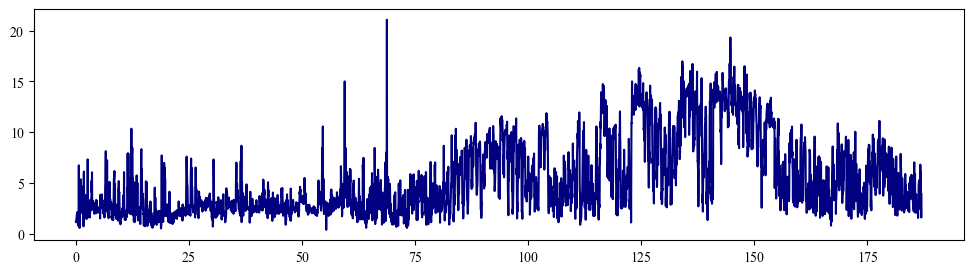

In [7]:
fig,ax = plt.subplots(1, figsize = (12,3))
t = np.arange(len(mae_evol_mixed_arpa_era5))/24
ax.plot(t,mae_evol_mixed_arpa_era5, color = 'navy')

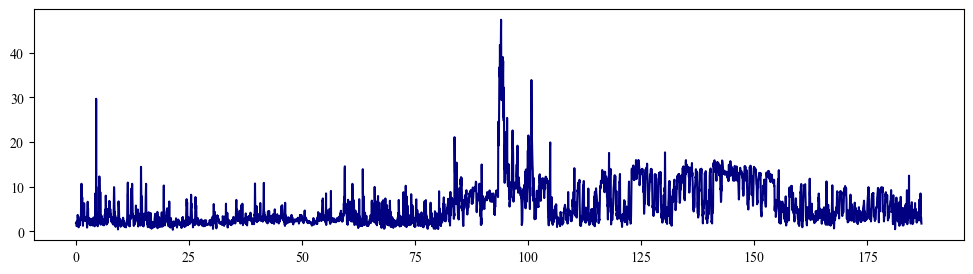

In [8]:
fig,ax = plt.subplots(1, figsize = (12,3))
t = np.arange(len(mae_evol_mixed_arpa_era5))/24
ax.plot(t,mae_evol_era5, color = 'navy')

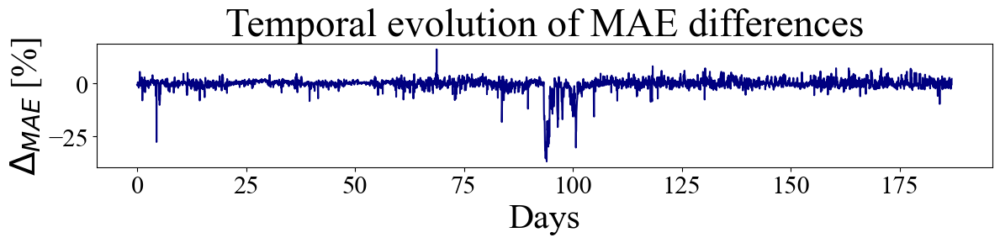

In [17]:
xfontsize = 30
yfontsize = 30
title_fontsize = 34
ticks_fontsize = 22

fig,ax = plt.subplots(1, figsize = (12,3))
t = np.arange(len(mae_evol_mixed_arpa_era5))/24
ax.plot(t,mae_evol_mixed_arpa_era5-mae_evol_era5, color = 'navy')
ax.set_xlabel("Days",fontsize = xfontsize)
ax.set_ylabel(r'$\Delta_{MAE}$ [%]',fontsize = yfontsize)
ax.set_title('Temporal evolution of MAE differences', fontsize = title_fontsize) 
ax.tick_params(labelsize = ticks_fontsize)    
fig.tight_layout()
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJun_temporal_evolution_humidity_mae_differences.png', dpi=150)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJun_temporal_evolution_humidity_mae_differences.png', dpi=150)


# Predict humidity over the whole area

This section shows how to derive all the temperature maps over the study area.

In [5]:
periods = [
 [2023,2,2,10],
 [2023,6,20,16]
]


In [6]:
ML = MachineLearningFFNN(model_type_name = 'ERA5',
                         model_period_name = 'NovJun',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_06_22/df_microclimate_era5_NovJun_out_30-06-2023_12-42-55.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'H_target',
                         max_n_neurons = 512,
                         min_n_neurons = 128,
                         n_layers = 3,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.load_model_properties(RESULTS_PATH+'/output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_era5/model_weights_humidity_era5__2022_11_12__2023_06_22/FFNN_humidity_era5_NovJun_out_01-07-2023_09-03-56')


Metal device set to: Apple M1


2023-07-03 17:53:58.831922: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-07-03 17:53:58.832015: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-07-03 17:53:58.938994: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open /Users/marcozanchi/Work/Grade/microclima/notebooks/results//output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_era5/model_weights_humidity_era5__2022_11_12__2023_06_22/FFNN_humidity_era5_NovJun_out_01-07-2023_09-03-56/model_weights: FAILED_PRECONDITION: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_wei

2023-07-03 17:54:10.313443: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


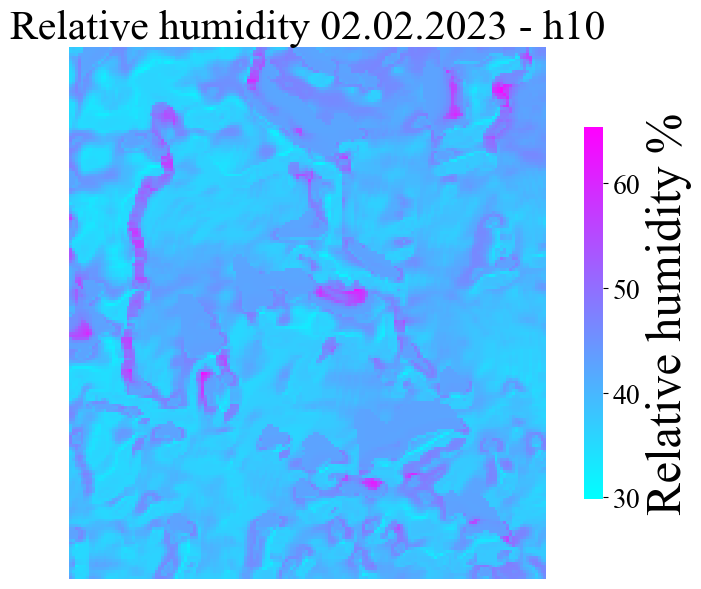

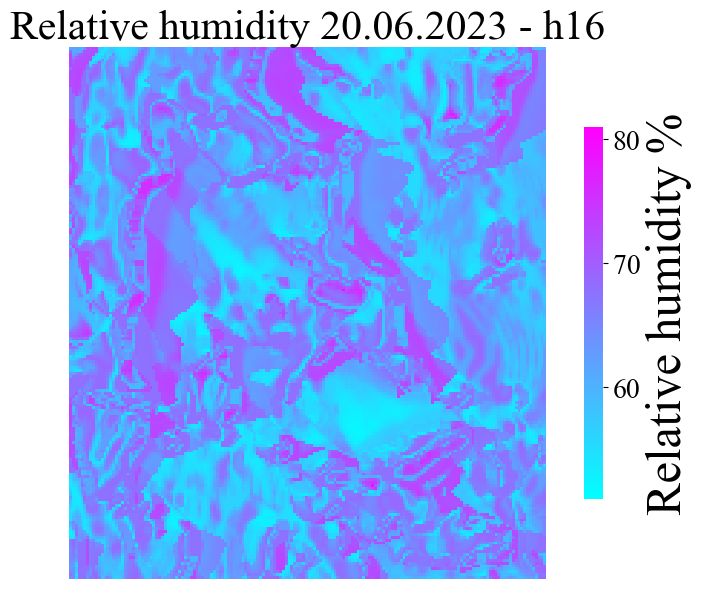

In [7]:
for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                             df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2022_11_12__2023_06_22.p'),
                                                             period = period, lat = lat, long = long,
                                                             dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                             ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                             save_figure=True,)
    
    fig.savefig(RESULTS_PATH+'figures/microclima_prediction_figures/era5_humidity_spacemap_{}_{}_{:02d}_{:02d}.png'.format(period[0], period[1], period[2], period[3]), dpi=150)


In [20]:
ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                         model_period_name = 'NovJun',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_06_22/df_microclimate_mixed_arpa_era5_NovJun_out_30-06-2023_12-42-55',              
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'H_target',
                         max_n_neurons = 1024,
                         min_n_neurons = 128,
                         n_layers = 4,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.load_model_properties(RESULTS_PATH+'/output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_mixed_arpa_era5/model_weights_humidity_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_humidity_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-56')


2023-07-03 18:07:10.424754: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open /Users/marcozanchi/Work/Grade/microclima/notebooks/results//output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_mixed_arpa_era5/model_weights_humidity_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_humidity_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-56/model_weights: FAILED_PRECONDITION: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_humidity/humidity_mixed_arpa_era5/model_weights_humidity_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_humidity_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-56/model_weights; Is a directory: perhaps your file is in a different file format and you need to use a different restore operator?
2023-07-03 18:07:10.473452: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


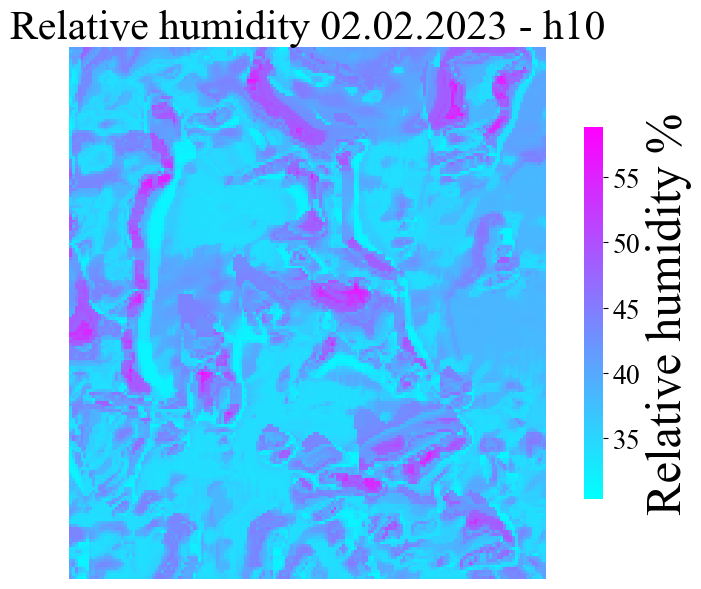

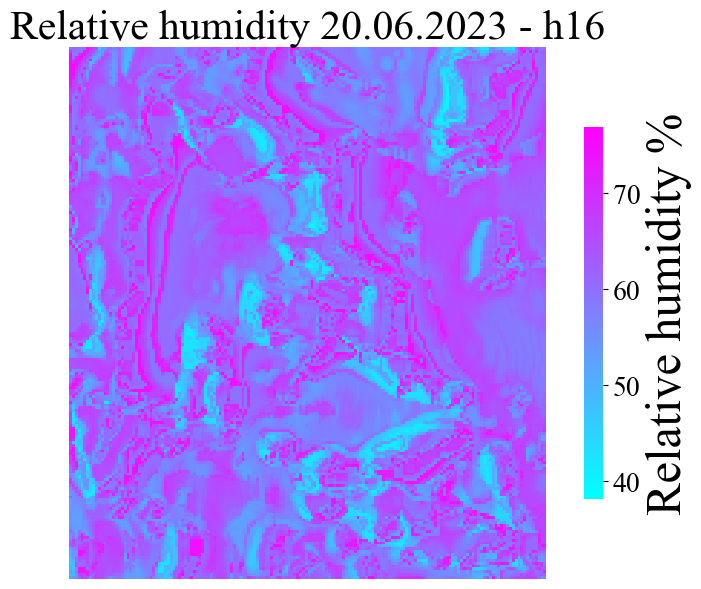

In [22]:
for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                             df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2022_11_12__2023_06_22.p'),
                                                             period = period, lat = lat, long = long,
                                                             dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                             ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                             save_figure=True,)
    
    fig.savefig(RESULTS_PATH+'figures/microclima_prediction_figures/mixed_arpa_era5_humidity_spacemap_{}_{}_{:02d}_{:02d}.png'.format(period[0], period[1], period[2], period[3]), dpi=150)
